# TinyTimeMixers Forecasting (Unsmoothed Data - Truncated Approach)
- IBM Documentation used: https://developer.ibm.com/tutorials/awb-foundation-model-time-series-forecasting/
- Github Copilot was used to aid in code generation in this notebook

In [81]:
# Get the Granite TSFM repository from GitHub
!git clone "https://github.com/ibm-granite/granite-tsfm.git"


fatal: destination path 'granite-tsfm' already exists and is not an empty directory.


In [82]:
# Core libraries
import os
import math
import tempfile
import torch
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# TSFM libraries
from tsfm_public.models.tinytimemixer import TinyTimeMixerForPrediction
from tsfm_public.toolkit.callbacks import TrackingCallback
from tsfm_public import (
    TimeSeriesPreprocessor,
    TinyTimeMixerForPrediction,
    TrackingCallback,
    count_parameters,
    get_datasets,
)

# TSFM Toolkit libraries
from tsfm_public.toolkit.util import select_by_index
from tsfm_public.toolkit.time_series_forecasting_pipeline import TimeSeriesForecastingPipeline
from tsfm_public.toolkit.visualization import plot_ts_forecasting

# Weights and Biases API Key needed for this notebook (can be obtained at https://wandb.ai)

In [83]:
# Load datasets
with open('../../data/processed_data_pickle_files_no_smoothing/test_data_no_batches.pkl', 'rb') as file:
    test_df = pickle.load(file)

with open('../../data/processed_data_pickle_files_no_smoothing/test_data_no_batches.pkl', 'rb') as file:
    train_df = pickle.load(file)

# Ensure data are dataframes
if not isinstance(test_df, pd.DataFrame):
    raise ValueError("Loaded data is not a pandas DataFrame.")

if not isinstance(train_df, pd.DataFrame):
    raise ValueError("Loaded data is not a pandas DataFrame.")

column_names = ['unit_number', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21']

train_df.columns = column_names

In [84]:
print(train_df.head(20))

    unit_number  sensor_2  sensor_3  sensor_4  sensor_6  sensor_7  sensor_8  \
0           1.0  0.678077 -0.853550 -1.191480  0.141683  0.601408 -0.798093   
1           1.0 -1.941707 -0.338137 -1.501467  0.141683  1.674769 -1.220725   
2           1.0 -0.441831 -0.584426 -0.843717  0.141683  0.838677 -0.657216   
3           1.0 -0.481827 -1.044384 -0.279297  0.141683  0.793483 -0.938970   
4           1.0 -0.341839 -0.543650 -0.779276  0.141683  0.895170 -1.220725   
5           1.0 -1.141773 -1.859911 -1.533688  0.141683  0.962961 -1.361602   
6           1.0 -1.141773 -1.171606 -0.454845  0.141683  0.590110 -0.657216   
7           1.0 -0.281844 -1.571215 -0.893715  0.141683  0.251154 -0.657216   
8           1.0 -1.601735  0.451294  0.371786  0.141683  1.268021 -0.516338   
9           1.0 -1.221767 -0.860075 -1.143704  0.141683  1.030752 -0.798093   
10          1.0 -1.281762 -1.548380 -0.567062  0.141683  1.493992 -0.798093   
11          1.0 -0.281844 -0.504505 -1.234812  0.141

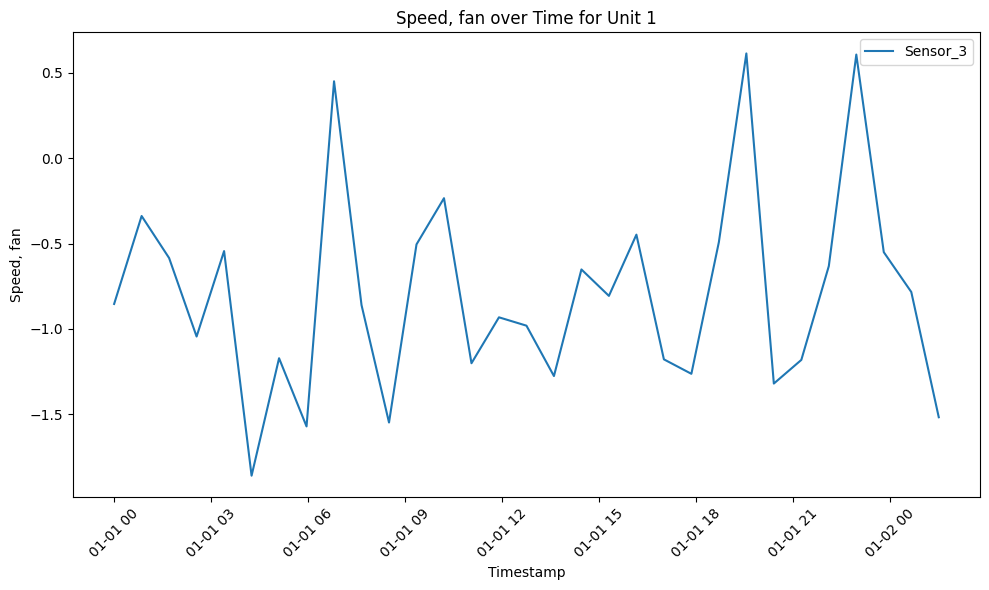

In [85]:
# Step 1 & 2: Efficiently add empty rows and timestamp for each unit_number
def expand_and_add_timestamp(df, num_empty_rows=50, start_date='2023-01-01'):
    dfs = []
    for unit_num, group in df.groupby('unit_number'):
        N = len(group)
        total_rows = N + (N - 1) * num_empty_rows
        # Create timestamps starting at midnight for each unit_number
        timestamps = pd.date_range(start=start_date, periods=total_rows, freq='min')
        # Create an empty DataFrame with timestamps
        expanded_group = pd.DataFrame({'timestamp': timestamps})
        # Calculate positions to insert the original data
        positions = np.arange(N) * (num_empty_rows + 1)
        # Assign unit_number to the expanded DataFrame
        expanded_group['unit_number'] = unit_num
        # Insert the original data into the correct positions
        expanded_group.loc[positions, group.columns] = group.values
        dfs.append(expanded_group)
    expanded_df = pd.concat(dfs, ignore_index=True)
    return expanded_df

# Step 3: Interpolate the missing values for each unit_number
def interpolate_missing_values(df):
    df = df.set_index(['unit_number', 'timestamp'])
    df = df.interpolate(method='linear')
    df = df.reset_index()
    return df


# Apply the steps to train_df
train_df = expand_and_add_timestamp(train_df)
train_df = interpolate_missing_values(train_df)

# Step 4: Plot 'Speed, fan' for unit_number = 1 over timestamp column
unit_1_data = train_df[train_df['unit_number'] == 1]
plt.figure(figsize=(10, 6))
plt.plot(unit_1_data['timestamp'], unit_1_data['sensor_3'], label='Sensor_3')
plt.xlabel('Timestamp')
plt.ylabel('Speed, fan')
plt.title('Speed, fan over Time for Unit 1')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [86]:
# Refine dataset
train_df = train_df.dropna()
train_df.columns

Index(['unit_number', 'timestamp', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21'],
      dtype='object')

# Forecasting

In [87]:
# Generate train/validation/test split configurations for each unit number in the dataset.
def generate_split_configs(input_df, context_length, unit_numbers=None):

    # If no unit numbers provided, get all unique unit numbers from the data
    if unit_numbers is None:
        unit_numbers = train_df['unit_number'].unique()

    split_configs = {}

    for unit in unit_numbers:
        # Filter data for current unit
        unit_data = input_df[input_df['unit_number'] == unit]
        #unit_data = unit_data.reset_index(drop=True)
        data_length = len(unit_data)

        # Calculate indices for train split (0 to 80%)
        train_start_index = 0
        train_end_index = round(data_length * 0.8)

        # Calculate indices for validation split (80% to 90%)
        # Shift back by context length to ensure first evaluation timestamp follows training data
        eval_start_index = round(data_length * 0.8) - context_length
        eval_end_index = round(data_length * 0.9)

        # Calculate indices for test split (90% to end)
        test_start_index = round(data_length * 0.9) - context_length
        test_end_index = data_length - 1

        # Create split configuration for current unit
        split_configs[unit] = {
            "train": [train_start_index, train_end_index],
            "valid": [eval_start_index, eval_end_index],
            "test": [test_start_index, test_end_index]
        }

    return list(split_configs.values())

In [88]:
# Function to determine actual vs predicted values
def compare_forecast(forecast, date_col, prediction_col, actual_col, delta):
  comparisons = pd.DataFrame()
  comparisons[date_col] = forecast[date_col]
  actual = []
  pred = []

  for i in range(len(forecast)):
    pred.append(forecast[prediction_col].values[i][delta - 1]) # prediction for next day
    actual.append(forecast[actual_col].values[i][delta - 1])

  comparisons['actual'] = actual
  comparisons['pred'] = pred

  return comparisons

In [89]:
print(train_df.columns)

Index(['unit_number', 'timestamp', 'sensor_2', 'sensor_3', 'sensor_4',
       'sensor_6', 'sensor_7', 'sensor_8', 'sensor_9', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21'],
      dtype='object')


In [90]:
# Set seed for reproducibility
SEED = 42
set_seed(SEED)

# Forecasting parameters
context_length = 512 # TTM can use 512 time points into the past
forecast_length = 96 # TTM can predict 96 time points into the future
fewshot_fraction = 0.05 # 5% of the data can be used for few-shot
prediction_filter = 96 # Filter this many predicted time points

# Set column parameters
timestamp_column = "timestamp"
target_columns = ["sensor_2"]
observable_columns = train_df.columns[3:]

# Set up Column Specifiers and Preprocessor
column_specifiers = {
    "timestamp_column": timestamp_column,
    "target_columns": target_columns,
    "observable_columns": observable_columns
}

{'train': [0, 1225], 'valid': [713, 1378], 'test': [866, 1530]}
931
Dataset for unit 1 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[-1.2311775297001062, -1.1982390641268836, -1.1653005985536609, -1.1323621329804383, -1.0994236674072155, -1.0664852018339928, -1.03354673626077, -1.0006082706875474, -0.9676698051143247, -0.934731339541102, -0.9017928739678793, -0.8688544083946566, -0.8359159428214339, -0.8029774772482112, -0.7700390116749884, -0.7371005461017658, -0.7041620805285431, -0.6712236149553203, -0.6382851493820977, -0.605346683808875, -0.5724082182356524, -0.5394697526624296, -0.5065312870892069, -0.47359282151598425, -0.4406543559427616, -0.4077158903695388, -0.37477742479631604, -0.3418389592230935, -0.3089004936498707, -0.27596202807664794, -0.24302356250342538, -0.2100850969302026, -0.17714663135697983, -0.14420816578375728, -0.1112697002105345, -0.07833123463731173, -0.04539276906408918, -0.012454303490866403, 0.020484162082356372, 0.053422627655578925, 0.0863610932288017, 0.11929955880202447, 0.15223802437524703, 0.1851764899484698, 0.21811495552169244, 0.209880339128389, 0.20164572273508555, 0.193

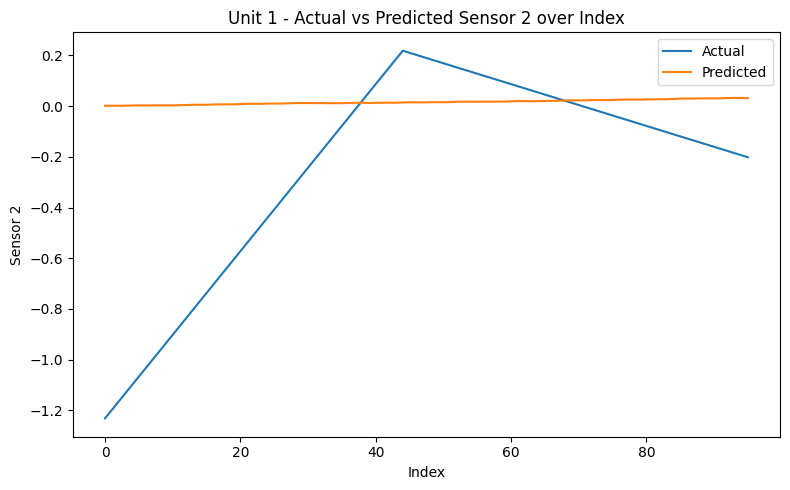

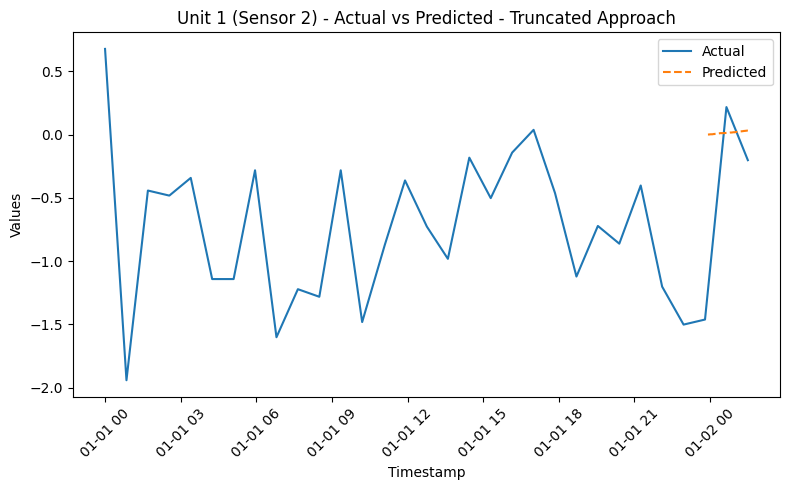

RMSE for Unit 1 - sensor_2: 0.4656948328710356
{'train': [0, 1959], 'valid': [1447, 2204], 'test': [1692, 2448]}
1849
Dataset for unit 2 is good


  0%|          | 0/8 [00:00<?, ?it/s]

96
[0.2804627653568354, 0.27222814896352754, 0.2639935325702196, 0.2557589161769117, 0.2475242997836038, 0.23928968339029588, 0.231055066996988, 0.22282045060368008, 0.2145858342103722, 0.20635121781706428, 0.19811660142375637, 0.18988198503044848, 0.18164736863714057, 0.17341275224383268, 0.16517813585052477, 0.15694351945721685, 0.14870890306390896, 0.14047428667060105, 0.13223967027729314, 0.12400505388398525, 0.11577043749067734, 0.10753582109736942, 0.09930120470406154, 0.09106658831075362, 0.08283197191744573, 0.07459735552413782, 0.0663627391308299, 0.05812812273752199, 0.049893506344214134, 0.04165888995090622, 0.033424273557598305, 0.02518965716429039, 0.016955040770982477, 0.008720424377674618, 0.000485807984366704, -0.00774880840894121, -0.015983424802249124, -0.02421804119555704, -0.03245265758886495, -0.04068727398217281, -0.048921890375480725, -0.05715650676878864, -0.06539112316209655, -0.07362573955540447, -0.08186035594871231, -0.08538947726013062, -0.08891859857154893

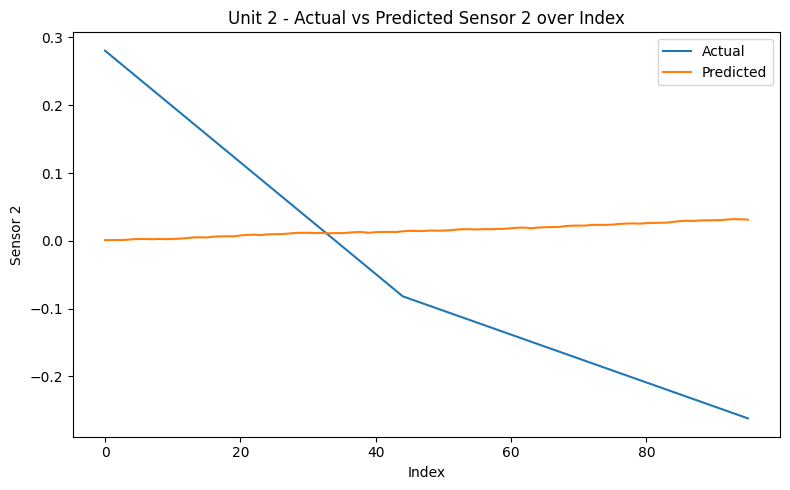

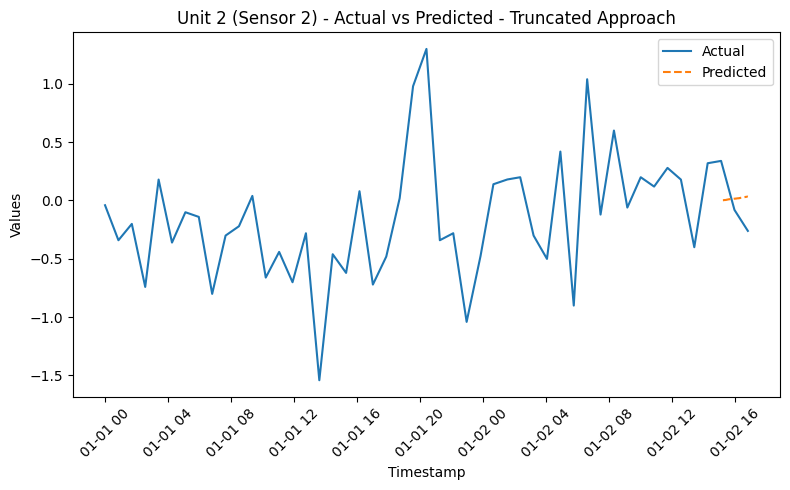

RMSE for Unit 2 - sensor_2: 0.17864208793925032
{'train': [0, 5101], 'valid': [4589, 5738], 'test': [5226, 6375]}
5776
Dataset for unit 3 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[0.8074782145283228, 0.8145364571511594, 0.821594699773996, 0.8286529423968326, 0.8357111850196692, 0.8427694276425058, 0.8498276702653424, 0.8568859128881791, 0.8639441555110157, 0.8710023981338524, 0.878060640756689, 0.8851188833795256, 0.8921771260023622, 0.8992353686251988, 0.9062936112480354, 0.913351853870872, 0.9204100964937086, 0.9274683391165452, 0.934526581739382, 0.9415848243622186, 0.9486430669850552, 0.9557013096078918, 0.9627595522307284, 0.969817794853565, 0.9768760374764016, 0.9839342800992382, 0.9909925227220748, 0.9980507653449116, 1.005109007967748, 1.0121672505905848, 1.0192254932134213, 1.026283735836258, 1.0333419784590947, 1.0404002210819312, 1.0474584637047677, 1.0545167063276044, 1.0615749489504411, 1.0686331915732776, 1.0756914341961143, 1.0827496768189508, 1.0898079194417876, 1.0968661620646243, 1.1039244046874608, 1.1109826473102973, 1.118040889933134, 1.1039244046874652, 1.0898079194417964, 1.0756914341961277, 1.061574948950459, 1.0474584637047901, 1.033

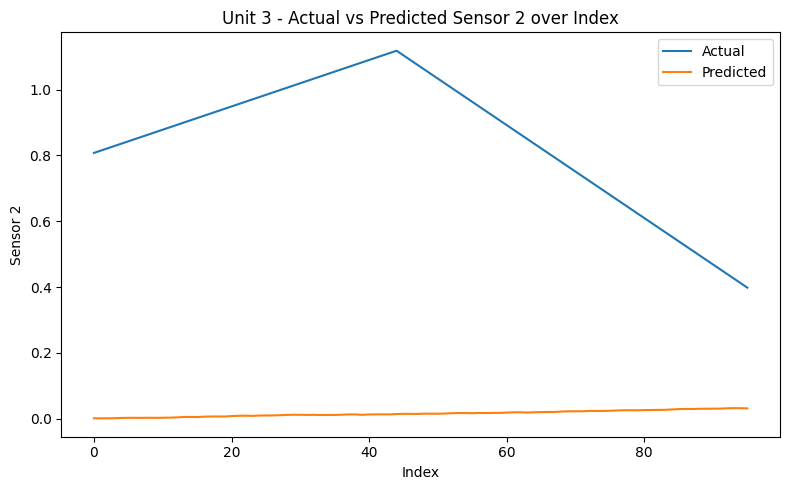

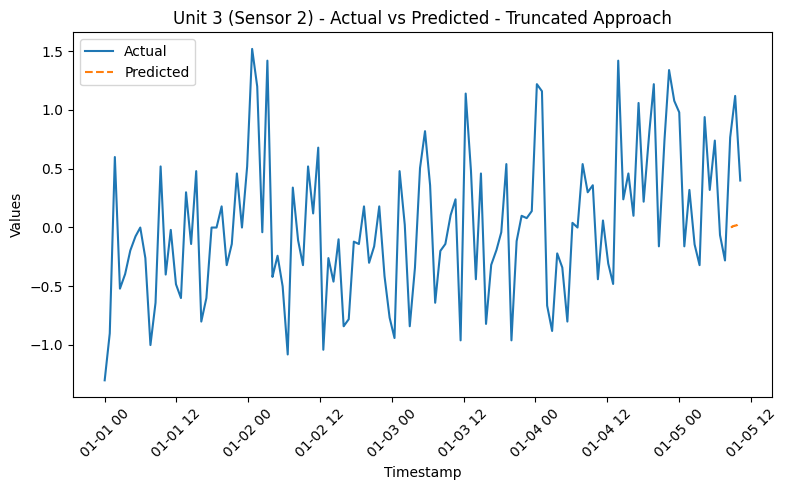

RMSE for Unit 3 - sensor_2: 0.8585086274922411
{'train': [0, 4285], 'valid': [3773, 4820], 'test': [4308, 5355]}
4756
Dataset for unit 4 is good


  0%|          | 0/45 [00:00<?, ?it/s]

96
[0.29144225388123407, 0.28477613584855455, 0.278110017815875, 0.2714438997831955, 0.264777781750516, 0.25811166371783645, 0.2514455456851569, 0.2447794276524774, 0.23811330961979787, 0.23144719158711835, 0.22478107355443883, 0.2181149555217593, 0.21144883748907978, 0.20478271945640025, 0.19811660142372073, 0.1914504833910412, 0.18478436535836168, 0.17811824732568216, 0.17145212929300263, 0.1647860112603231, 0.15811989322764358, 0.15145377519496406, 0.14478765716228453, 0.138121539129605, 0.13145542109692548, 0.12478930306424596, 0.11812318503156644, 0.11145706699888691, 0.10479094896620739, 0.09812483093352786, 0.09145871290084834, 0.08479259486816881, 0.07812647683548929, 0.07146035880280976, 0.06479424077013024, 0.058128122737450716, 0.05146200470477119, 0.04479588667209167, 0.03812976863941214, 0.03146365060673262, 0.024797532574053094, 0.01813141454137357, 0.011465296508694045, 0.004799178476014521, -0.0018669395566650105, 0.0020543063449103933, 0.005975552246485797, 0.009896798

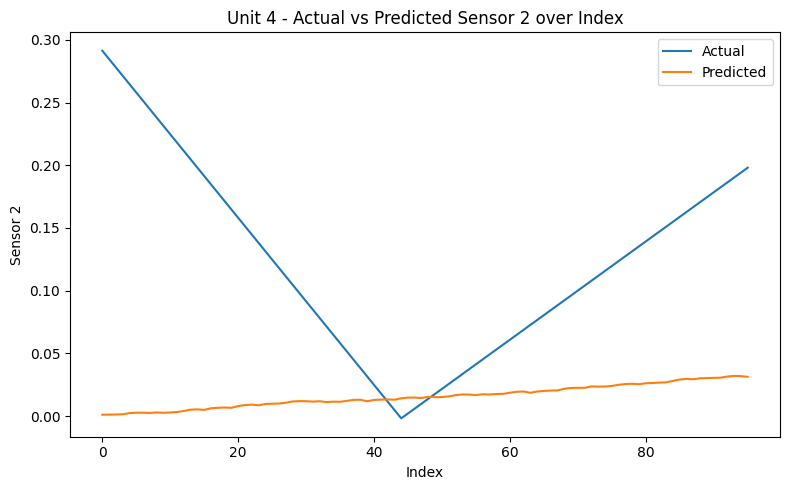

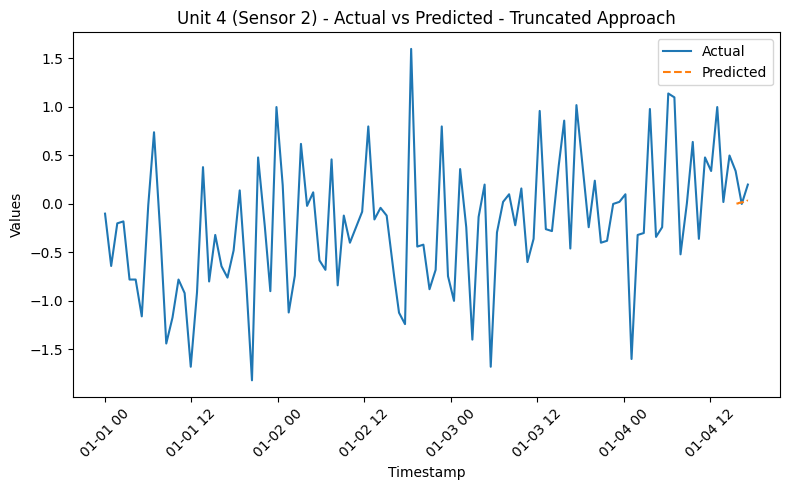

RMSE for Unit 4 - sensor_2: 0.13146689252048796
{'train': [0, 3958], 'valid': [3446, 4453], 'test': [3941, 4947]}
4348
Dataset for unit 5 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[0.06087299486869748, 0.06126511945885458, 0.06165724404901167, 0.06204936863916877, 0.062441493229325865, 0.06283361781948296, 0.06322574240964005, 0.06361786699979714, 0.06400999158995424, 0.06440211618011134, 0.06479424077026844, 0.06518636536042552, 0.06557848995058262, 0.06597061454073971, 0.06636273913089681, 0.06675486372105391, 0.06714698831121099, 0.06753911290136809, 0.06793123749152519, 0.06832336208168228, 0.06871548667183938, 0.06910761126199647, 0.06949973585215356, 0.06989186044231066, 0.07028398503246776, 0.07067610962262486, 0.07106823421278194, 0.07146035880293904, 0.07185248339309613, 0.07224460798325323, 0.07263673257341033, 0.07302885716356743, 0.07342098175372451, 0.07381310634388161, 0.0742052309340387, 0.0745973555241958, 0.07498948011435289, 0.07538160470451, 0.07577372929466708, 0.07616585388482418, 0.07655797847498128, 0.07695010306513836, 0.07734222765529547, 0.07773435224545255, 0.07812647683560965, 0.06048087027852256, 0.04283526372143547, 0.02518965716

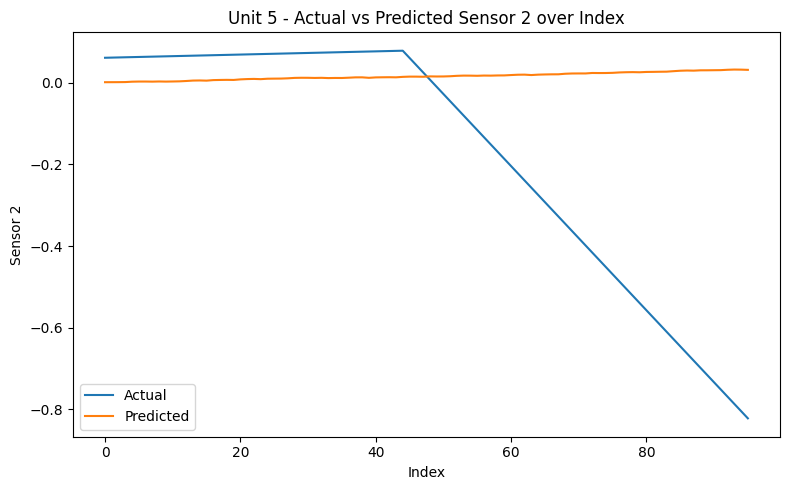

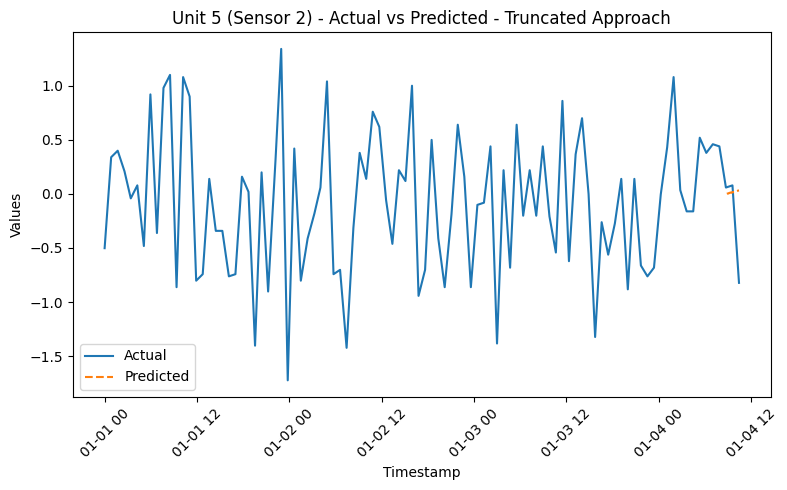

RMSE for Unit 5 - sensor_2: 0.3543291742498909
{'train': [0, 4244], 'valid': [3732, 4774], 'test': [4262, 5304]}
4705
Dataset for unit 6 is good


  0%|          | 0/44 [00:00<?, ?it/s]

96
[-1.3425409133048771, -1.339796041173773, -1.3370511690426687, -1.3343062969115647, -1.3315614247804606, -1.3288165526493565, -1.3260716805182524, -1.3233268083871483, -1.320581936256044, -1.31783706412494, -1.3150921919938359, -1.3123473198627318, -1.3096024477316277, -1.3068575756005236, -1.3041127034694193, -1.3013678313383152, -1.2986229592072112, -1.295878087076107, -1.293133214945003, -1.2903883428138987, -1.2876434706827946, -1.2848985985516905, -1.2821537264205864, -1.2794088542894824, -1.2766639821583783, -1.273919110027274, -1.27117423789617, -1.2684293657650658, -1.2656844936339617, -1.2629396215028577, -1.2601947493717534, -1.2574498772406493, -1.2547050051095452, -1.251960132978441, -1.249215260847337, -1.246470388716233, -1.2437255165851286, -1.2409806444540246, -1.2382357723229205, -1.2354909001918164, -1.2327460280607123, -1.230001155929608, -1.227256283798504, -1.2245114116673999, -1.2217665395362958, -1.1833383297008693, -1.1449101198654428, -1.1064819100300163, -1

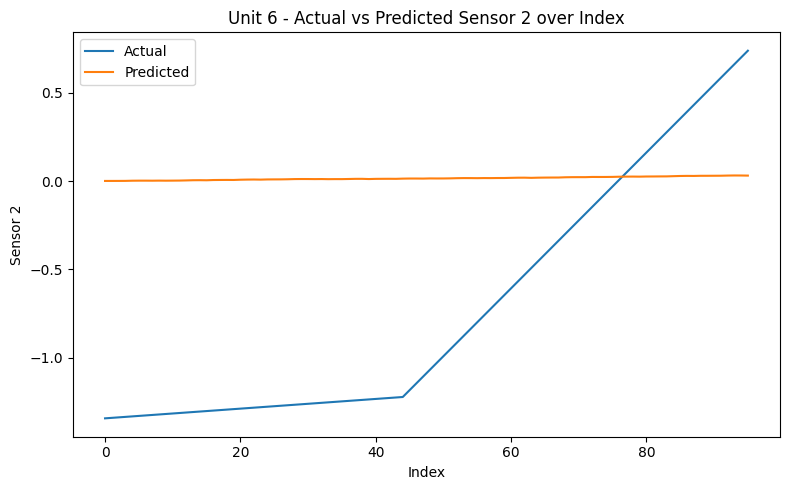

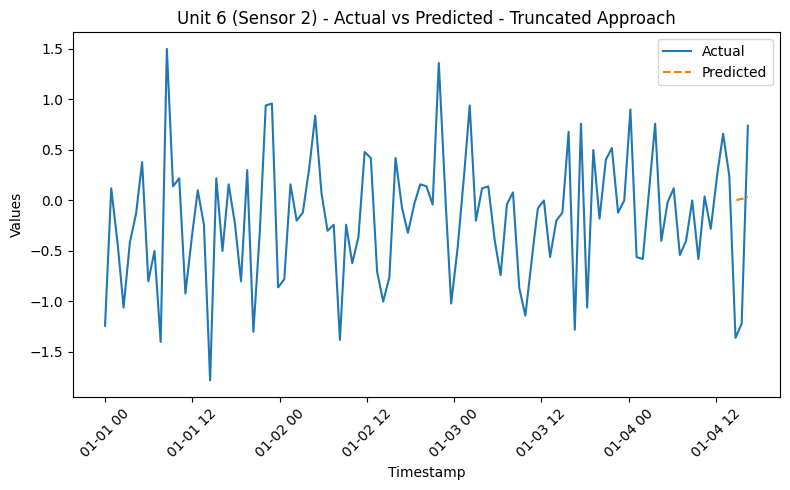

RMSE for Unit 6 - sensor_2: 0.9895360968293084
{'train': [0, 6488], 'valid': [5976, 7299], 'test': [6787, 8109]}
7510
Dataset for unit 7 is good


  0%|          | 0/79 [00:00<?, ?it/s]

96
[-0.19204736578288711, -0.1963607362746196, -0.2006741067663521, -0.2049874772580846, -0.2093008477498171, -0.2136142182415496, -0.2179275887332821, -0.2222409592250146, -0.2265543297167471, -0.2308677002084796, -0.2351810707002121, -0.2394944411919446, -0.2438078116836771, -0.2481211821754096, -0.2524345526671421, -0.2567479231588746, -0.2610612936506071, -0.26537466414233957, -0.2696880346340721, -0.2740014051258046, -0.2783147756175371, -0.28262814610926956, -0.2869415166010021, -0.2912548870927346, -0.2955682575844671, -0.29988162807619956, -0.3041949985679321, -0.3085083690596646, -0.3128217395513971, -0.31713511004312955, -0.3214484805348621, -0.3257618510265946, -0.3300752215183271, -0.33438859201005955, -0.3387019625017921, -0.3430153329935246, -0.3473287034852571, -0.35164207397698954, -0.35595544446872207, -0.3602688149604546, -0.36458218545218707, -0.36889555594391954, -0.37320892643565207, -0.3775222969273846, -0.38183566741911706, -0.39712852643525715, -0.41242138545139

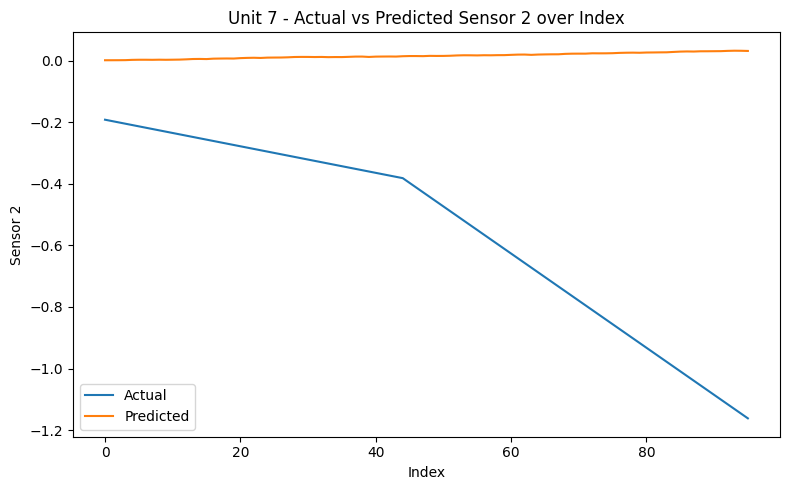

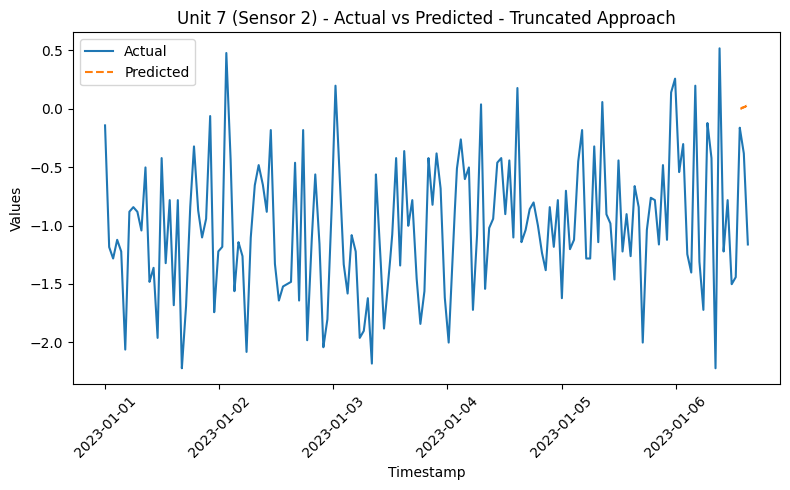

RMSE for Unit 7 - sensor_2: 0.6422159849682805
{'train': [0, 6733], 'valid': [6221, 7574], 'test': [7062, 8415]}
7816
Dataset for unit 8 is good


  0%|          | 0/83 [00:00<?, ?it/s]

96
[0.21184096207930372, 0.23379993912811886, 0.255758916176934, 0.27771789322574914, 0.29967687027456424, 0.32163584732337935, 0.3435948243721945, 0.3655538014210096, 0.3875127784698248, 0.4094717555186399, 0.431430732567455, 0.4533897096162702, 0.4753486866650853, 0.49730766371390045, 0.5192666407627156, 0.5412256178115307, 0.5631845948603458, 0.5851435719091609, 0.6071025489579761, 0.6290615260067912, 0.6510205030556063, 0.6729794801044214, 0.6949384571532365, 0.7168974342020518, 0.7388564112508669, 0.760815388299682, 0.7827743653484971, 0.8047333423973122, 0.8266923194461274, 0.8486512964949425, 0.8706102735437576, 0.8925692505925727, 0.9145282276413879, 0.9364872046902031, 0.9584461817390182, 0.9804051587878333, 1.0023641358366484, 1.0243231128854635, 1.0462820899342786, 1.0682410669830937, 1.0902000440319088, 1.112159021080724, 1.1341179981295393, 1.1560769751783544, 1.1780359522271695, 1.1513714800964647, 1.12470700796576, 1.0980425358350554, 1.0713780637043506, 1.04471359157364

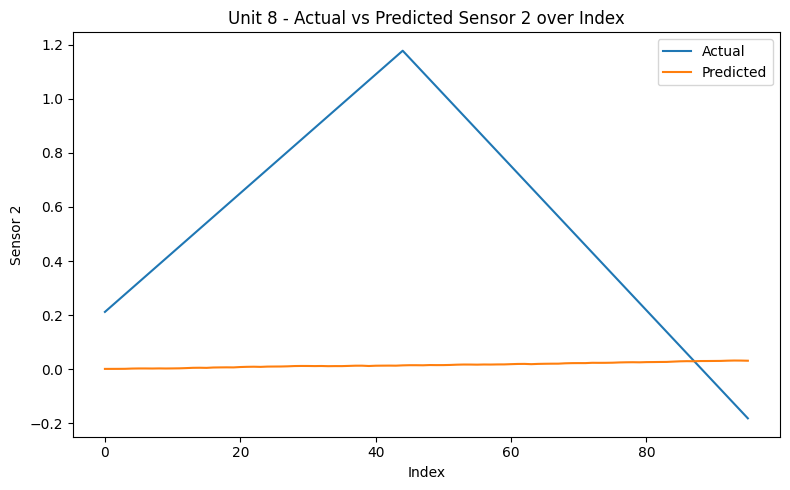

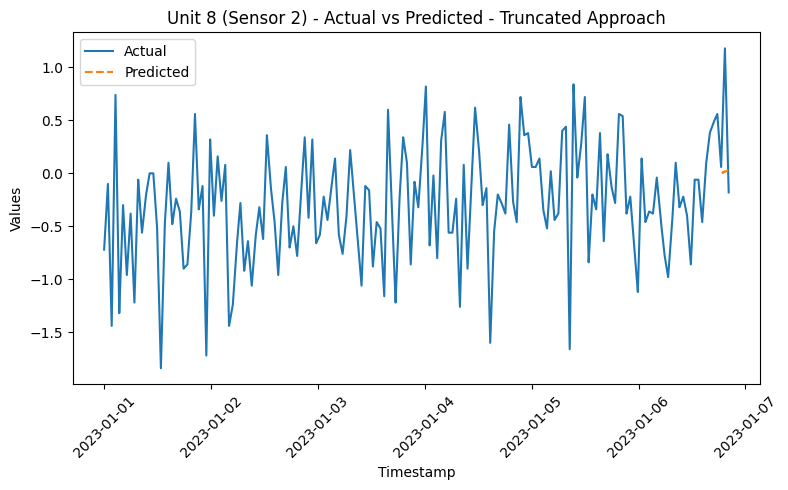

RMSE for Unit 8 - sensor_2: 0.6752157002408687
{'train': [0, 2204], 'valid': [1692, 2480], 'test': [1968, 2754]}
2155
Dataset for unit 9 is good


  0%|          | 0/12 [00:00<?, ?it/s]

96
[-0.008533057589264315, -0.035197529719969034, -0.06186200185067375, -0.08852647398137847, -0.11519094611208319, -0.14185541824278797, -0.1685198903734927, -0.1951843625041974, -0.22184883463490213, -0.24851330676560685, -0.27517777889631156, -0.3018422510270163, -0.32850672315772106, -0.3551711952884257, -0.3818356674191305, -0.40850013954983516, -0.43516461168053994, -0.4618290838112447, -0.4884935559419494, -0.5151580280726542, -0.5418225002033588, -0.5684869723340635, -0.5951514444647683, -0.6218159165954731, -0.6484803887261776, -0.6751448608568824, -0.7018093329875872, -0.728473805118292, -0.7551382772489967, -0.7818027493797013, -0.8084672215104061, -0.8351316936411108, -0.8617961657718154, -0.8884606379025202, -0.9151251100332249, -0.9417895821639297, -0.9684540542946345, -0.995118526425339, -1.0217829985560438, -1.0484474706867486, -1.0751119428174534, -1.1017764149481581, -1.1284408870788627, -1.1551053592095675, -1.1817698313402722, -1.1747115887174402, -1.167653346094608

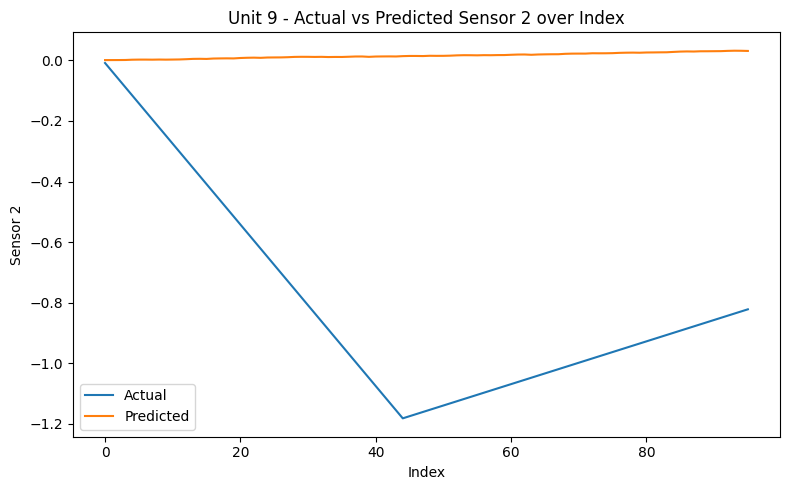

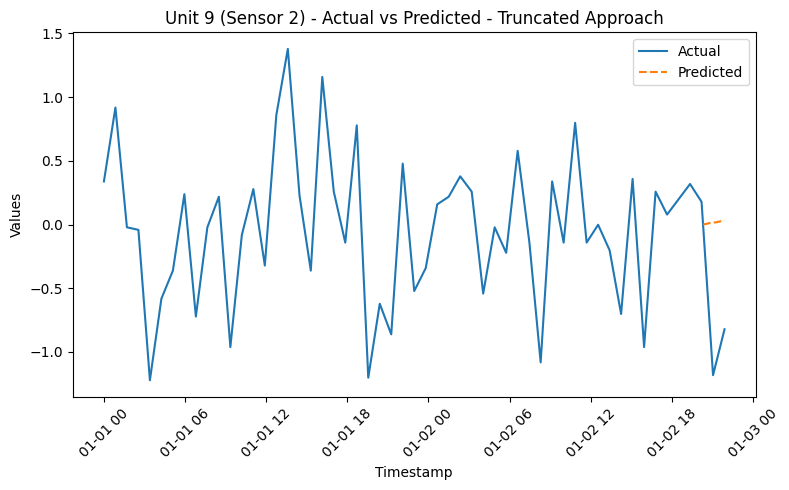

RMSE for Unit 9 - sensor_2: 0.8870261215246753
{'train': [0, 7794], 'valid': [7282, 8768], 'test': [8256, 9741]}
9142
Dataset for unit 10 is good


  0%|          | 0/99 [00:00<?, ?it/s]

96
[0.08949808995010299, 0.07969497519616671, 0.06989186044223043, 0.06008874568829414, 0.05028563093435787, 0.04048251618042159, 0.030679401426485314, 0.02087628667254901, 0.011073171918612734, 0.001270057164676458, -0.008533057589259818, -0.018336172343196094, -0.0281392870971324, -0.037942401851068674, -0.04774551660500495, -0.05754863135894123, -0.0673517461128775, -0.07715486086681378, -0.08695797562075008, -0.09676109037468633, -0.10656420512862264, -0.11636731988255894, -0.1261704346364952, -0.1359735493904315, -0.14577666414436774, -0.15557977889830404, -0.16538289365224035, -0.1751860084061766, -0.1849891231601129, -0.19479223791404915, -0.20459535266798545, -0.21439846742192176, -0.224201582175858, -0.2340046969297943, -0.24380781168373056, -0.25361092643766686, -0.26341404119160317, -0.2732171559455394, -0.2830202706994757, -0.29282338545341197, -0.30262650020734827, -0.3124296149612845, -0.3222327297152208, -0.3320358444691571, -0.34183895922309343, -0.32262485430537796, -0

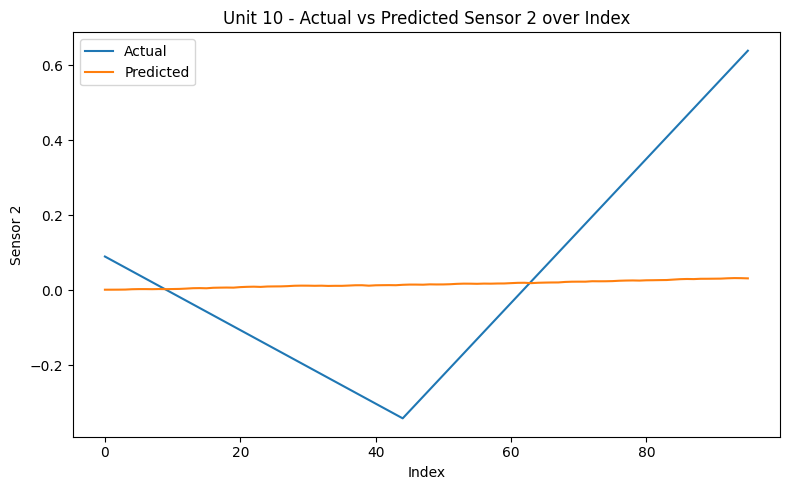

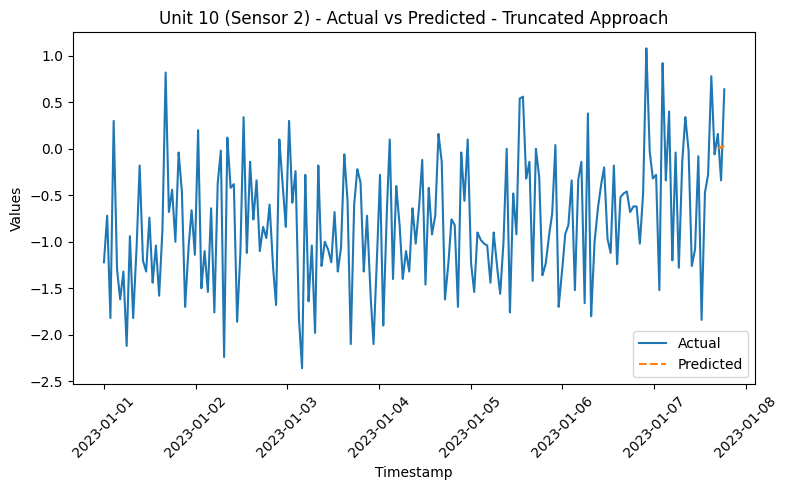

RMSE for Unit 10 - sensor_2: 0.258999762862002
{'train': [0, 3346], 'valid': [2834, 3765], 'test': [3253, 4182]}
3583
Dataset for unit 11 is good


  0%|          | 0/30 [00:00<?, ?it/s]

96
[0.21733070634150306, 0.2400739325706324, 0.26281715879976175, 0.28556038502889103, 0.30830361125802036, 0.3310468374871497, 0.353790063716279, 0.3765332899454083, 0.39927651617453763, 0.42201974240366696, 0.4447629686327963, 0.46750619486192563, 0.4902494210910549, 0.5129926473201842, 0.5357358735493136, 0.5584790997784429, 0.5812223260075722, 0.6039655522367016, 0.6267087784658308, 0.6494520046949602, 0.6721952309240895, 0.6949384571532188, 0.7176816833823482, 0.7404249096114774, 0.7631681358406068, 0.7859113620697361, 0.8086545882988654, 0.8313978145279948, 0.854141040757124, 0.8768842669862534, 0.8996274932153827, 0.922370719444512, 0.9451139456736414, 0.9678571719027707, 0.9906003981319, 1.0133436243610294, 1.0360868505901586, 1.058830076819288, 1.0815733030484174, 1.1043165292775465, 1.127059755506676, 1.1498029817358053, 1.1725462079649345, 1.1952894341940639, 1.2180326604231932, 1.1839178210794947, 1.1498029817357964, 1.115688142392098, 1.0815733030483994, 1.047458463704701,

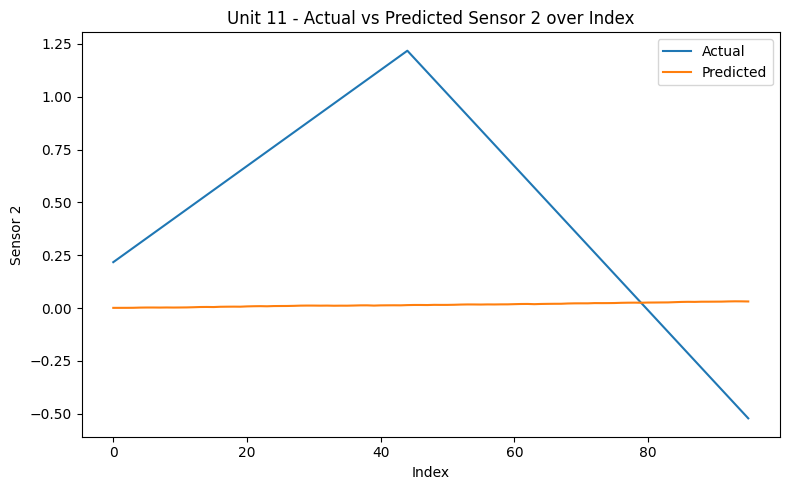

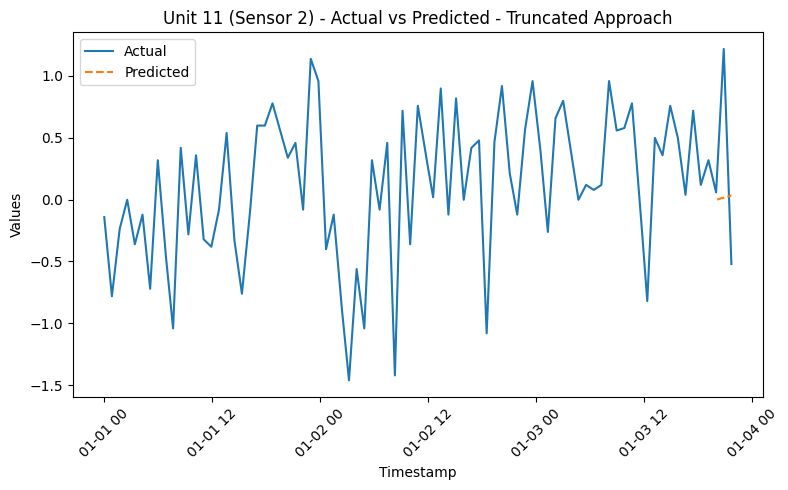

RMSE for Unit 11 - sensor_2: 0.6807181666863994
{'train': [0, 8814], 'valid': [8302, 9915], 'test': [9403, 11016]}
10417
Dataset for unit 12 is good


  0%|          | 0/115 [00:00<?, ?it/s]

96
[0.06048087027838436, 0.032247899787051254, 0.004014929295718173, -0.024218041195614937, -0.052451011686948046, -0.08068398217828116, -0.10891695266961426, -0.13714992316094737, -0.16538289365228048, -0.1936158641436136, -0.2218488346349467, -0.25008180512627975, -0.27831477561761286, -0.306547746108946, -0.3347807166002791, -0.3630136870916122, -0.3912466575829453, -0.4194796280742784, -0.4477125985656115, -0.47594556905694463, -0.5041785395482777, -0.5324115100396108, -0.560644480530944, -0.5888774510222771, -0.6171104215136102, -0.6453433920049433, -0.6735763624962764, -0.7018093329876095, -0.7300423034789426, -0.7582752739702756, -0.7865082444616087, -0.8147412149529418, -0.8429741854442749, -0.871207155935608, -0.8994401264269412, -0.9276730969182743, -0.9559060674096074, -0.9841390379009405, -1.0123720083922736, -1.0406049788836067, -1.0688379493749398, -1.097070919866273, -1.125303890357606, -1.1535368608489391, -1.1817698313402722, -1.1621636018323998, -1.142557372324527, -1

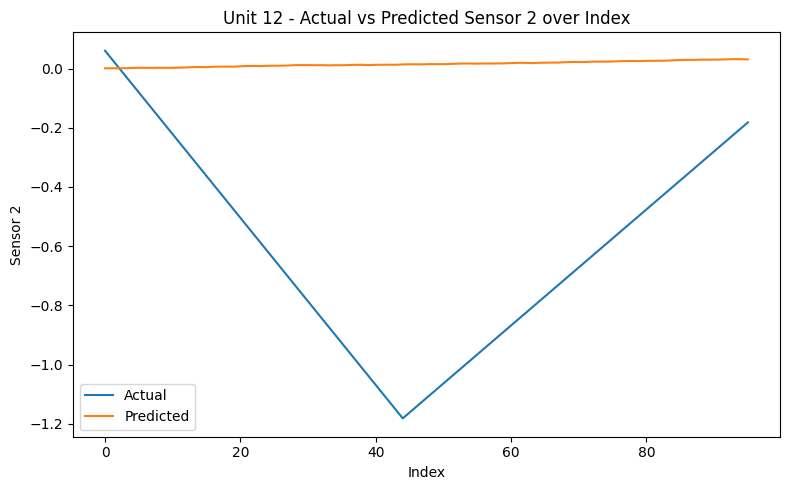

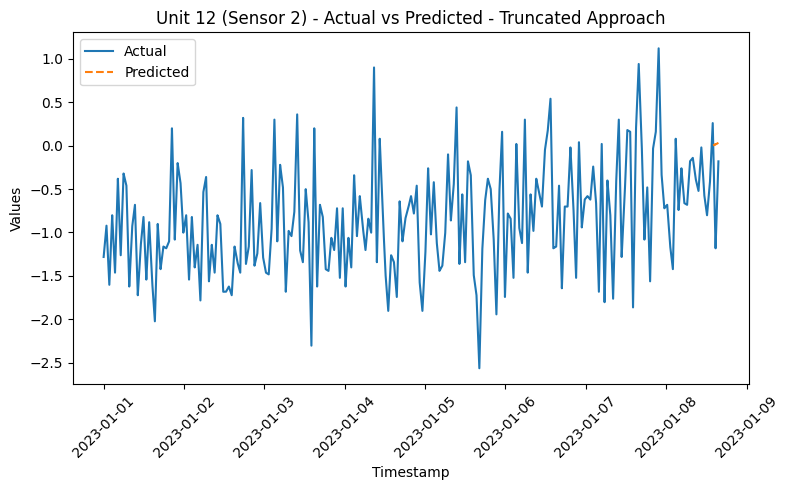

RMSE for Unit 12 - sensor_2: 0.717537538862203
{'train': [0, 7916], 'valid': [7404, 8906], 'test': [8394, 9894]}
9295
Dataset for unit 13 is good


  0%|          | 0/101 [00:00<?, ?it/s]

96
[-0.4041867690580403, -0.3959521526647368, -0.38771753627143335, -0.37948291987812993, -0.3712483034848265, -0.36301368709152304, -0.35477907069821957, -0.34654445430491615, -0.33830983791161273, -0.33007522151830926, -0.3218406051250058, -0.31360598873170237, -0.30537137233839895, -0.2971367559450955, -0.288902139551792, -0.2806675231584886, -0.27243290676518517, -0.2641982903718817, -0.2559636739785782, -0.2477290575852748, -0.23949444119197136, -0.2312598247986679, -0.22302520840536447, -0.21479059201206102, -0.2065559756187576, -0.19832135922545413, -0.19008674283215066, -0.18185212643884724, -0.17361751004554382, -0.16538289365224035, -0.15714827725893687, -0.14891366086563346, -0.14067904447233004, -0.13244442807902657, -0.12420981168572309, -0.11597519529241967, -0.10774057889911626, -0.09950596250581278, -0.09127134611250931, -0.08303672971920589, -0.07480211332590248, -0.066567496932599, -0.05833288053929553, -0.05009826414599211, -0.041863647752688665, -0.05323526086725332

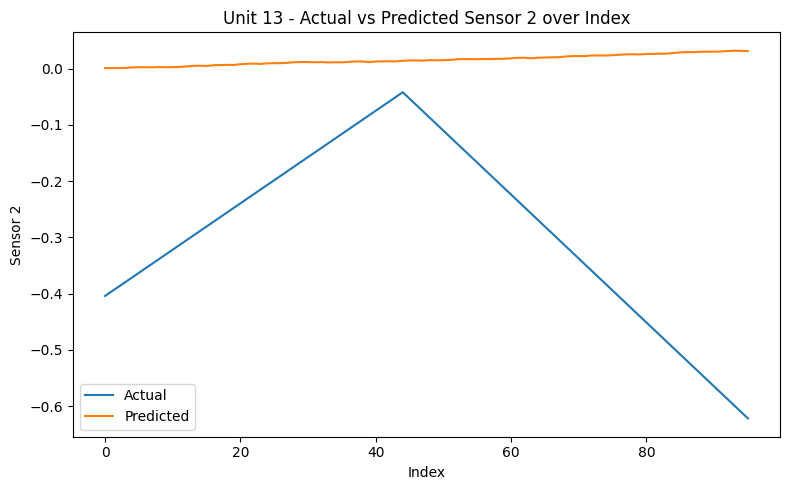

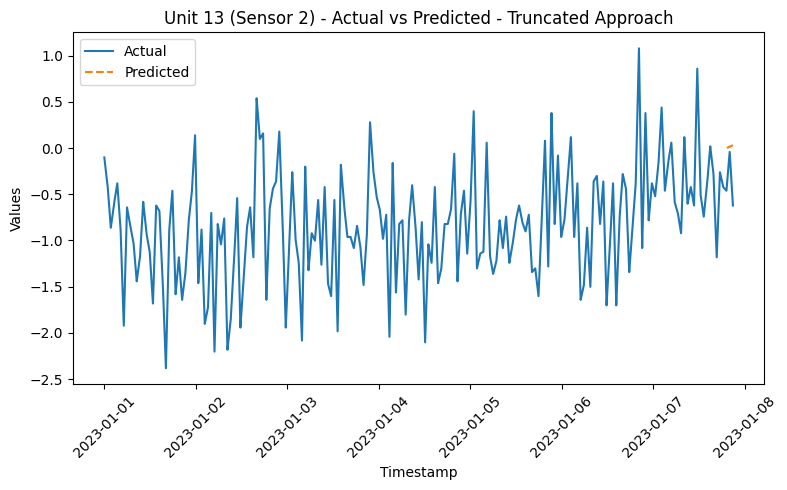

RMSE for Unit 13 - sensor_2: 0.3387094598514192
{'train': [0, 1837], 'valid': [1325, 2066], 'test': [1554, 2295]}
1696
Dataset for unit 14 is good


  0%|          | 0/6 [00:00<?, ?it/s]

96
[0.2718360243732456, 0.2737966473240355, 0.2757572702748255, 0.2777178932256154, 0.2796785161764053, 0.2816391391271953, 0.2835997620779852, 0.2855603850287751, 0.28752100797956504, 0.289481630930355, 0.2914422538811449, 0.29340287683193483, 0.2953634997827248, 0.2973241227335147, 0.29928474568430463, 0.30124536863509455, 0.3032059915858845, 0.30516661453667443, 0.30712723748746434, 0.3090878604382543, 0.31104848338904423, 0.31300910633983414, 0.3149697292906241, 0.316930352241414, 0.31889097519220394, 0.3208515981429939, 0.3228122210937838, 0.32477284404457374, 0.32673346699536365, 0.3286940899461536, 0.33065471289694354, 0.33261533584773345, 0.3345759587985234, 0.33653658174931333, 0.33849720470010325, 0.34045782765089316, 0.34241845060168313, 0.34437907355247305, 0.34633969650326296, 0.34830031945405293, 0.35026094240484285, 0.35222156535563276, 0.3541821883064227, 0.35614281125721264, 0.35810343420800256, 0.36006405715878803, 0.3620246801095735, 0.363985303060359, 0.365945926011

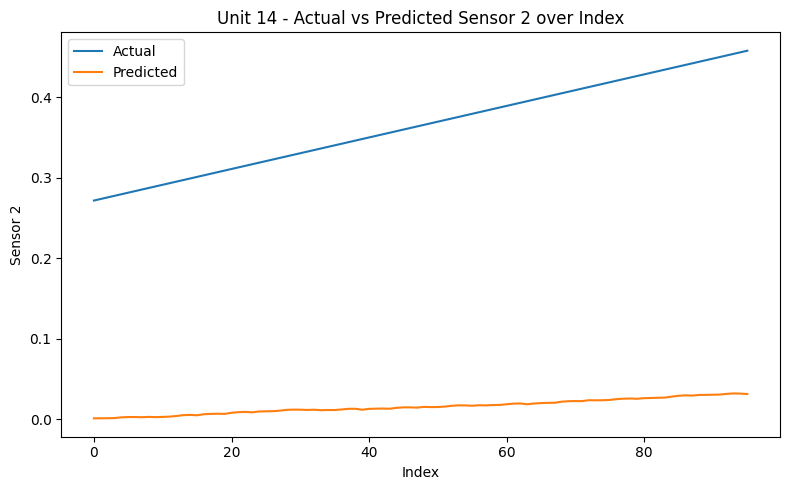

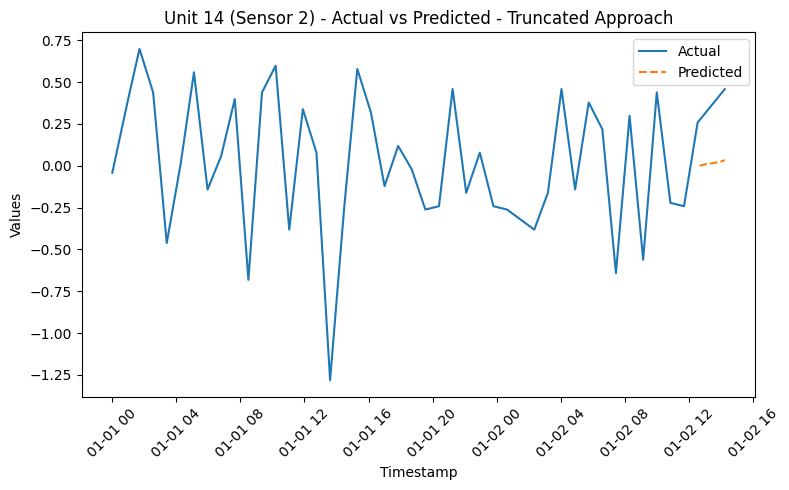

RMSE for Unit 14 - sensor_2: 0.35221950694015164
{'train': [0, 3061], 'valid': [2549, 3443], 'test': [2931, 3825]}
3226
Dataset for unit 15 is good


  0%|          | 0/25 [00:00<?, ?it/s]

96
[-1.2194137919954868, -1.2076500542907607, -1.1958863165860345, -1.1841225788813083, -1.1723588411765822, -1.1605951034718558, -1.1488313657671296, -1.1370676280624035, -1.1253038903576773, -1.1135401526529511, -1.1017764149482248, -1.0900126772434986, -1.0782489395387724, -1.0664852018340463, -1.0547214641293199, -1.0429577264245937, -1.0311939887198676, -1.0194302510151414, -1.007666513310415, -0.9959027756056889, -0.9841390379009627, -0.9723753001962365, -0.9606115624915104, -0.9488478247867841, -0.9370840870820578, -0.9253203493773317, -0.9135566116726055, -0.9017928739678792, -0.8900291362631529, -0.8782653985584268, -0.8665016608537006, -0.8547379231489745, -0.8429741854442482, -0.8312104477395219, -0.8194467100347957, -0.8076829723300696, -0.7959192346253433, -0.7841554969206171, -0.7723917592158909, -0.7606280215111647, -0.7488642838064384, -0.7371005461017123, -0.7253368083969861, -0.7135730706922598, -0.7018093329875337, -0.6955353395450157, -0.6892613461024977, -0.6829873

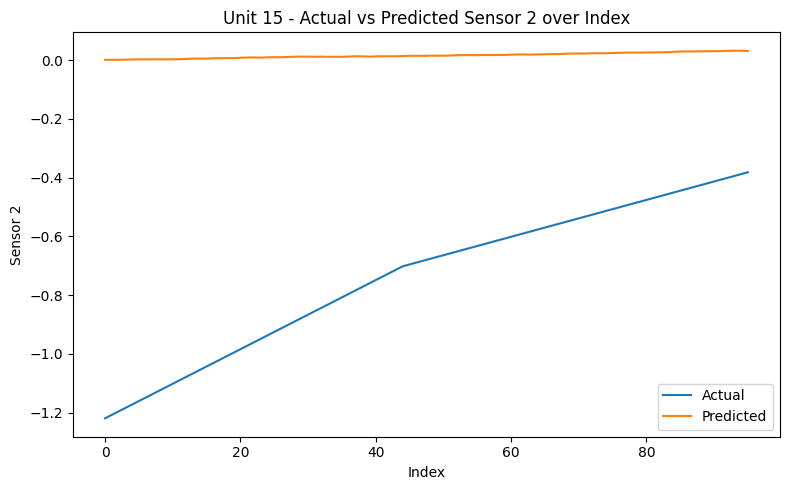

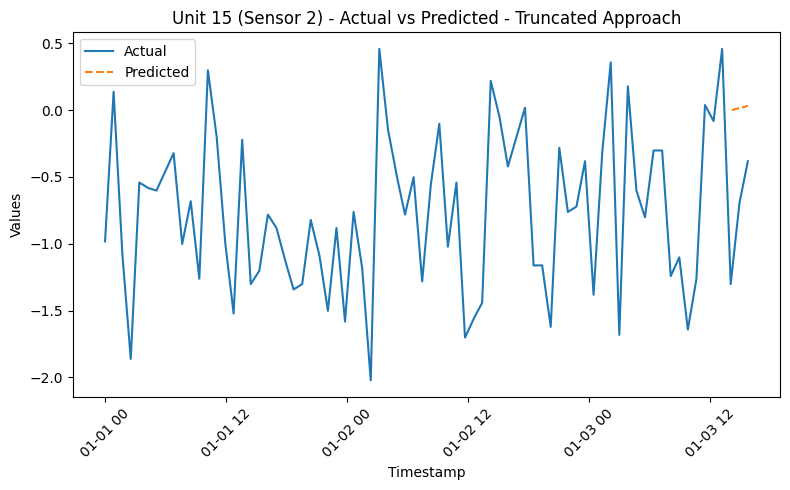

RMSE for Unit 15 - sensor_2: 0.7882901210890619
{'train': [0, 4570], 'valid': [4058, 5142], 'test': [4630, 5712]}
5113
Dataset for unit 16 is good


  0%|          | 0/49 [00:00<?, ?it/s]

96
[-0.8531694247883371, -0.8433663100344009, -0.8335631952804645, -0.8237600805265283, -0.813956965772592, -0.8041538510186557, -0.7943507362647194, -0.7845476215107832, -0.7747445067568468, -0.7649413920029106, -0.7551382772489743, -0.7453351624950381, -0.7355320477411017, -0.7257289329871655, -0.7159258182332292, -0.706122703479293, -0.6963195887253566, -0.6865164739714203, -0.6767133592174841, -0.6669102444635477, -0.6571071297096115, -0.6473040149556752, -0.6375009002017389, -0.6276977854478026, -0.6178946706938664, -0.60809155593993, -0.5982884411859938, -0.5884853264320575, -0.5786822116781212, -0.568879096924185, -0.5590759821702487, -0.5492728674163123, -0.5394697526623762, -0.5296666379084398, -0.5198635231545036, -0.5100604084005673, -0.500257293646631, -0.4904541788926947, -0.4806510641387584, -0.47084794938482216, -0.46104483463088586, -0.4512417198769496, -0.4414386051230133, -0.431635490369077, -0.4218323756151407, -0.4014418969269539, -0.3810514182387672, -0.36066093955

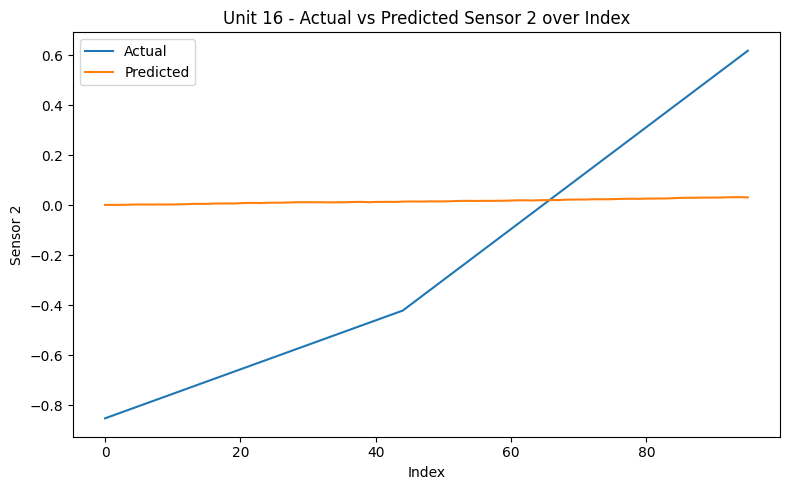

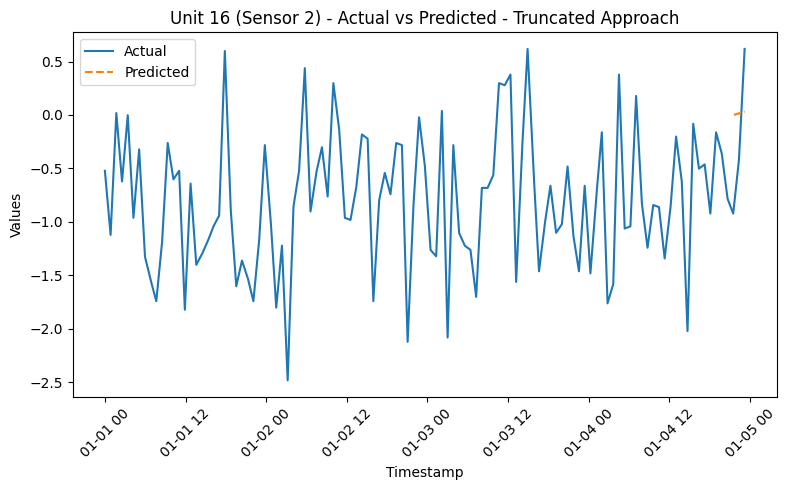

RMSE for Unit 16 - sensor_2: 0.5023644928415139
{'train': [0, 6692], 'valid': [6180, 7528], 'test': [7016, 8364]}
7765
Dataset for unit 17 is good


  0%|          | 0/82 [00:00<?, ?it/s]

96
[0.21184096207928146, 0.19380323093203727, 0.17576549978479308, 0.1577277686375489, 0.13969003749030473, 0.12165230634306054, 0.10361457519581635, 0.08557684404857219, 0.06753911290132797, 0.049501381754083806, 0.031463650606839644, 0.013425919459595426, -0.004611811687648737, -0.022649542834892955, -0.04068727398213712, -0.05872500512938128, -0.0767627362766255, -0.09480046742386966, -0.11283819857111382, -0.13087592971835804, -0.1489136608656022, -0.16695139201284637, -0.18498912316009053, -0.2030268543073348, -0.22106458545457897, -0.23910231660182313, -0.2571400477490673, -0.27517777889631145, -0.2932155100435557, -0.3112532411907999, -0.32929097233804405, -0.3473287034852882, -0.3653664346325324, -0.38340416577977665, -0.4014418969270208, -0.419479628074265, -0.43751735922150914, -0.4555550903687533, -0.47359282151599746, -0.49163055266324174, -0.5096682838104859, -0.5277060149577301, -0.5457437461049742, -0.5637814772522184, -0.5818192083994627, -0.561820854301433, -0.54182250

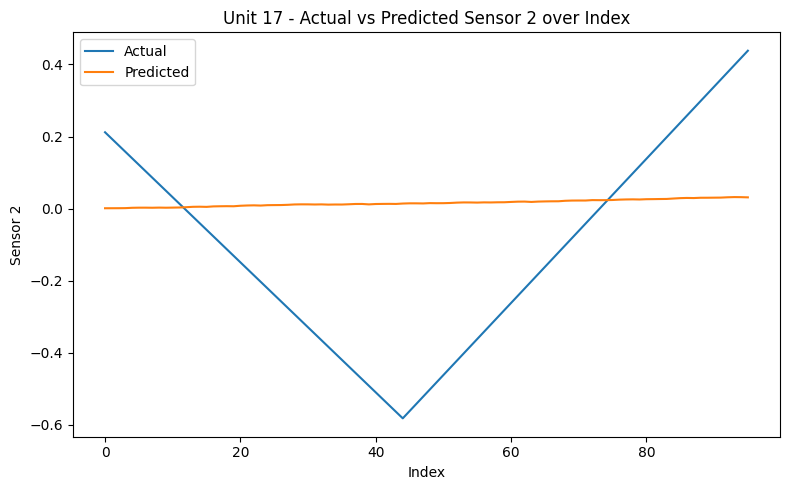

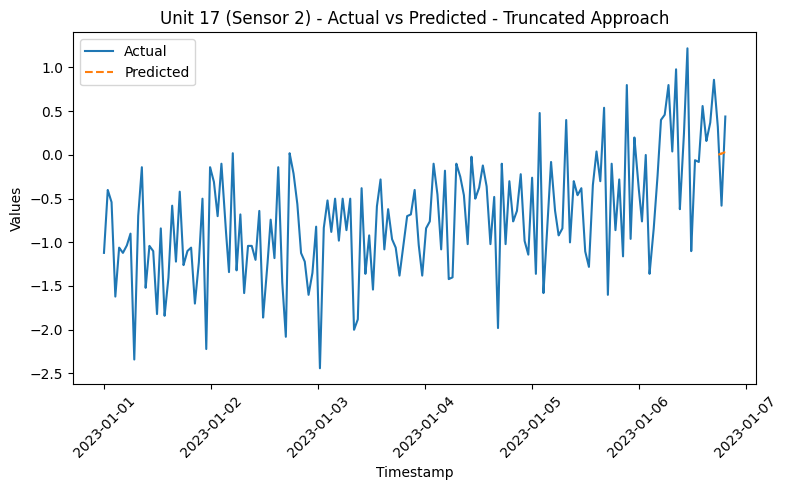

RMSE for Unit 17 - sensor_2: 0.30364355483400146
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 18 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[1.0972582866547145, 1.080004804687789, 1.0627513227208634, 1.045497840753938, 1.0282443587870123, 1.0109908768200868, 0.9937373948531611, 0.9764839128862357, 0.9592304309193102, 0.9419769489523846, 0.924723466985459, 0.9074699850185335, 0.890216503051608, 0.8729630210846824, 0.8557095391177569, 0.8384560571508314, 0.8212025751839058, 0.8039490932169803, 0.7866956112500547, 0.7694421292831292, 0.7521886473162036, 0.7349351653492782, 0.7176816833823526, 0.700428201415427, 0.6831747194485015, 0.665921237481576, 0.6486677555146504, 0.6314142735477248, 0.6141607915807993, 0.5969073096138737, 0.5796538276469483, 0.5624003456800227, 0.5451468637130972, 0.5278933817461716, 0.5106398997792461, 0.4933864178123205, 0.47613293584539496, 0.4588794538784695, 0.44162597191154396, 0.4243724899446184, 0.40711900797769285, 0.3898655260107673, 0.37261204404384174, 0.3553585620769162, 0.33810508010999074, 0.3439869489623516, 0.3498688178147125, 0.3557506866670734, 0.36163255551943424, 0.36751442437179

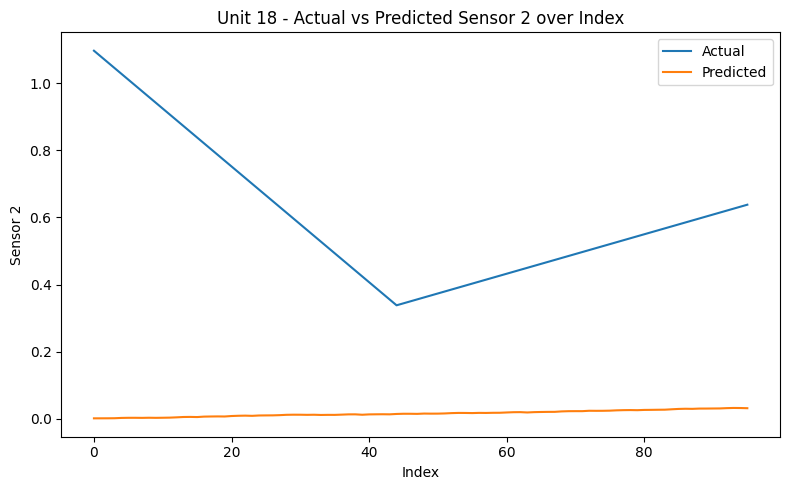

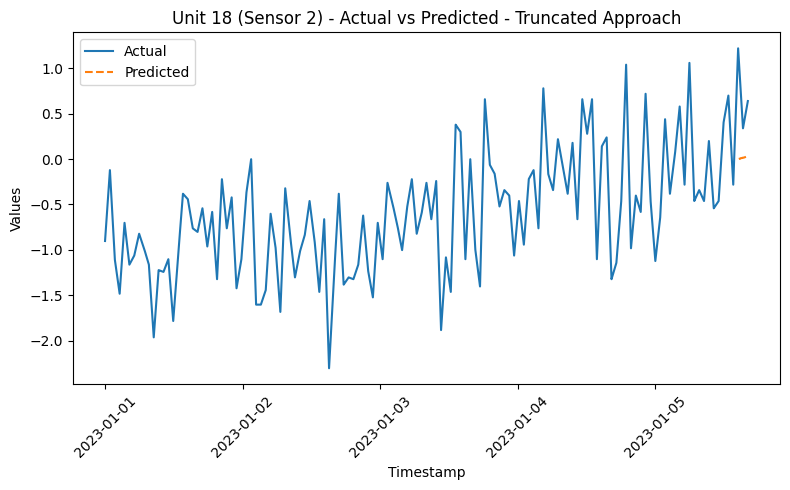

RMSE for Unit 18 - sensor_2: 0.6169660977149798
{'train': [0, 5468], 'valid': [4956, 6152], 'test': [5640, 6834]}
6235
Dataset for unit 19 is good


  0%|          | 0/63 [00:00<?, ?it/s]

96
[-0.22067246086441744, -0.23478894611008622, -0.248905431355755, -0.26302191660142377, -0.2771384018470926, -0.29125488709276137, -0.30537137233843015, -0.3194878575840989, -0.3336043428297677, -0.34772082807543647, -0.36183731332110525, -0.375953798566774, -0.3900702838124428, -0.4041867690581116, -0.4183032543037804, -0.4324197395494492, -0.44653622479511795, -0.46065271004078673, -0.4747691952864555, -0.4888856805321243, -0.503002165777793, -0.5171186510234619, -0.5312351362691307, -0.5453516215147994, -0.5594681067604682, -0.573584592006137, -0.5877010772518058, -0.6018175624974745, -0.6159340477431433, -0.6300505329888121, -0.6441670182344809, -0.6582835034801496, -0.6723999887258184, -0.6865164739714872, -0.7006329592171561, -0.7147494444628248, -0.7288659297084936, -0.7429824149541624, -0.7570989001998312, -0.7712153854455, -0.7853318706911687, -0.7994483559368375, -0.8135648411825063, -0.827681326428175, -0.8417978116738438, -0.8210152083955, -0.8002326051171561, -0.77945000

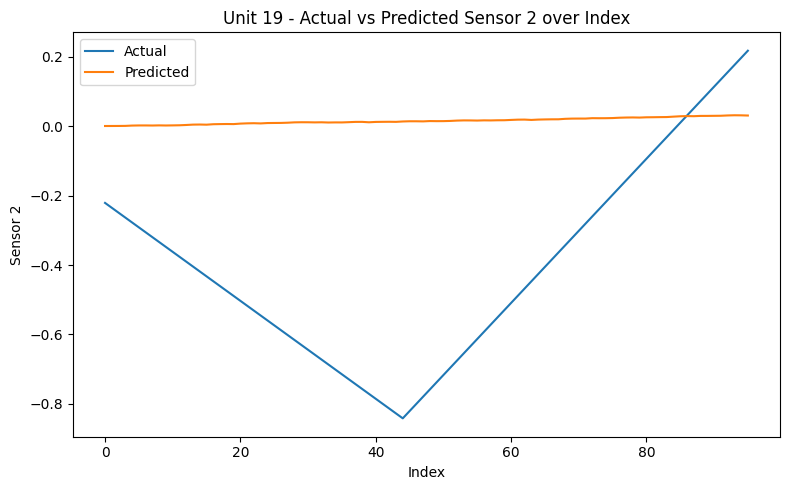

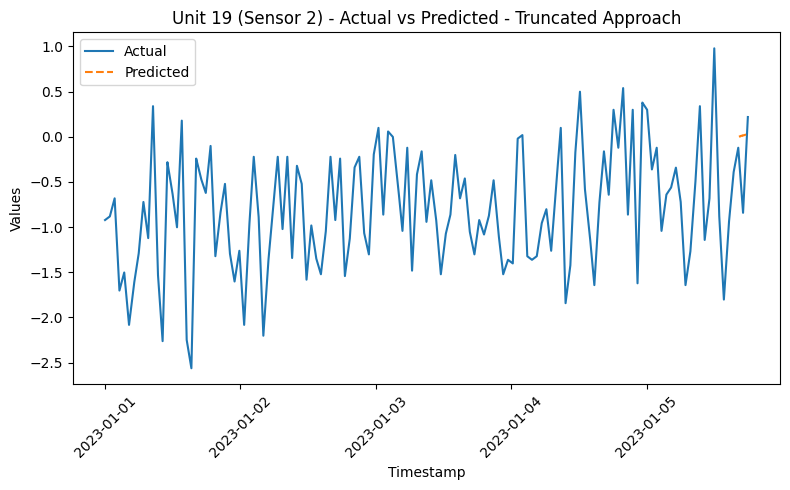

RMSE for Unit 19 - sensor_2: 0.5064037695207334
{'train': [0, 7467], 'valid': [6955, 8401], 'test': [7889, 9333]}
8734
Dataset for unit 20 is good


  0%|          | 0/94 [00:00<?, ?it/s]

96
[1.6603491981208194, 1.652114581727516, 1.6438799653342127, 1.635645348940909, 1.6274107325476057, 1.6191761161543021, 1.6109414997609988, 1.6027068833676954, 1.5944722669743918, 1.5862376505810885, 1.578003034187785, 1.5697684177944815, 1.5615338014011781, 1.5532991850078748, 1.5450645686145712, 1.5368299522212678, 1.5285953358279643, 1.520360719434661, 1.5121261030413575, 1.503891486648054, 1.4956568702547506, 1.487422253861447, 1.4791876374681436, 1.4709530210748403, 1.462718404681537, 1.4544837882882333, 1.4462491718949297, 1.4380145555016264, 1.429779939108323, 1.4215453227150197, 1.413310706321716, 1.4050760899284127, 1.3968414735351091, 1.3886068571418058, 1.3803722407485024, 1.3721376243551988, 1.3639030079618955, 1.3556683915685919, 1.3474337751752885, 1.3391991587819851, 1.3309645423886818, 1.3227299259953782, 1.3144953096020746, 1.3062606932087713, 1.2980260768154679, 1.3144953096020793, 1.3309645423886907, 1.3474337751753018, 1.3639030079619132, 1.3803722407485246, 1.396

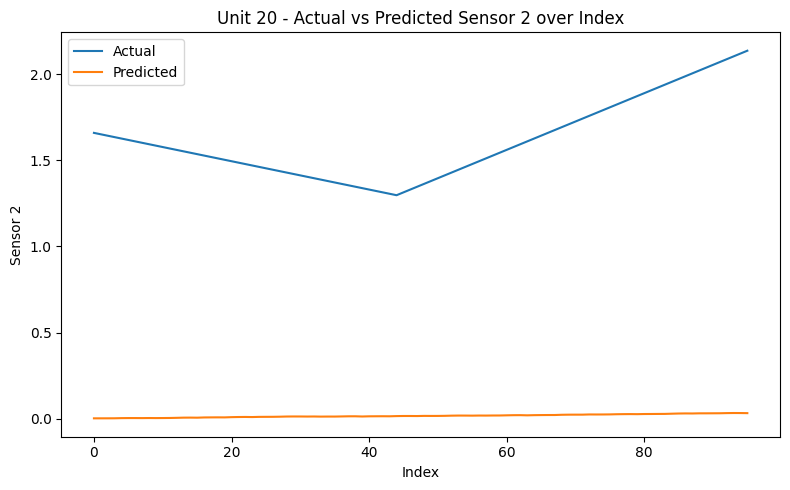

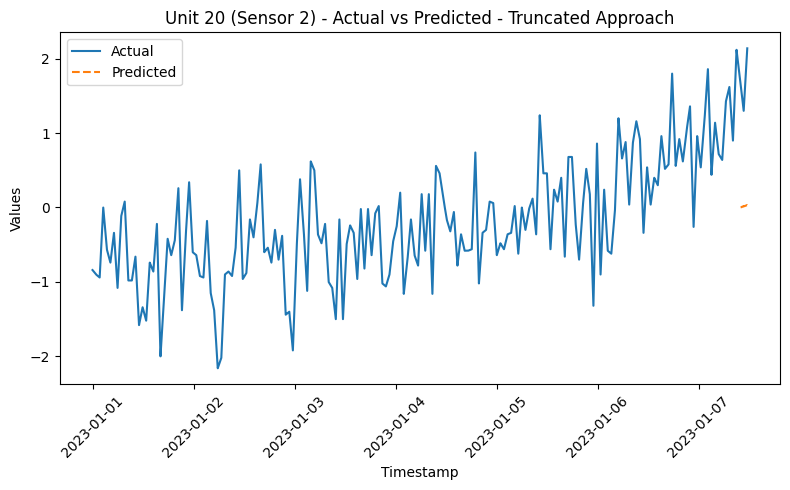

RMSE for Unit 20 - sensor_2: 1.6100301644981363
{'train': [0, 5998], 'valid': [5486, 6748], 'test': [6236, 7497]}
6898
Dataset for unit 21 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[-0.7429824149541624, -0.7288659297084936, -0.7147494444628248, -0.7006329592171561, -0.6865164739714872, -0.6723999887258184, -0.6582835034801496, -0.6441670182344809, -0.6300505329888121, -0.6159340477431433, -0.6018175624974745, -0.5877010772518058, -0.573584592006137, -0.5594681067604682, -0.5453516215147993, -0.5312351362691305, -0.5171186510234618, -0.503002165777793, -0.4888856805321243, -0.4747691952864555, -0.46065271004078673, -0.4465362247951179, -0.4324197395494491, -0.41830325430378035, -0.4041867690581116, -0.3900702838124428, -0.375953798566774, -0.36183731332110525, -0.34772082807543647, -0.3336043428297677, -0.3194878575840989, -0.30537137233843015, -0.29125488709276137, -0.2771384018470926, -0.2630219166014237, -0.24890543135575494, -0.23478894611008616, -0.22067246086441739, -0.2065559756187486, -0.19243949037307984, -0.17832300512741106, -0.16420651988174229, -0.1500900346360735, -0.13597354939040474, -0.12185706414473596, -0.12028856578410758, -0.118720067423479

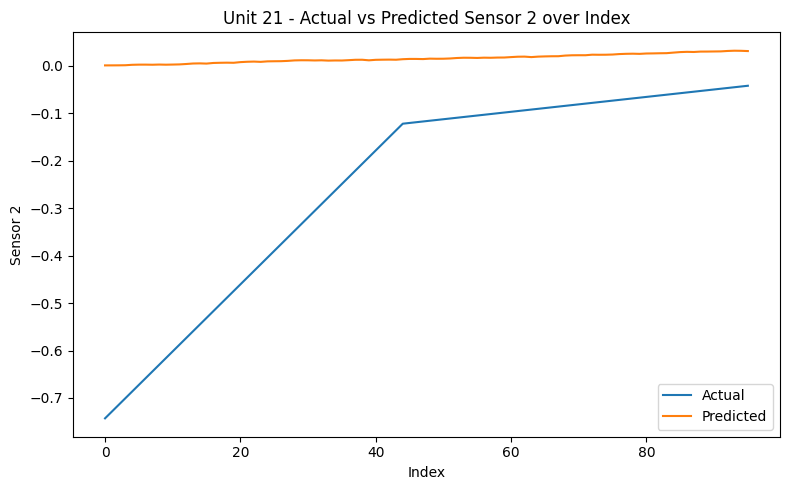

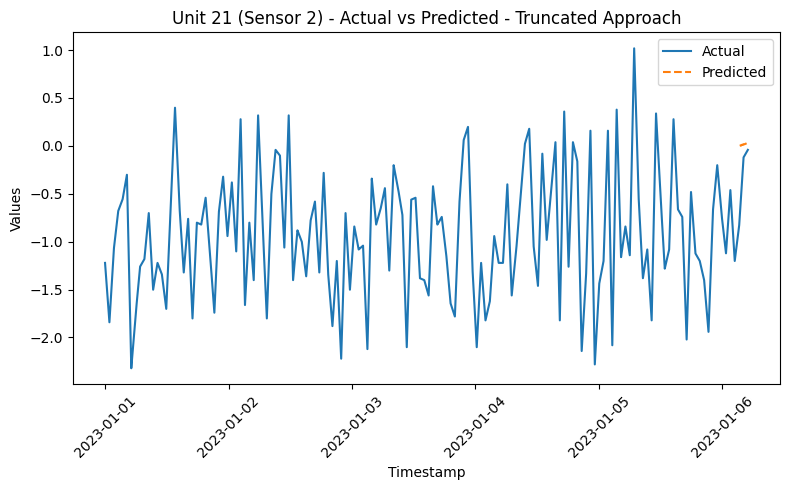

RMSE for Unit 21 - sensor_2: 0.3343591983538693
{'train': [0, 1551], 'valid': [1039, 1745], 'test': [1233, 1938]}
1339
Dataset for unit 22 is good


  0%|          | 0/2 [00:00<?, ?it/s]

96
[-0.2461605592247311, -0.24106293955268443, -0.23596531988063774, -0.23086770020859104, -0.22577008053654435, -0.22067246086449765, -0.21557484119245096, -0.21047722152040427, -0.2053796018483576, -0.2002819821763109, -0.1951843625042642, -0.19008674283221755, -0.18498912316017085, -0.17989150348812416, -0.17479388381607747, -0.16969626414403077, -0.16459864447198408, -0.15950102479993739, -0.15440340512789072, -0.14930578545584403, -0.14420816578379733, -0.13911054611175064, -0.13401292643970394, -0.12891530676765728, -0.12381768709561058, -0.11872006742356389, -0.1136224477515172, -0.1085248280794705, -0.10342720840742384, -0.09832958873537714, -0.09323196906333045, -0.08813434939128376, -0.08303672971923706, -0.0779391100471904, -0.0728414903751437, -0.06774387070309701, -0.06264625103105032, -0.05754863135900362, -0.05245101168695693, -0.04735339201491026, -0.04225577234286357, -0.037158152670816874, -0.03206053299877018, -0.026962913326723514, -0.021865293654676838, -0.02853141

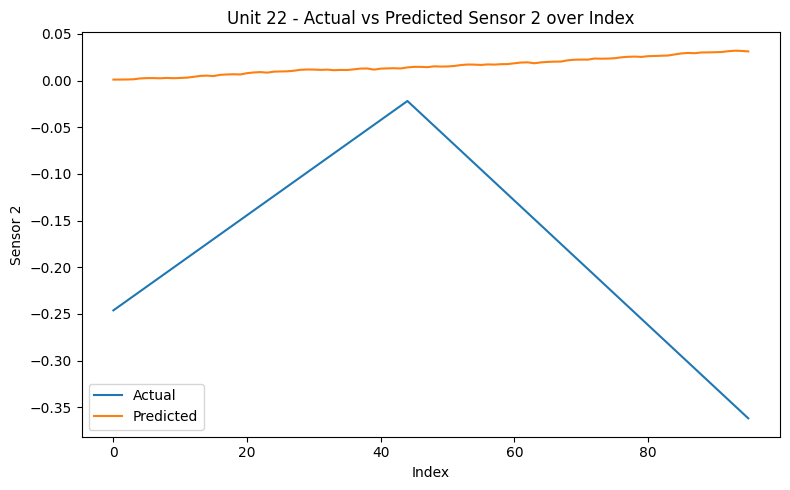

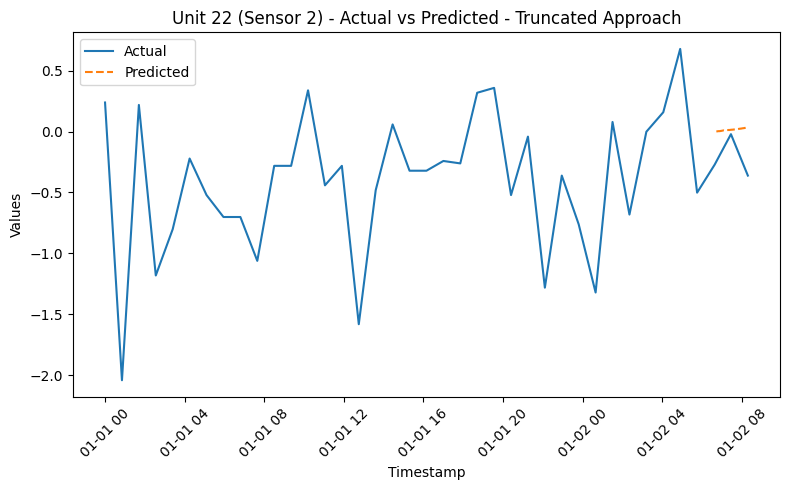

RMSE for Unit 22 - sensor_2: 0.20529349279575115
{'train': [0, 5264], 'valid': [4752, 5922], 'test': [5410, 6579]}
5980
Dataset for unit 23 is good


  0%|          | 0/60 [00:00<?, ?it/s]

96
[-0.03951090021158116, -0.04774551660488906, -0.05598013299819696, -0.06421474939150486, -0.07244936578481277, -0.08068398217812067, -0.08891859857142857, -0.09715321496473649, -0.10538783135804439, -0.11362244775135229, -0.1218570641446602, -0.1300916805379681, -0.13832629693127602, -0.1465609133245839, -0.15479552971789182, -0.16303014611119973, -0.17126476250450762, -0.17949937889781553, -0.18773399529112345, -0.19596861168443133, -0.20420322807773925, -0.21243784447104716, -0.22067246086435505, -0.22890707725766296, -0.23714169365097085, -0.24537631004427876, -0.25361092643758665, -0.26184554283089456, -0.2700801592242024, -0.27831477561751033, -0.28654939201081825, -0.29478400840412616, -0.3030186247974341, -0.31125324119074194, -0.31948785758404985, -0.32772247397735776, -0.3359570903706657, -0.3441917067639736, -0.3524263231572815, -0.36066093955058937, -0.3688955559438973, -0.3771301723372052, -0.3853647887305131, -0.393599405123821, -0.4018340215171289, -0.41947962807421596

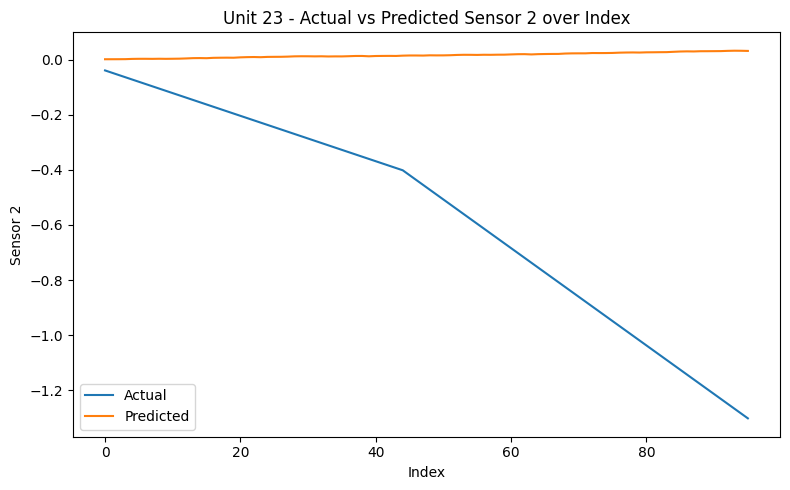

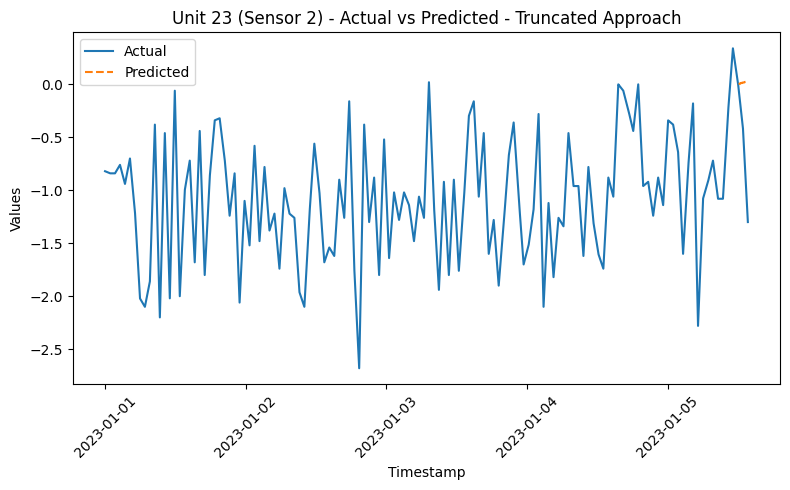

RMSE for Unit 23 - sensor_2: 0.6943102834456122
{'train': [0, 7549], 'valid': [7037, 8492], 'test': [7980, 9435]}
8836
Dataset for unit 24 is good


  0%|          | 0/96 [00:00<?, ?it/s]

96
[0.5106398997793086, 0.5067186538777332, 0.5027974079761578, 0.49887616207458235, 0.4949549161730069, 0.4910336702714315, 0.48711242436985613, 0.48319117846828075, 0.4792699325667053, 0.4753486866651299, 0.47142744076355453, 0.4675061948619791, 0.4635849489604037, 0.4596637030588283, 0.4557424571572529, 0.4518212112556775, 0.4478999653541021, 0.44397871945252665, 0.44005747355095126, 0.4361362276493759, 0.4322149817478005, 0.42829373584622504, 0.42437248994464966, 0.4204512440430742, 0.4165299981414988, 0.41260875223992344, 0.40868750633834805, 0.40476626043677266, 0.4008450145351972, 0.39692376863362183, 0.3930025227320464, 0.389081276830471, 0.3851600309288956, 0.3812387850273202, 0.3773175391257448, 0.3733962932241694, 0.36947504732259395, 0.36555380142101856, 0.3616325555194432, 0.3577113096178678, 0.3537900637162924, 0.34986881781471696, 0.3459475719131415, 0.34202632601156613, 0.33810508010999074, 0.35496643748675916, 0.3718277948635276, 0.3886891522402961, 0.4055505096170645,

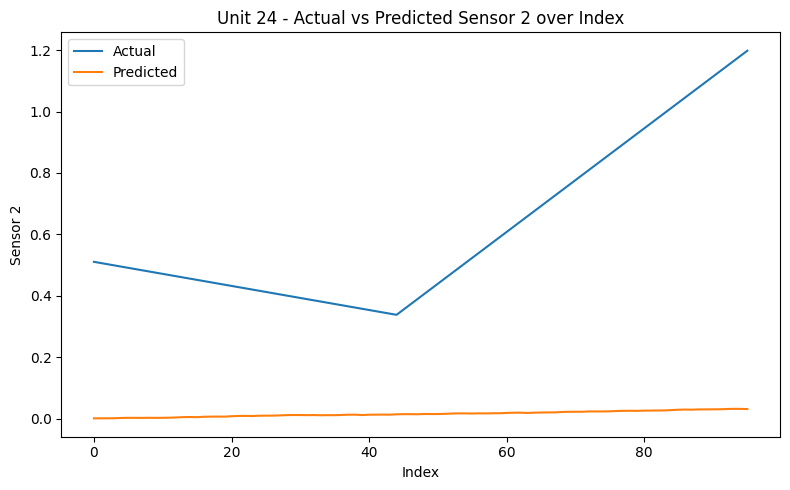

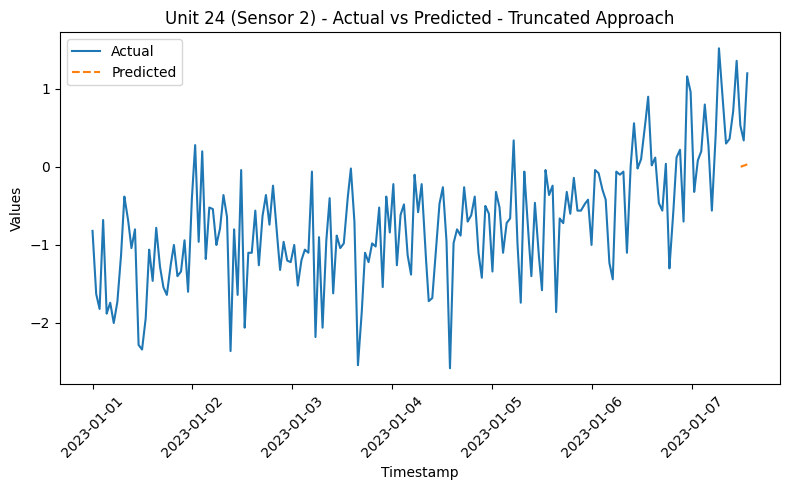

RMSE for Unit 24 - sensor_2: 0.6449545135737486
{'train': [0, 1918], 'valid': [1406, 2158], 'test': [1646, 2397]}
1798
Dataset for unit 25 is good


  0%|          | 0/8 [00:00<?, ?it/s]

96
[-0.6704393657750998, -0.6602441264310019, -0.6500488870869041, -0.6398536477428063, -0.6296584083987085, -0.6194631690546106, -0.6092679297105128, -0.599072690366415, -0.5888774510223171, -0.5786822116782193, -0.5684869723341215, -0.5582917329900237, -0.5480964936459258, -0.537901254301828, -0.5277060149577302, -0.5175107756136323, -0.5073155362695345, -0.49712029692543663, -0.4869250575813388, -0.476729818237241, -0.46653457889314315, -0.45633933954904526, -0.44614410020494744, -0.4359488608608496, -0.4257536215167518, -0.41555838217265395, -0.4053631428285561, -0.3951679034844583, -0.38497266414036047, -0.37477742479626264, -0.36458218545216475, -0.3543869461080669, -0.3441917067639691, -0.33399646741987127, -0.32380122807577344, -0.3136059887316756, -0.3034107493875778, -0.2932155100434799, -0.28302027069938207, -0.27282503135528424, -0.2626297920111864, -0.2524345526670886, -0.24223931332299076, -0.23204407397889293, -0.2218488346347951, -0.20812447397928788, -0.194400113323780

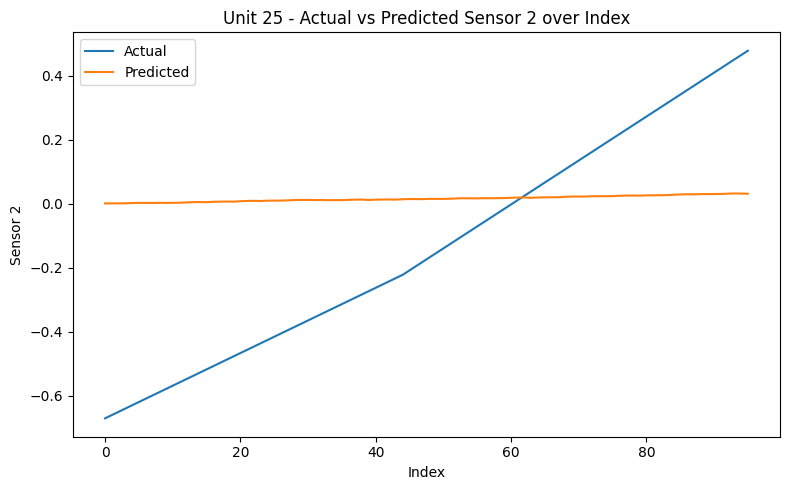

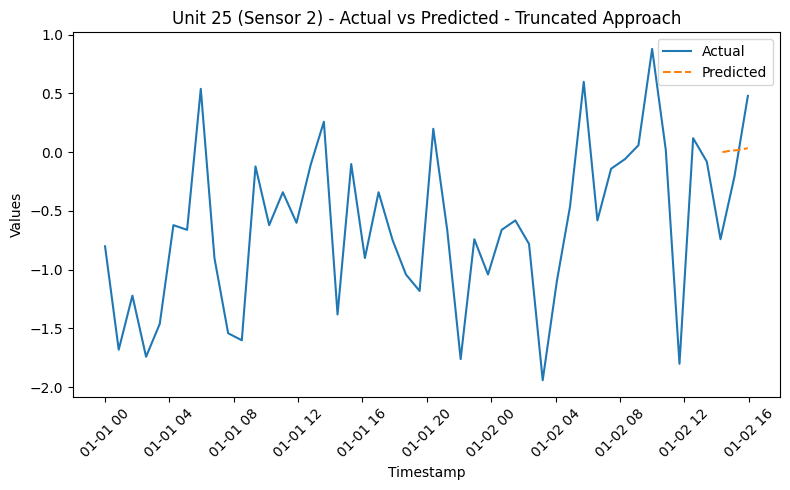

RMSE for Unit 25 - sensor_2: 0.36271207927233673
{'train': [0, 3061], 'valid': [2549, 3443], 'test': [2931, 3825]}
3226
Dataset for unit 26 is good


  0%|          | 0/25 [00:00<?, ?it/s]

96
[-0.9688461788849386, -0.964140683803049, -0.9594351887211594, -0.9547296936392697, -0.9500241985573802, -0.9453187034754906, -0.940613208393601, -0.9359077133117114, -0.9312022182298219, -0.9264967231479322, -0.9217912280660426, -0.9170857329841531, -0.9123802379022634, -0.9076747428203739, -0.9029692477384843, -0.8982637526565946, -0.8935582575747051, -0.8888527624928155, -0.8841472674109259, -0.8794417723290363, -0.8747362772471468, -0.8700307821652571, -0.8653252870833675, -0.860619792001478, -0.8559142969195883, -0.8512088018376988, -0.8465033067558092, -0.8417978116739195, -0.83709231659203, -0.8323868215101403, -0.8276813264282508, -0.8229758313463612, -0.8182703362644715, -0.813564841182582, -0.8088593461006923, -0.8041538510188028, -0.7994483559369132, -0.7947428608550235, -0.790037365773134, -0.7853318706912444, -0.7806263756093548, -0.7759208805274652, -0.7712153854455757, -0.766509890363686, -0.7618043952817964, -0.7614122706916393, -0.7610201461014823, -0.76062802151132

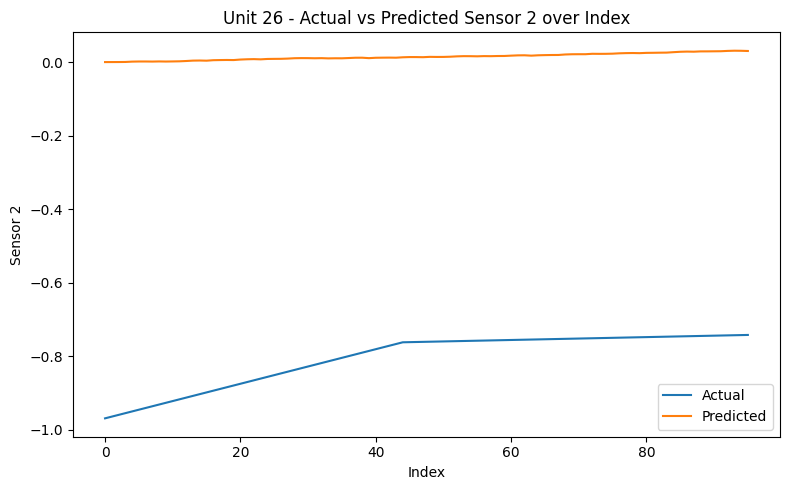

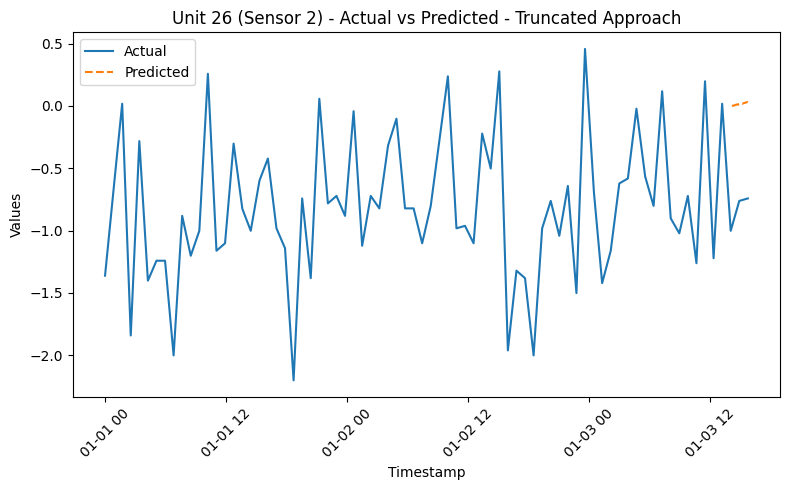

RMSE for Unit 26 - sensor_2: 0.8230236956975293
{'train': [0, 5672], 'valid': [5160, 6381], 'test': [5869, 7089]}
6490
Dataset for unit 27 is good


  0%|          | 0/66 [00:00<?, ?it/s]

96
[0.18752923748957281, 0.17458912601437532, 0.16164901453917782, 0.14870890306398032, 0.13576879158878283, 0.12282868011358533, 0.10988856863838783, 0.09694845716319034, 0.08400834568799284, 0.07106823421279534, 0.05812812273759785, 0.04518801126240035, 0.032247899787202855, 0.01930778831200536, 0.0063676768368078895, -0.006572434638389635, -0.01951254611358716, -0.03245265758878463, -0.0453927690639821, -0.05833288053917962, -0.07127299201437715, -0.08421310348957461, -0.09715321496477208, -0.11009332643996961, -0.12303343791516713, -0.1359735493903646, -0.14891366086556207, -0.1618537723407596, -0.17479388381595712, -0.1877339952911546, -0.20067410676635206, -0.21361421824154958, -0.2265543297167471, -0.23949444119194457, -0.25243455266714204, -0.2653746641423395, -0.2783147756175371, -0.29125488709273456, -0.30419499856793203, -0.3171351100431296, -0.3300752215183271, -0.34301533299352455, -0.355955444468722, -0.3688955559439195, -0.38183566741911706, -0.3790907952880174, -0.37634

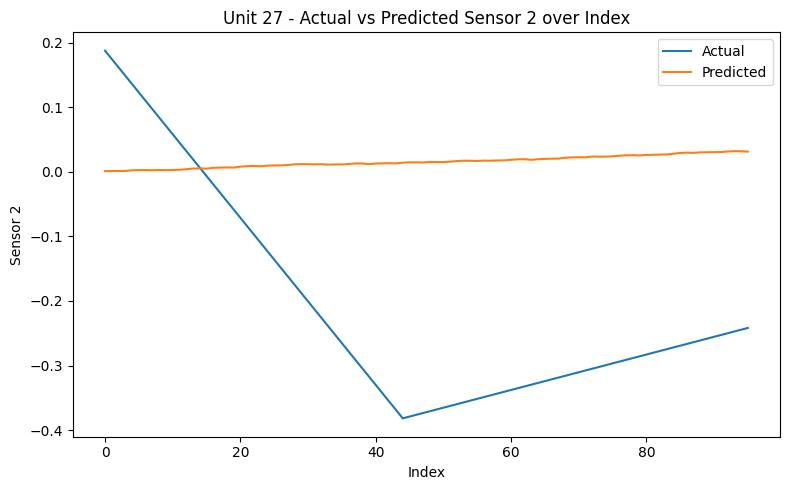

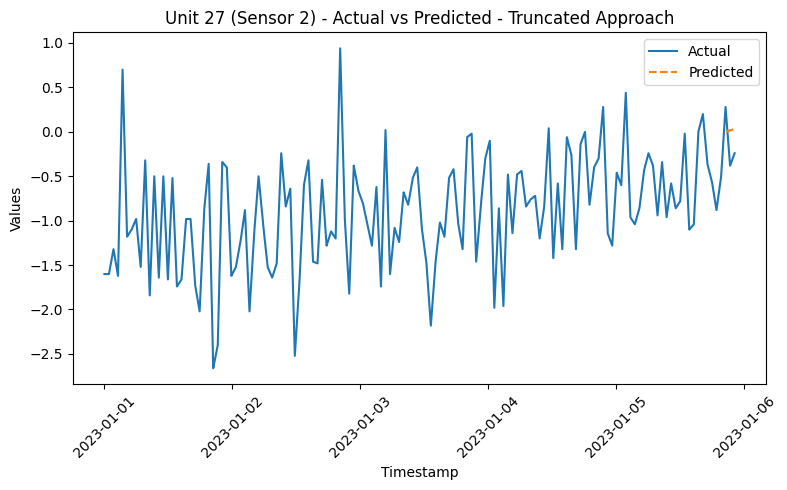

RMSE for Unit 27 - sensor_2: 0.2804562765109403
{'train': [0, 6406], 'valid': [5894, 7207], 'test': [6695, 8007]}
7408
Dataset for unit 28 is good


  0%|          | 0/78 [00:00<?, ?it/s]

96
[-0.3281145985674703, -0.30615562151865516, -0.28419664446984005, -0.2622376674210249, -0.24027869037220978, -0.21831971332339467, -0.1963607362745795, -0.1744017592257644, -0.15244278217694923, -0.13048380512813412, -0.10852482807931901, -0.08656585103050385, -0.06460687398168874, -0.042647896932873575, -0.020688919884058465, 0.0012700571647566439, 0.023229034213571753, 0.04518801126238686, 0.06714698831120208, 0.08910596536001719, 0.1110649424088323, 0.1330239194576474, 0.15498289650646252, 0.17694187355527774, 0.19890085060409285, 0.22085982765290796, 0.24281880470172307, 0.2647777817505382, 0.2867367587993534, 0.3086957358481685, 0.3306547128969836, 0.3526136899457987, 0.37457266699461383, 0.39653164404342905, 0.41849062109224416, 0.4404495981410593, 0.4624085751898744, 0.4843675522386895, 0.5063265292875045, 0.5282855063363197, 0.5502444833851348, 0.5722034604339499, 0.5941624374827652, 0.6161214145315803, 0.6380803915803955, 0.6325906473181917, 0.627100903055988, 0.62161115879

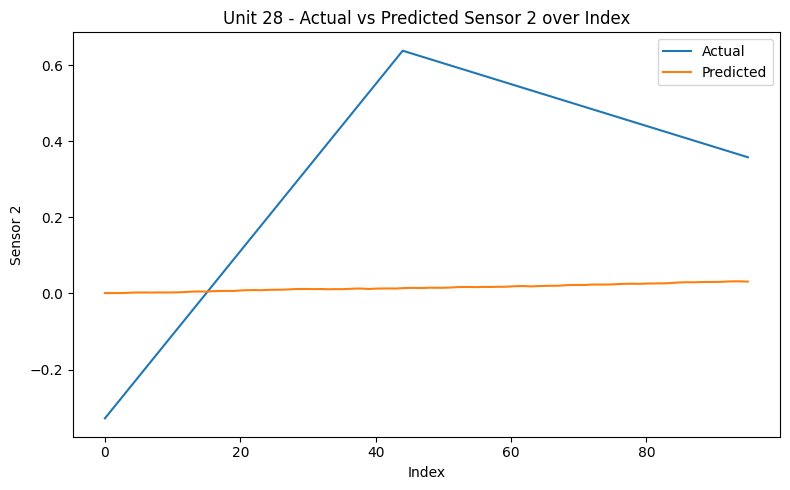

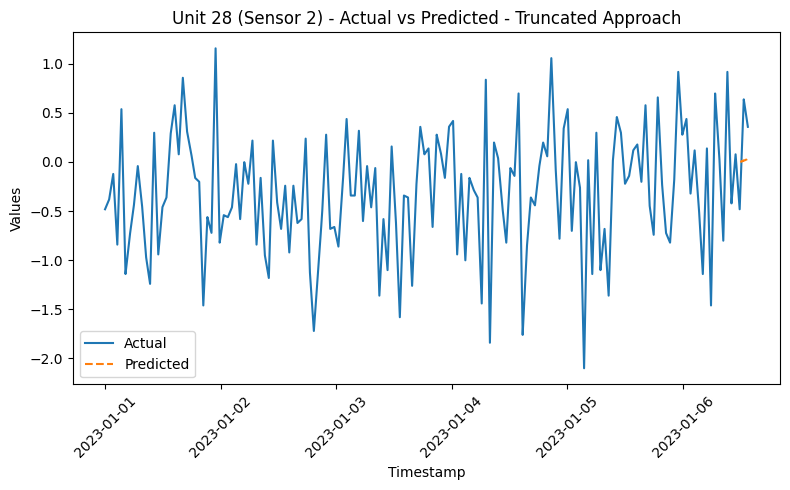

RMSE for Unit 28 - sensor_2: 0.41212805188230184
{'train': [0, 6937], 'valid': [6425, 7804], 'test': [7292, 8670]}
8071
Dataset for unit 29 is good


  0%|          | 0/86 [00:00<?, ?it/s]

96
[0.26909115224214597, 0.2706596506027788, 0.27222814896341163, 0.27379664732404446, 0.2753651456846773, 0.2769336440453101, 0.27850214240594295, 0.2800706407665758, 0.2816391391272086, 0.2832076374878415, 0.28477613584847433, 0.28634463420910716, 0.28791313256974, 0.2894816309303728, 0.29105012929100565, 0.2926186276516385, 0.2941871260122713, 0.29575562437290415, 0.29732412273353703, 0.2988926210941698, 0.3004611194548027, 0.3020296178154355, 0.30359811617606836, 0.3051666145367012, 0.306735112897334, 0.30830361125796685, 0.3098721096185997, 0.3114406079792325, 0.31300910633986534, 0.3145776047004982, 0.31614610306113106, 0.3177146014217639, 0.3192830997823967, 0.32085159814302955, 0.3224200965036624, 0.3239885948642952, 0.32555709322492804, 0.32712559158556087, 0.32869408994619376, 0.33026258830682653, 0.3318310866674594, 0.33339958502809225, 0.3349680833887251, 0.3365365817493579, 0.33810508010999074, 0.32555709322495036, 0.3130091063399099, 0.30046111945486953, 0.287913132569829

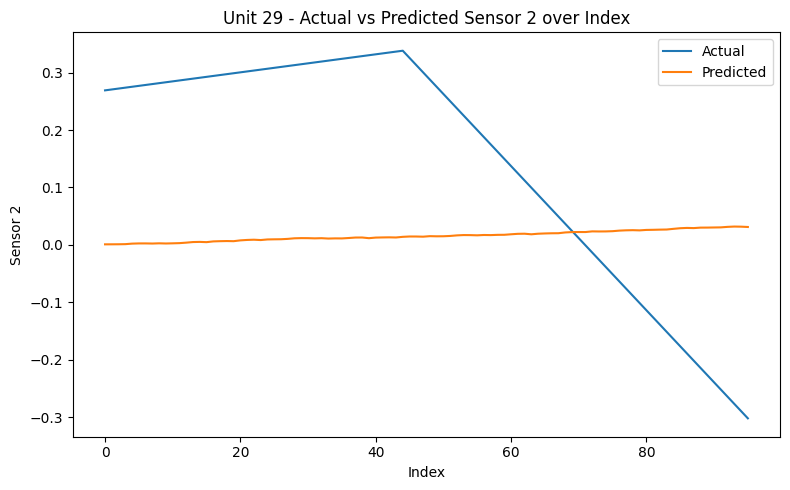

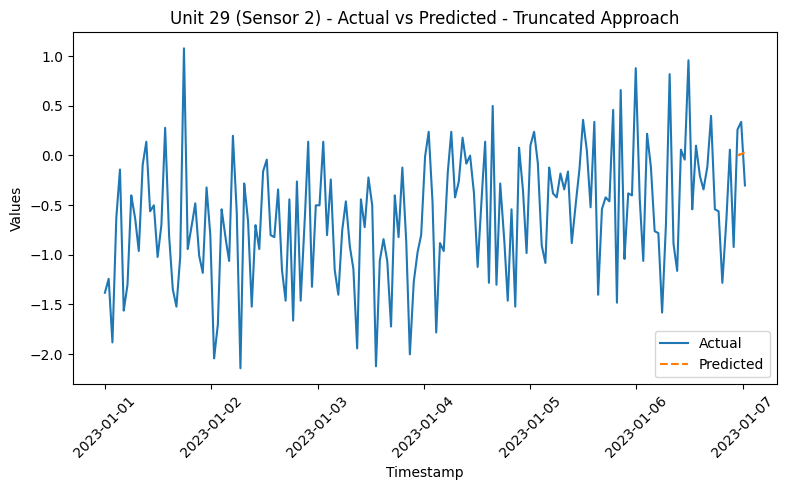

RMSE for Unit 29 - sensor_2: 0.24576067328122173
{'train': [0, 5794], 'valid': [5282, 6519], 'test': [6007, 7242]}
6643
Dataset for unit 30 is good


  0%|          | 0/68 [00:00<?, ?it/s]

96
[0.31026423420874344, 0.29771624732370305, 0.2851682604386626, 0.2726202735536222, 0.26007228666858184, 0.24752429978354143, 0.23497631289850104, 0.22242832601346063, 0.20988033912842025, 0.19733235224337983, 0.18478436535833942, 0.17223637847329903, 0.15968839158825862, 0.1471404047032182, 0.13459241781817782, 0.12204443093313744, 0.10949644404809705, 0.09694845716305661, 0.08440047027801623, 0.07185248339297584, 0.0593044965079354, 0.046756509622895015, 0.03420852273785463, 0.021660535852814244, 0.009112548967773804, -0.0034354379172665817, -0.015983424802306967, -0.028531411687347408, -0.04107939857238779, -0.05362738545742818, -0.06617537234246856, -0.078723359227509, -0.09127134611254939, -0.10381933299758983, -0.11636731988263016, -0.1289153067676706, -0.14146329365271104, -0.15401128053775137, -0.1665592674227918, -0.17910725430783214, -0.19165524119287258, -0.20420322807791302, -0.21675121496295335, -0.2292992018479938, -0.2418471887330343, -0.24263143791334849, -0.243415687

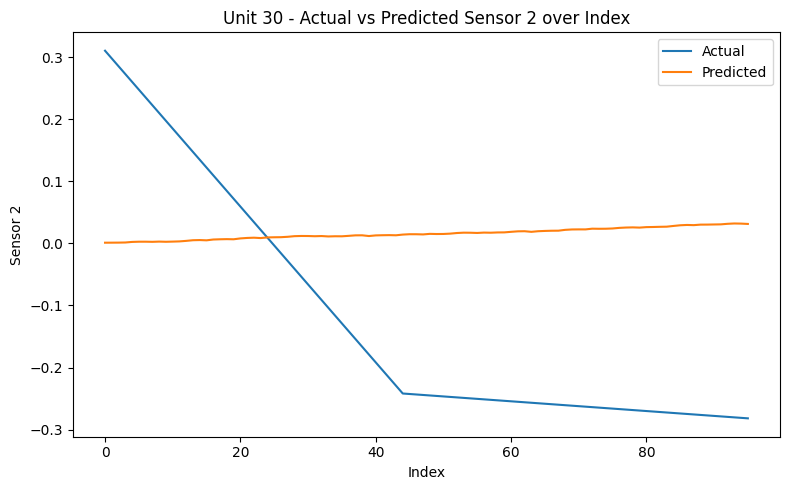

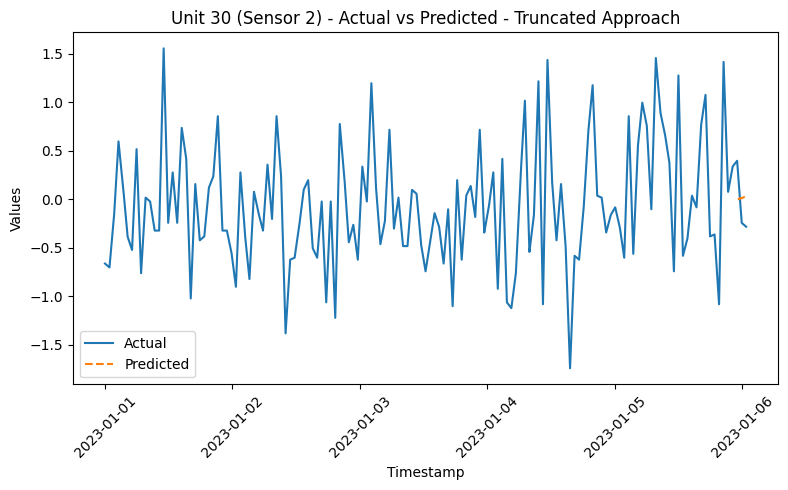

RMSE for Unit 30 - sensor_2: 0.23806441139456777
{'train': [0, 7957], 'valid': [7445, 8951], 'test': [8439, 9945]}
9346
Dataset for unit 31 is good


  0%|          | 0/102 [00:00<?, ?it/s]

96
[1.3121425620609894, 1.3227299259952443, 1.3333172899294994, 1.3439046538637542, 1.354492017798009, 1.3650793817322642, 1.375666745666519, 1.3862541096007739, 1.396841473535029, 1.4074288374692838, 1.4180162014035387, 1.4286035653377938, 1.4391909292720486, 1.4497782932063035, 1.4603656571405583, 1.4709530210748134, 1.4815403850090683, 1.4921277489433233, 1.5027151128775782, 1.513302476811833, 1.523889840746088, 1.534477204680343, 1.5450645686145978, 1.555651932548853, 1.5662392964831078, 1.5768266604173626, 1.5874140243516175, 1.5980013882858723, 1.6085887522201274, 1.6191761161543823, 1.6297634800886374, 1.6403508440228922, 1.650938207957147, 1.661525571891402, 1.672112935825657, 1.6827002997599119, 1.693287663694167, 1.7038750276284218, 1.7144623915626767, 1.7250497554969315, 1.7356371194311866, 1.7462244833654414, 1.7568118472996965, 1.7673992112339514, 1.7779865751682062, 1.7677913358241084, 1.7575960964800106, 1.7474008571359128, 1.737205617791815, 1.727010378447717, 1.7168151

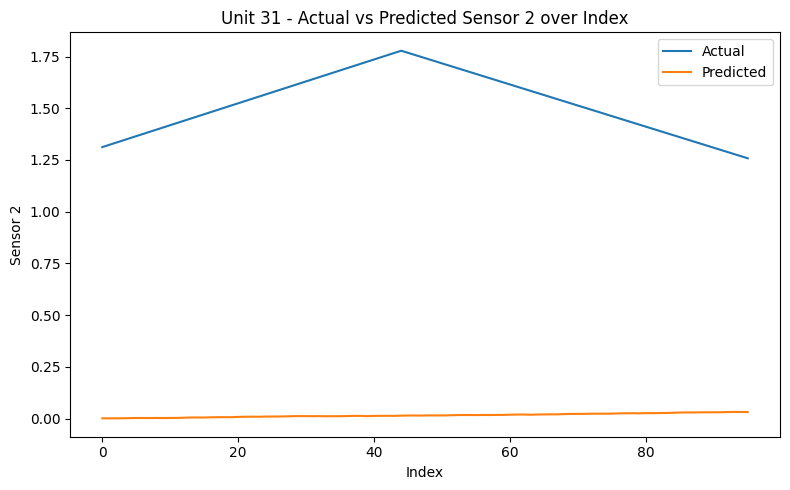

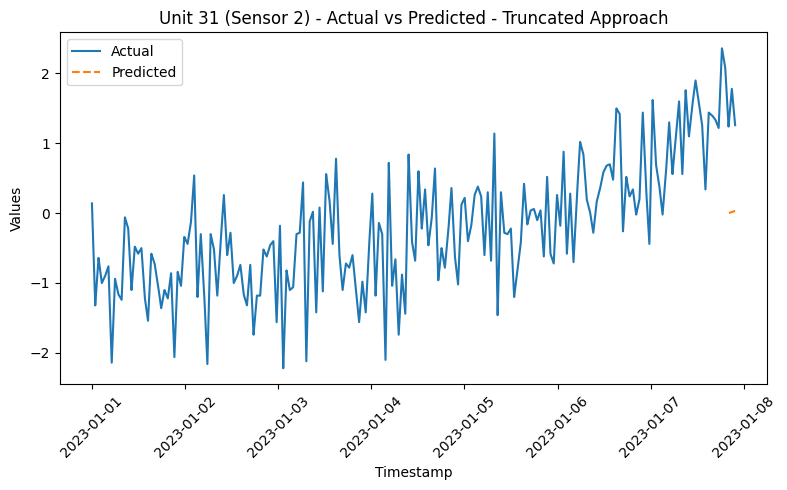

RMSE for Unit 31 - sensor_2: 1.5194535855233853
{'train': [0, 5876], 'valid': [5364, 6610], 'test': [6098, 7344]}
6745
Dataset for unit 32 is good


  0%|          | 0/69 [00:00<?, ?it/s]

96
[-0.3877175362715359, -0.39712852643531504, -0.40653951659909426, -0.41595050676287343, -0.4253614969266526, -0.4347724870904318, -0.444183477254211, -0.45359446741799014, -0.46300545758176936, -0.4724164477455486, -0.48182743790932775, -0.4912384280731069, -0.5006494182368861, -0.5100604084006652, -0.5194713985644445, -0.5288823887282237, -0.5382933788920029, -0.5477043690557821, -0.5571153592195612, -0.5665263493833405, -0.5759373395471197, -0.5853483297108988, -0.594759319874678, -0.6041703100384572, -0.6135813002022363, -0.6229922903660156, -0.6324032805297948, -0.6418142706935739, -0.6512252608573531, -0.6606362510211323, -0.6700472411849114, -0.6794582313486907, -0.6888692215124699, -0.698280211676249, -0.7076912018400283, -0.7171021920038074, -0.7265131821675865, -0.7359241723313659, -0.745335162495145, -0.7547461526589242, -0.7641571428227034, -0.7735681329864825, -0.7829791231502617, -0.792390113314041, -0.8018011034778201, -0.7751366313471109, -0.7484721592164018, -0.72180

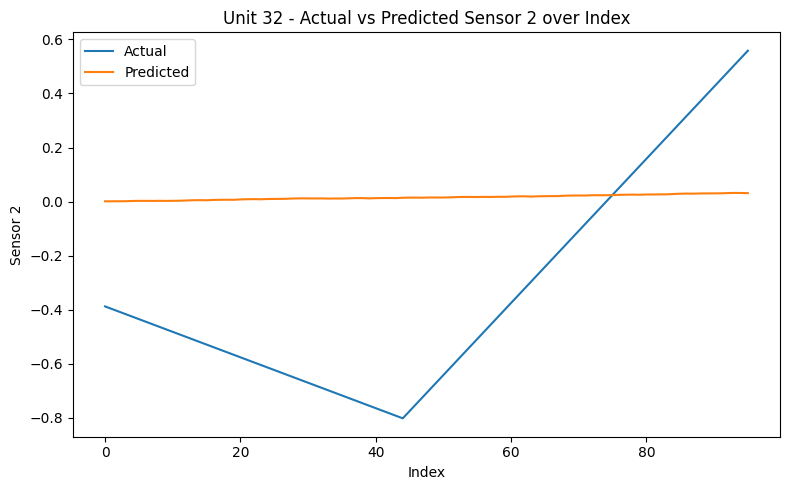

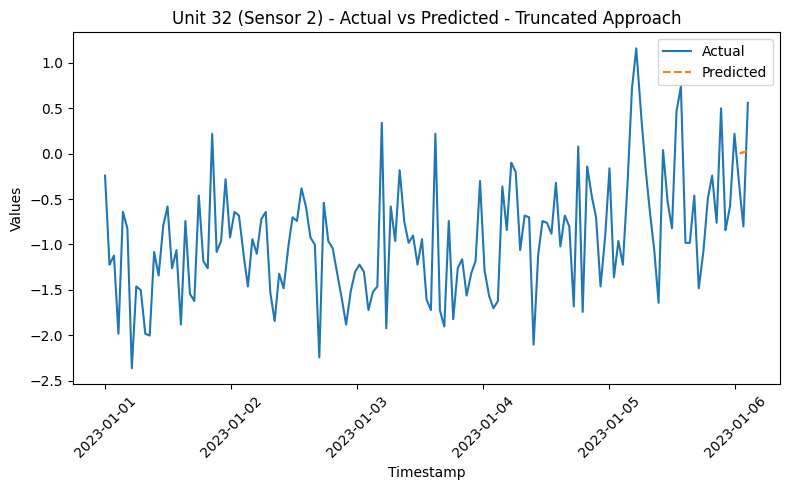

RMSE for Unit 32 - sensor_2: 0.5161544316674036
{'train': [0, 2000], 'valid': [1488, 2250], 'test': [1738, 2499]}
1900
Dataset for unit 33 is good


  0%|          | 0/9 [00:00<?, ?it/s]

96
[0.3945710210927149, 0.3769254145356278, 0.35927980797854076, 0.3416342014214536, 0.32398859486436654, 0.30634298830727946, 0.28869738175019233, 0.2710517751931053, 0.25340616863601817, 0.2357605620789311, 0.218114955521844, 0.20046934896475693, 0.1828237424076698, 0.16517813585058272, 0.14753252929349564, 0.12988692273640856, 0.11224131617932148, 0.0945957096222344, 0.07695010306514727, 0.05930449650806019, 0.04165888995097311, 0.02401328339388603, 0.006367676836798952, -0.011277929720288182, -0.028923536277375206, -0.04656914283446234, -0.06421474939154947, -0.0818603559486365, -0.09950596250572363, -0.11715156906281066, -0.1347971756198978, -0.15244278217698493, -0.17008838873407195, -0.18773399529115908, -0.2053796018482461, -0.22302520840533324, -0.24067081496242038, -0.2583164215195074, -0.27596202807659453, -0.29360763463368156, -0.3112532411907687, -0.3288988477478557, -0.34654445430494285, -0.36419006086203, -0.38183566741911706, -0.3845805395502212, -0.3873254116813253, -0

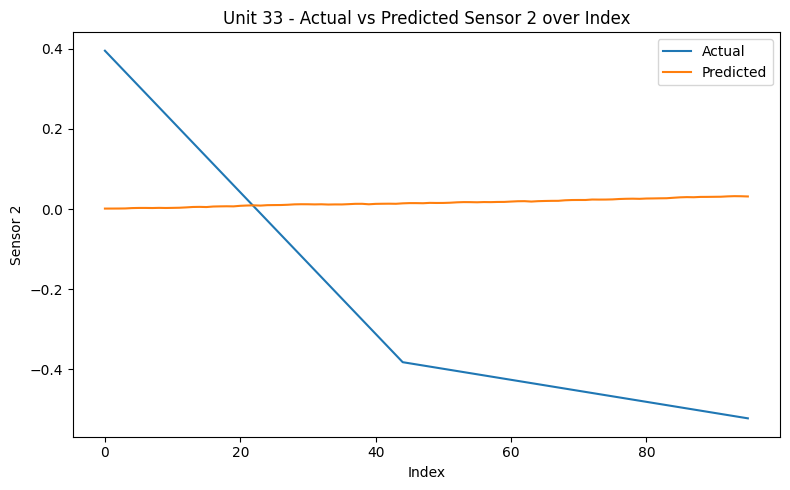

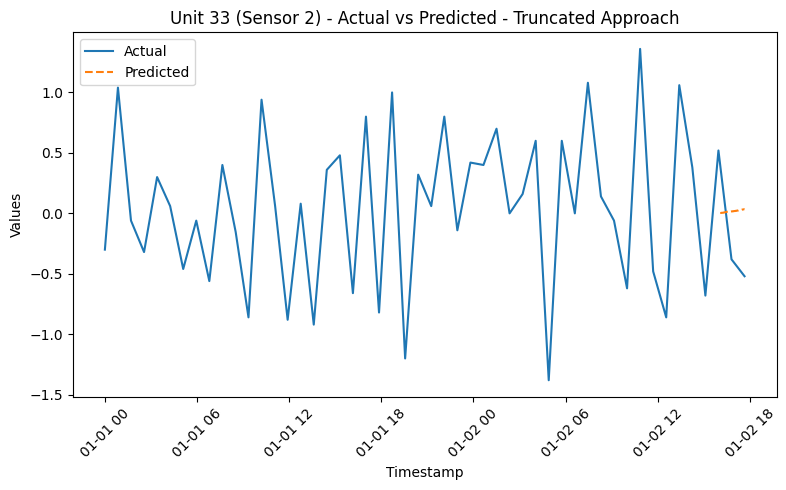

RMSE for Unit 33 - sensor_2: 0.38328931794669974
{'train': [0, 8242], 'valid': [7730, 9273], 'test': [8761, 10302]}
9703
Dataset for unit 34 is good


  0%|          | 0/106 [00:00<?, ?it/s]

96
[1.4156634538626587, 1.4238980702559665, 1.4321326866492745, 1.4403673030425823, 1.4486019194358903, 1.4568365358291981, 1.4650711522225062, 1.473305768615814, 1.4815403850091218, 1.4897750014024298, 1.4980096177957376, 1.5062442341890456, 1.5144788505823534, 1.5227134669756615, 1.5309480833689693, 1.5391826997622773, 1.547417316155585, 1.555651932548893, 1.563886548942201, 1.5721211653355087, 1.5803557817288167, 1.5885903981221245, 1.5968250145154324, 1.6050596309087404, 1.6132942473020482, 1.6215288636953562, 1.629763480088664, 1.6379980964819718, 1.6462327128752798, 1.6544673292685879, 1.6627019456618957, 1.6709365620552035, 1.6791711784485115, 1.6874057948418193, 1.6956404112351273, 1.7038750276284351, 1.712109644021743, 1.720344260415051, 1.7285788768083588, 1.7368134932016668, 1.7450481095949746, 1.7532827259882824, 1.7615173423815904, 1.7697519587748984, 1.7779865751682062, 1.7846526932008813, 1.7913188112335563, 1.7979849292662315, 1.8046510472989066, 1.8113171653315816, 1.8

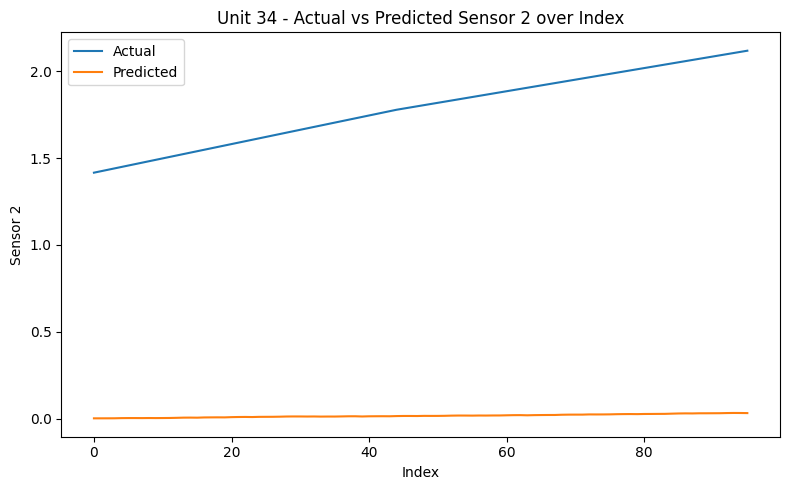

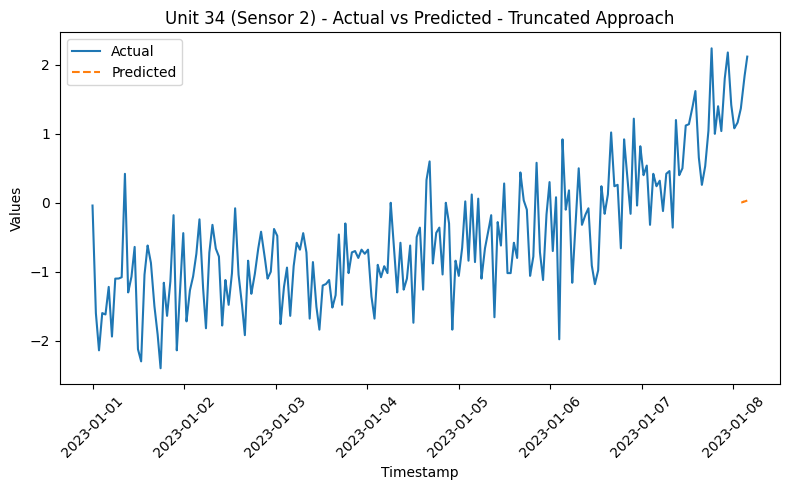

RMSE for Unit 34 - sensor_2: 1.7802197925436345
{'train': [0, 8038], 'valid': [7526, 9043], 'test': [8531, 10047]}
9448
Dataset for unit 35 is good


  0%|          | 0/103 [00:00<?, ?it/s]

96
[1.4697766473042753, 1.468600273533804, 1.4674238997633327, 1.4662475259928613, 1.46507115222239, 1.4638947784519187, 1.4627184046814474, 1.4615420309109761, 1.4603656571405048, 1.4591892833700337, 1.4580129095995624, 1.4568365358290911, 1.4556601620586198, 1.4544837882881485, 1.4533074145176772, 1.452131040747206, 1.4509546669767346, 1.4497782932062633, 1.448601919435792, 1.447425545665321, 1.4462491718948496, 1.4450727981243783, 1.443896424353907, 1.4427200505834357, 1.4415436768129644, 1.440367303042493, 1.4391909292720217, 1.4380145555015504, 1.4368381817310791, 1.4356618079606078, 1.4344854341901367, 1.4333090604196654, 1.4321326866491941, 1.4309563128787228, 1.4297799391082515, 1.4286035653377802, 1.427427191567309, 1.4262508177968376, 1.4250744440263663, 1.4238980702558952, 1.422721696485424, 1.4215453227149526, 1.4203689489444813, 1.41919257517401, 1.4180162014035387, 1.4184083259936957, 1.418800450583853, 1.41919257517401, 1.419584699764167, 1.4199768243543243, 1.4203689489

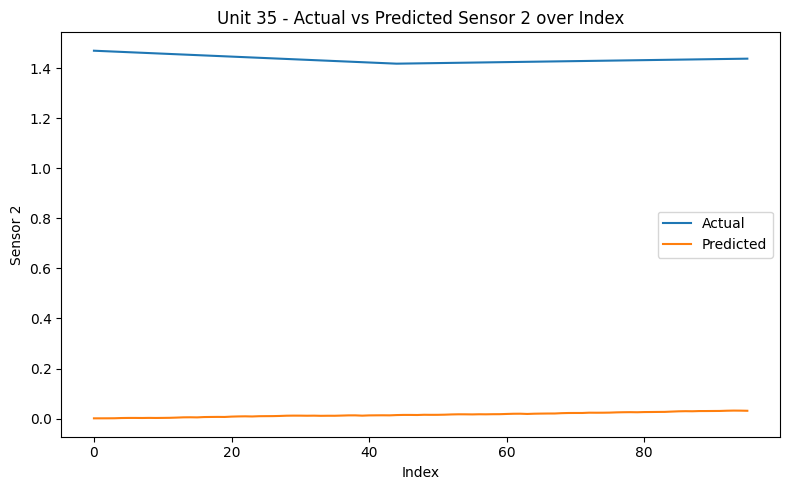

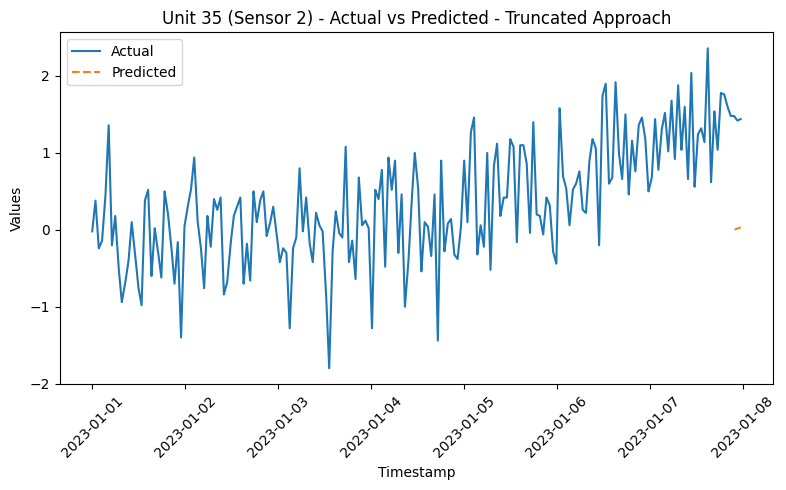

RMSE for Unit 35 - sensor_2: 1.4200072933482637
{'train': [0, 5101], 'valid': [4589, 5738], 'test': [5226, 6375]}
5776
Dataset for unit 36 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[0.8592386604291529, 0.8851188833795435, 0.910999106329934, 0.9368793292803246, 0.9627595522307151, 0.9886397751811056, 1.014519998131496, 1.0404002210818866, 1.066280444032277, 1.0921606669826678, 1.1180408899330583, 1.1439211128834488, 1.1698013358338393, 1.19568155878423, 1.2215617817346205, 1.247442004685011, 1.2733222276354015, 1.299202450585792, 1.3250826735361825, 1.350962896486573, 1.3768431194369635, 1.4027233423873542, 1.4286035653377447, 1.4544837882881352, 1.480364011238526, 1.5062442341889164, 1.532124457139307, 1.5580046800896974, 1.5838849030400879, 1.6097651259904784, 1.6356453489408689, 1.6615255718912594, 1.68740579484165, 1.7132860177920406, 1.739166240742431, 1.7650464636928216, 1.790926686643212, 1.8168069095936028, 1.8426871325439933, 1.8685673554943838, 1.8944475784447743, 1.9203278013951648, 1.9462080243455553, 1.972088247295946, 1.9979684702463365, 1.9689512505746891, 1.939934030903042, 1.9109168112313946, 1.8818995915597474, 1.8528823718881, 1.8238651522164

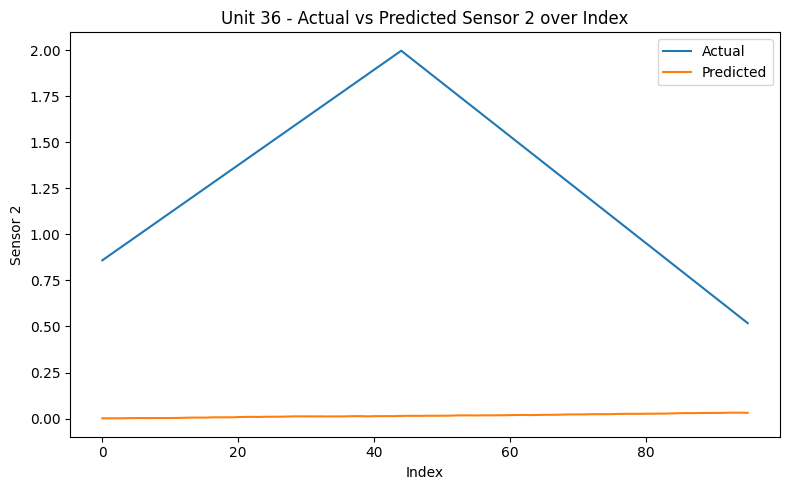

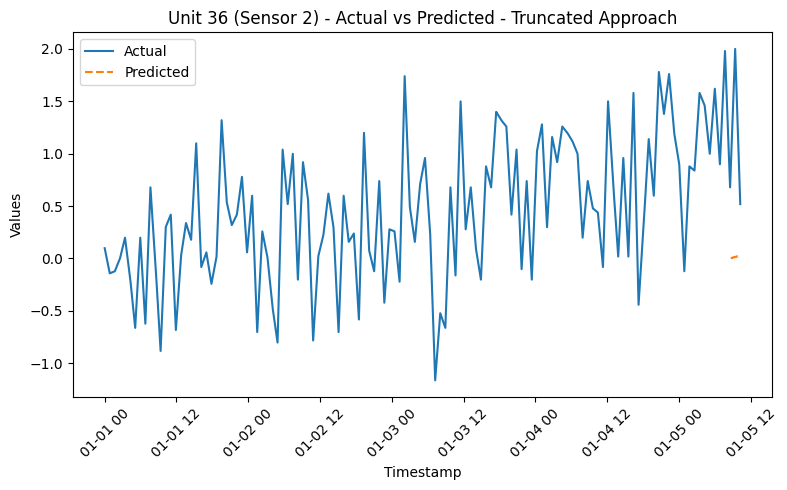

RMSE for Unit 36 - sensor_2: 1.374461502303468
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 37 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[0.652589001416208, 0.6518047522358937, 0.6510205030555796, 0.6502362538752654, 0.6494520046949512, 0.6486677555146371, 0.6478835063343228, 0.6470992571540086, 0.6463150079736945, 0.6455307587933803, 0.6447465096130661, 0.6439622604327518, 0.6431780112524377, 0.6423937620721235, 0.6416095128918093, 0.6408252637114952, 0.640041014531181, 0.6392567653508667, 0.6384725161705526, 0.6376882669902384, 0.6369040178099242, 0.6361197686296101, 0.6353355194492958, 0.6345512702689816, 0.6337670210886674, 0.6329827719083533, 0.6321985227280391, 0.6314142735477248, 0.6306300243674107, 0.6298457751870965, 0.6290615260067823, 0.6282772768264682, 0.6274930276461539, 0.6267087784658397, 0.6259245292855256, 0.6251402801052114, 0.6243560309248972, 0.6235717817445829, 0.6227875325642688, 0.6220032833839546, 0.6212190342036404, 0.6204347850233263, 0.619650535843012, 0.6188662866626978, 0.6180820374823837, 0.6318063981378953, 0.645530758793407, 0.6592551194489187, 0.6729794801044304, 0.6867038407599421, 

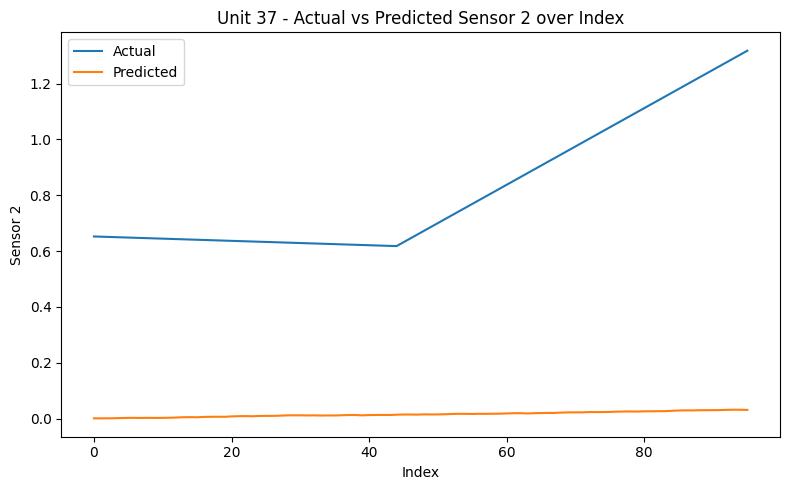

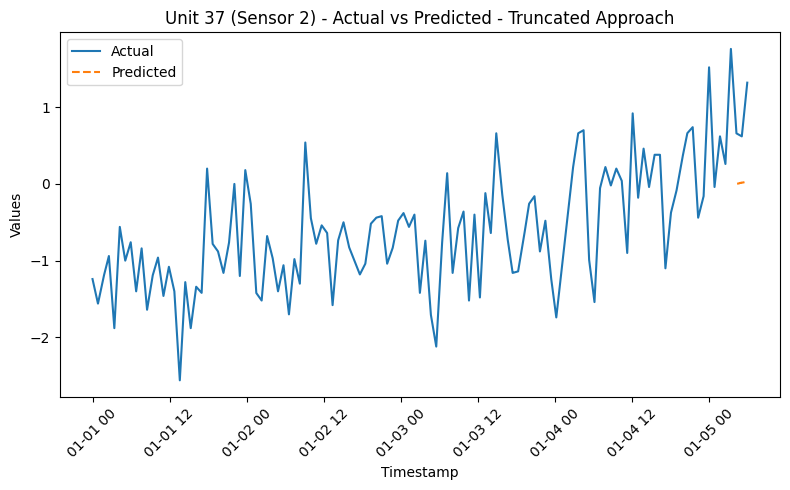

RMSE for Unit 37 - sensor_2: 0.8288247118790824
{'train': [0, 5060], 'valid': [4548, 5692], 'test': [5180, 6324]}
5725
Dataset for unit 38 is good


  0%|          | 0/57 [00:00<?, ?it/s]

96
[0.20831184076792106, 0.23262356535768322, 0.25693528994744536, 0.2812470145372075, 0.3055587391269697, 0.32987046371673184, 0.354182188306494, 0.3784939128962561, 0.4028056374860183, 0.42711736207578044, 0.4514290866655426, 0.47574081125530476, 0.5000525358450668, 0.524364260434829, 0.5486759850245911, 0.5729877096143533, 0.5972994342041155, 0.6216111587938776, 0.6459228833836398, 0.670234607973402, 0.694546332563164, 0.7188580571529262, 0.7431697817426883, 0.7674815063324505, 0.7917932309222127, 0.8161049555119748, 0.840416680101737, 0.8647284046914991, 0.8890401292812613, 0.9133518538710235, 0.9376635784607856, 0.9619753030505477, 0.9862870276403098, 1.0105987522300721, 1.0349104768198343, 1.0592222014095964, 1.0835339259993586, 1.1078456505891208, 1.132157375178883, 1.156469099768645, 1.1807808243584073, 1.2050925489481694, 1.2294042735379316, 1.2537159981276937, 1.278027722717456, 1.2670482341930438, 1.256068745668632, 1.2450892571442198, 1.234109768619808, 1.2231302800953958, 

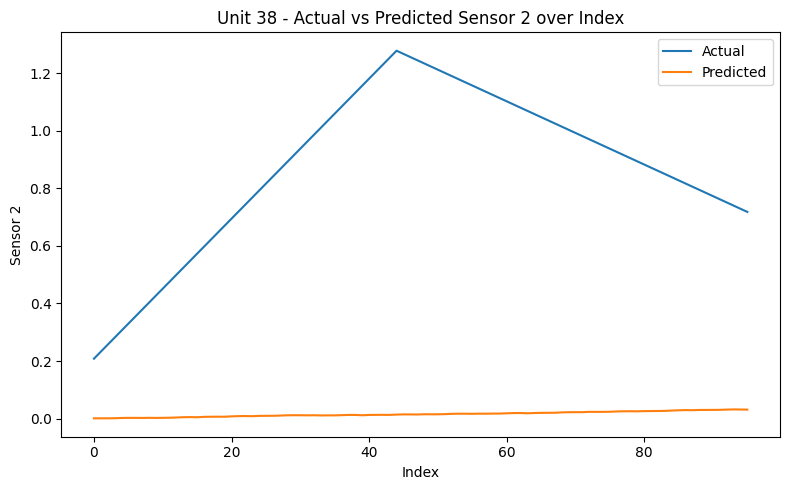

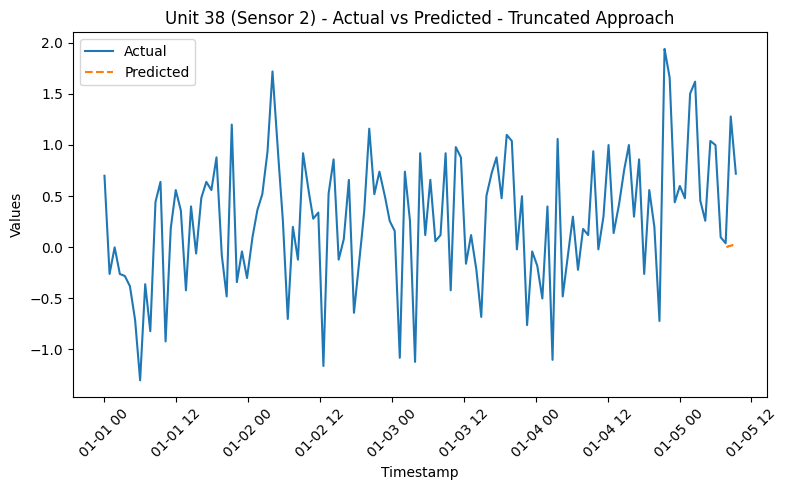

RMSE for Unit 38 - sensor_2: 0.9019911752483418
{'train': [0, 1470], 'valid': [958, 1653], 'test': [1141, 1836]}
1237
Dataset for unit 39 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[-1.893475962476081, -1.8922995887056098, -1.8911232149351385, -1.8899468411646672, -1.8887704673941959, -1.8875940936237245, -1.8864177198532532, -1.885241346082782, -1.8840649723123106, -1.8828885985418395, -1.8817122247713682, -1.880535851000897, -1.8793594772304256, -1.8781831034599543, -1.877006729689483, -1.8758303559190117, -1.8746539821485404, -1.873477608378069, -1.8723012346075978, -1.8711248608371267, -1.8699484870666554, -1.868772113296184, -1.8675957395257128, -1.8664193657552415, -1.8652429919847702, -1.8640666182142989, -1.8628902444438276, -1.8617138706733563, -1.860537496902885, -1.8593611231324139, -1.8581847493619426, -1.8570083755914712, -1.855832001821, -1.8546556280505286, -1.8534792542800573, -1.852302880509586, -1.8511265067391147, -1.8499501329686434, -1.848773759198172, -1.8475973854277008, -1.8464210116572297, -1.8452446378867584, -1.844068264116287, -1.8428918903458158, -1.8417155165753445, -1.828775405100147, -1.8158352936249496, -1.802895182149752, -1.7

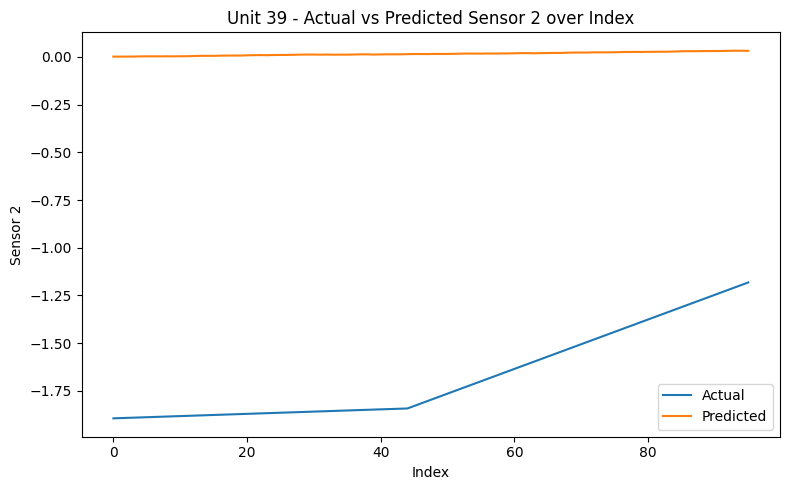

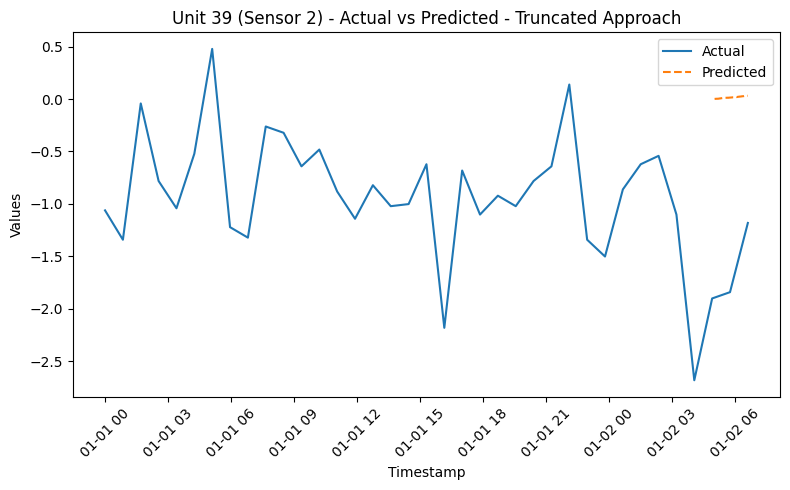

RMSE for Unit 39 - sensor_2: 1.7050412493325215
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 40 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[1.0458899653441662, 1.0384395981311725, 1.0309892309181787, 1.023538863705185, 1.0160884964921915, 1.0086381292791977, 1.001187762066204, 0.9937373948532102, 0.9862870276402165, 0.9788366604272228, 0.9713862932142291, 0.9639359260012353, 0.9564855587882417, 0.949035191575248, 0.9415848243622542, 0.9341344571492605, 0.9266840899362668, 0.9192337227232731, 0.9117833555102794, 0.9043329882972857, 0.896882621084292, 0.8894322538712982, 0.8819818866583045, 0.8745315194453108, 0.8670811522323171, 0.8596307850193234, 0.8521804178063297, 0.844730050593336, 0.8372796833803422, 0.8298293161673485, 0.8223789489543548, 0.8149285817413612, 0.8074782145283674, 0.8000278473153737, 0.7925774801023799, 0.7851271128893862, 0.7776767456763926, 0.7702263784633988, 0.7627760112504052, 0.7553256440374114, 0.7478752768244177, 0.7404249096114239, 0.7329745423984302, 0.7255241751854365, 0.7180738079724428, 0.7243478014149652, 0.7306217948574877, 0.7368957883000101, 0.7431697817425326, 0.7494437751850549, 0

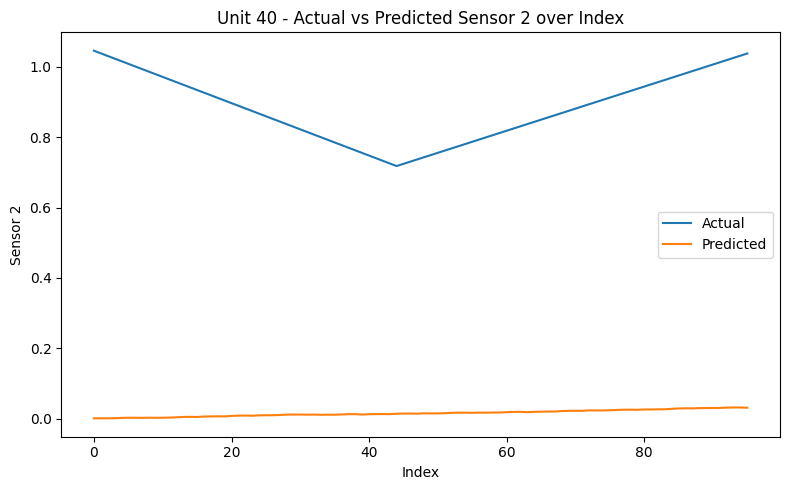

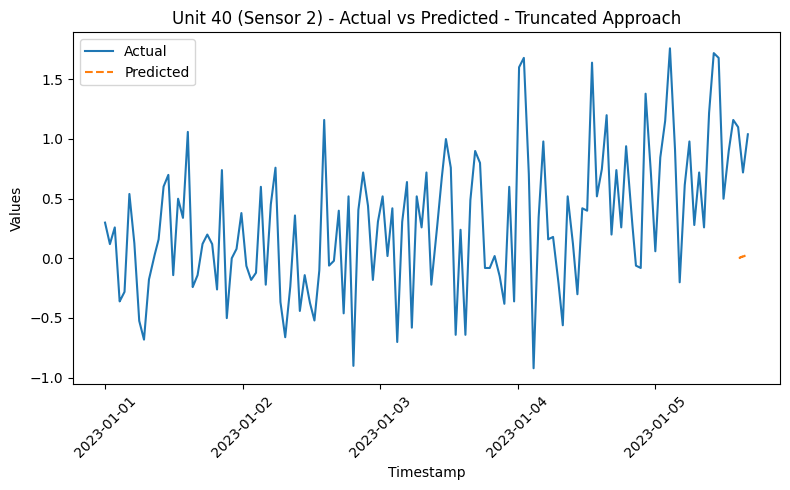

RMSE for Unit 40 - sensor_2: 0.8709553696933068
{'train': [0, 4978], 'valid': [4466, 5601], 'test': [5089, 6222]}
5623
Dataset for unit 41 is good


  0%|          | 0/55 [00:00<?, ?it/s]

96
[0.7463067784637848, 0.7474831522342605, 0.7486595260047363, 0.749835899775212, 0.7510122735456878, 0.7521886473161635, 0.7533650210866392, 0.7545413948571149, 0.7557177686275907, 0.7568941423980664, 0.7580705161685422, 0.7592468899390179, 0.7604232637094936, 0.7615996374799694, 0.7627760112504451, 0.7639523850209209, 0.7651287587913966, 0.7663051325618724, 0.7674815063323481, 0.7686578801028239, 0.7698342538732996, 0.7710106276437754, 0.7721870014142511, 0.7733633751847269, 0.7745397489552026, 0.7757161227256784, 0.7768924964961541, 0.7780688702666299, 0.7792452440371056, 0.7804216178075813, 0.7815979915780571, 0.7827743653485328, 0.7839507391190086, 0.7851271128894842, 0.78630348665996, 0.7874798604304357, 0.7886562342009115, 0.7898326079713872, 0.791008981741863, 0.7921853555123387, 0.7933617292828145, 0.7945381030532902, 0.795714476823766, 0.7968908505942417, 0.7980672243647174, 0.7768924964962121, 0.7557177686277067, 0.7345430407592013, 0.7133683128906958, 0.6921935850221904, 0

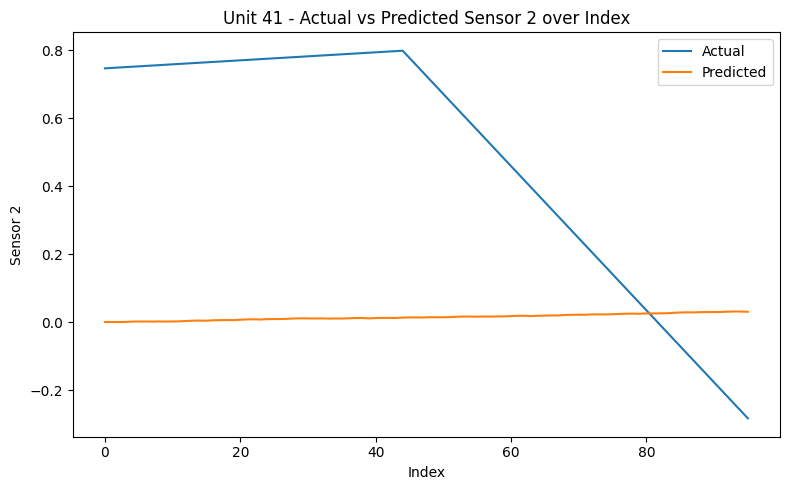

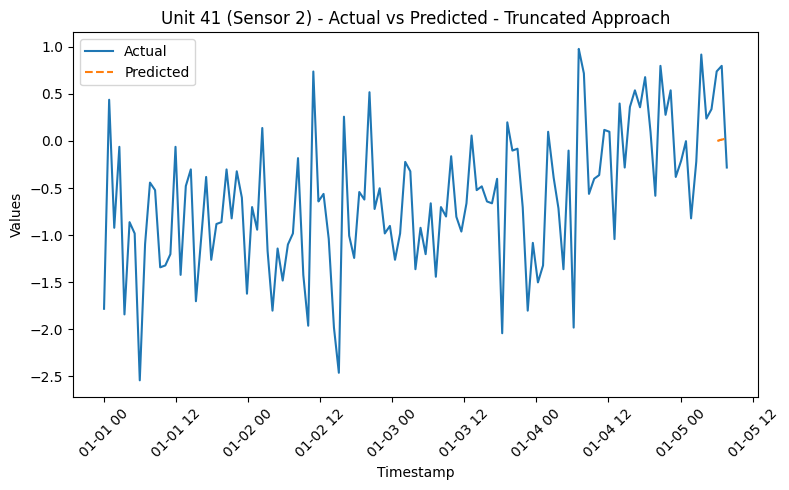

RMSE for Unit 41 - sensor_2: 0.5951583507417563
{'train': [0, 6325], 'valid': [5813, 7115], 'test': [6603, 7905]}
7306
Dataset for unit 42 is good


  0%|          | 0/76 [00:00<?, ?it/s]

96
[1.0525560833769214, 1.0917685423926666, 1.1309810014084116, 1.1701934604241568, 1.2094059194399018, 1.248618378455647, 1.2878308374713923, 1.3270432964871373, 1.3662557555028825, 1.4054682145186277, 1.4446806735343727, 1.4838931325501177, 1.5231055915658631, 1.562318050581608, 1.601530509597353, 1.6407429686130983, 1.6799554276288435, 1.7191678866445885, 1.7583803456603337, 1.7975928046760787, 1.836805263691824, 1.8760177227075692, 1.9152301817233142, 1.9544426407390594, 1.9936550997548044, 2.0328675587705494, 2.072080017786295, 2.11129247680204, 2.150504935817785, 2.1897173948335302, 2.2289298538492752, 2.26814231286502, 2.3073547718807657, 2.3465672308965106, 2.3857796899122556, 2.424992148928001, 2.464204607943746, 2.503417066959491, 2.5426295259752365, 2.581841984990981, 2.6210544440067265, 2.6602669030224715, 2.6994793620382165, 2.738691821053962, 2.777904280069707, 2.7481028112177364, 2.7183013423657663, 2.6884998735137957, 2.658698404661825, 2.628896935809855, 2.599095466957

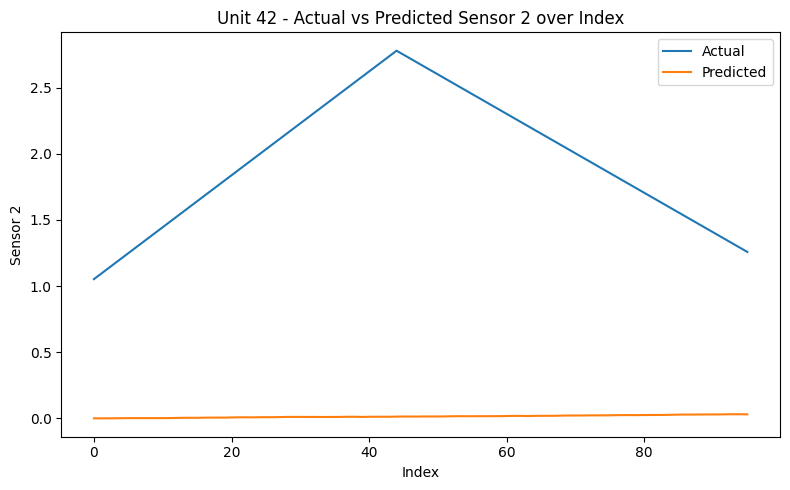

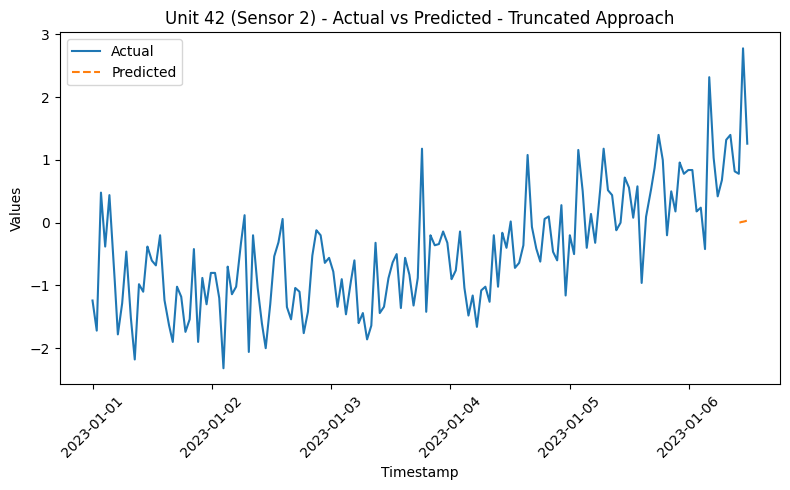

RMSE for Unit 42 - sensor_2: 2.0033470243716187
{'train': [0, 6978], 'valid': [6466, 7850], 'test': [7338, 8721]}
8122
Dataset for unit 43 is good


  0%|          | 0/87 [00:00<?, ?it/s]

96
[0.7568941423981601, 0.7510122735457948, 0.7451304046934294, 0.7392485358410641, 0.7333666669886988, 0.7274847981363334, 0.7216029292839681, 0.7157210604316028, 0.7098391915792374, 0.7039573227268721, 0.6980754538745068, 0.6921935850221415, 0.686311716169776, 0.6804298473174107, 0.6745479784650454, 0.66866610961268, 0.6627842407603147, 0.6569023719079494, 0.651020503055584, 0.6451386342032187, 0.6392567653508534, 0.633374896498488, 0.6274930276461227, 0.6216111587937574, 0.615729289941392, 0.6098474210890267, 0.6039655522366614, 0.5980836833842961, 0.5922018145319307, 0.5863199456795654, 0.5804380768272001, 0.5745562079748348, 0.5686743391224693, 0.562792470270104, 0.5569106014177387, 0.5510287325653733, 0.545146863713008, 0.5392649948606427, 0.5333831260082773, 0.527501257155912, 0.5216193883035467, 0.5157375194511813, 0.509855650598816, 0.5039737817464507, 0.49809191289408533, 0.4918179194515674, 0.4855439260090494, 0.47926993256653144, 0.47299593912401344, 0.4667219456814955, 0.4

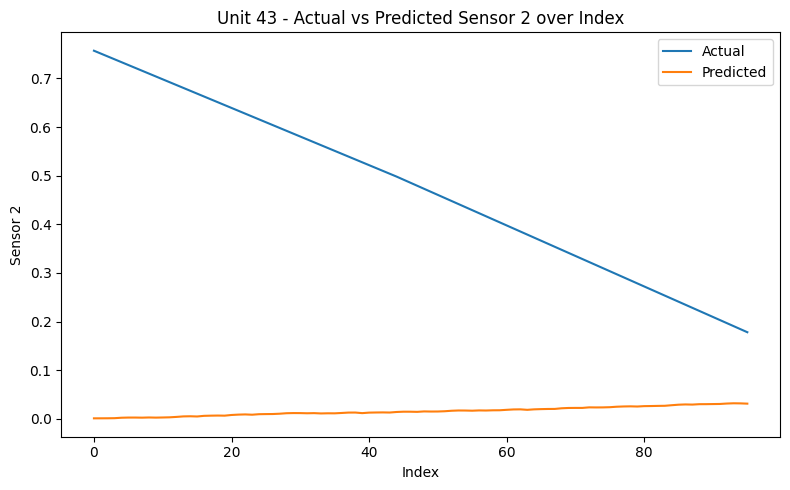

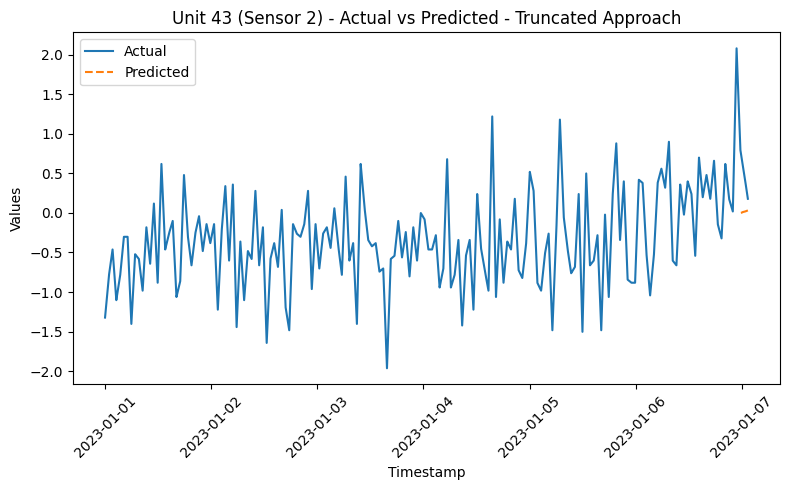

RMSE for Unit 43 - sensor_2: 0.48982530327331775
{'train': [0, 2163], 'valid': [1651, 2434], 'test': [1922, 2703]}
2104
Dataset for unit 44 is good


  0%|          | 0/11 [00:00<?, ?it/s]

96
[-0.5284902641379329, -0.5351563821706125, -0.5418225002032919, -0.5484886182359714, -0.555154736268651, -0.5618208543013306, -0.56848697233401, -0.5751530903666895, -0.5818192083993691, -0.5884853264320486, -0.5951514444647281, -0.6018175624974076, -0.6084836805300872, -0.6151497985627667, -0.6218159165954462, -0.6284820346281257, -0.6351481526608053, -0.6418142706934848, -0.6484803887261643, -0.6551465067588438, -0.6618126247915234, -0.6684787428242029, -0.6751448608568824, -0.6818109788895619, -0.6884770969222415, -0.695143214954921, -0.7018093329876005, -0.70847545102028, -0.7151415690529596, -0.7218076870856391, -0.7284738051183186, -0.7351399231509981, -0.7418060411836777, -0.7484721592163572, -0.7551382772490367, -0.7618043952817162, -0.7684705133143958, -0.7751366313470753, -0.7818027493797548, -0.7884688674124343, -0.7951349854451139, -0.8018011034777934, -0.8084672215104729, -0.8151333395431524, -0.821799457575832, -0.813172716592367, -0.804545975608902, -0.795919234625436

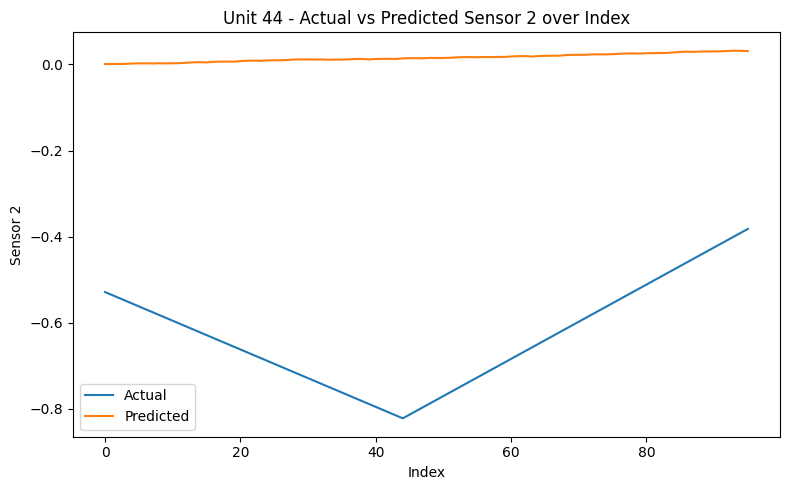

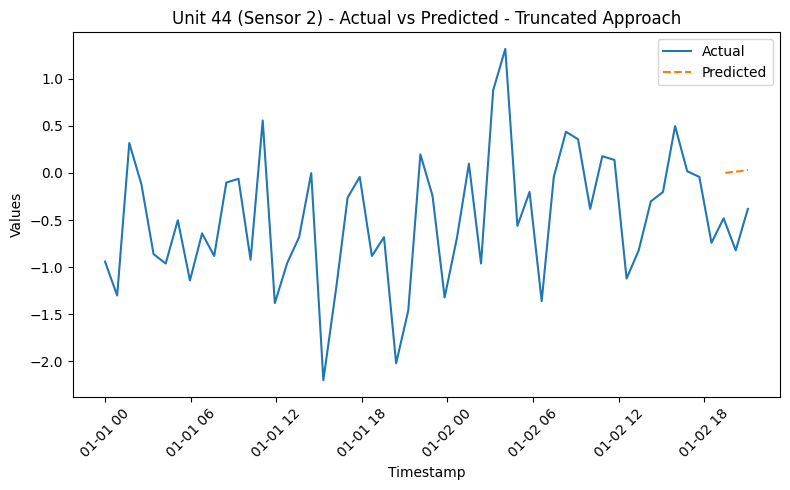

RMSE for Unit 44 - sensor_2: 0.6592892171126732
{'train': [0, 6162], 'valid': [5650, 6932], 'test': [6420, 7701]}
7102
Dataset for unit 45 is good


  0%|          | 0/74 [00:00<?, ?it/s]

96
[0.16792300798167792, 0.18360799158797508, 0.19929297519427225, 0.2149779588005694, 0.23066294240686655, 0.24634792601316371, 0.2620329096194609, 0.277717893225758, 0.2934028768320552, 0.30908786043835235, 0.3247728440446495, 0.3404578276509467, 0.35614281125724384, 0.371827794863541, 0.3875127784698381, 0.4031977620761353, 0.41888274568243244, 0.4345677292887296, 0.4502527128950268, 0.46593769650132394, 0.4816226801076211, 0.4973076637139182, 0.5129926473202153, 0.5286776309265125, 0.5443626145328098, 0.5600475981391069, 0.575732581745404, 0.5914175653517012, 0.6071025489579983, 0.6227875325642955, 0.6384725161705926, 0.6541574997768899, 0.669842483383187, 0.6855274669894842, 0.7012124505957813, 0.7168974342020784, 0.7325824178083756, 0.7482674014146727, 0.76395238502097, 0.7796373686272671, 0.7953223522335643, 0.8110073358398614, 0.8266923194461585, 0.8423773030524557, 0.858062286658753, 0.8439458014130842, 0.8298293161674154, 0.8157128309217466, 0.8015963456760778, 0.787479860430

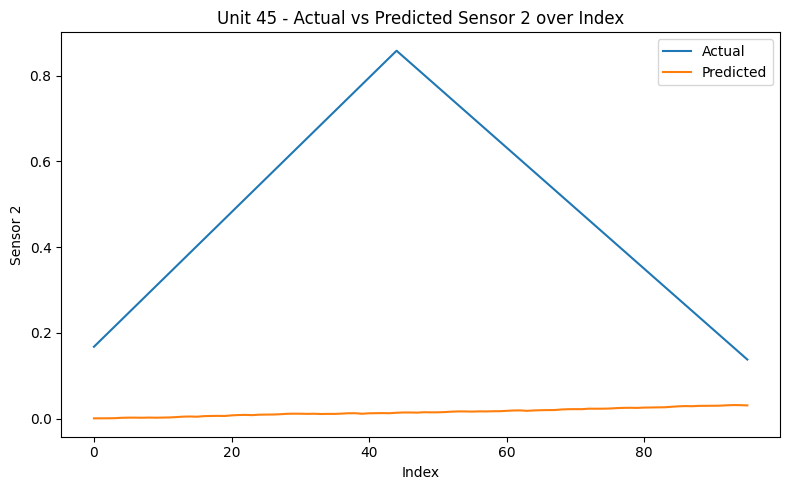

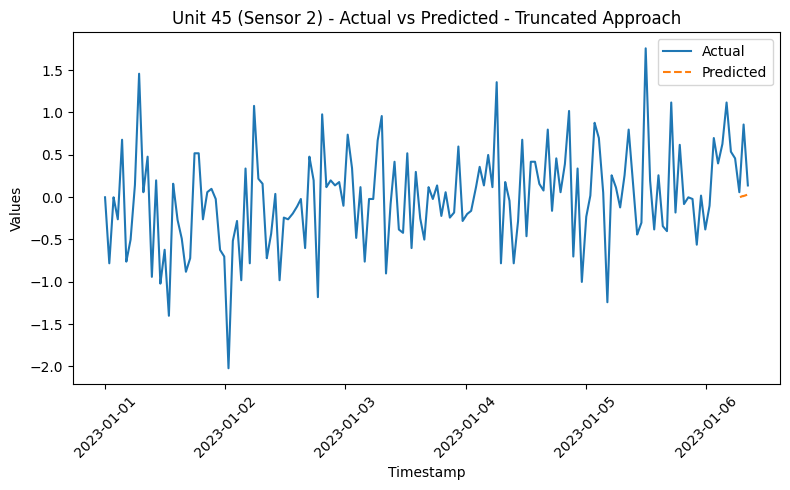

RMSE for Unit 45 - sensor_2: 0.5282077557757117
{'train': [0, 5917], 'valid': [5405, 6656], 'test': [6144, 7395]}
6796
Dataset for unit 46 is good


  0%|          | 0/70 [00:00<?, ?it/s]

96
[1.3321409161590012, 1.3427282800932563, 1.3533156440275111, 1.363903007961766, 1.374490371896021, 1.385077735830276, 1.3956650997645308, 1.4062524636987859, 1.4168398276330407, 1.4274271915672956, 1.4380145555015507, 1.4486019194358055, 1.4591892833700604, 1.4697766473043155, 1.4803640112385703, 1.4909513751728252, 1.5015387391070802, 1.512126103041335, 1.5227134669755902, 1.533300830909845, 1.5438881948441, 1.5544755587783547, 1.5650629227126098, 1.5756502866468647, 1.5862376505811198, 1.5968250145153746, 1.6074123784496295, 1.6179997423838843, 1.6285871063181394, 1.6391744702523943, 1.6497618341866493, 1.6603491981209042, 1.670936562055159, 1.681523925989414, 1.692111289923669, 1.7026986538579238, 1.713286017792179, 1.7238733817264338, 1.7344607456606886, 1.7450481095949435, 1.7556354735291986, 1.7662228374634534, 1.7768102013977085, 1.7873975653319634, 1.7979849292662182, 1.7670070866437766, 1.736029244021335, 1.705051401398893, 1.6740735587764515, 1.6430957161540098, 1.61211787

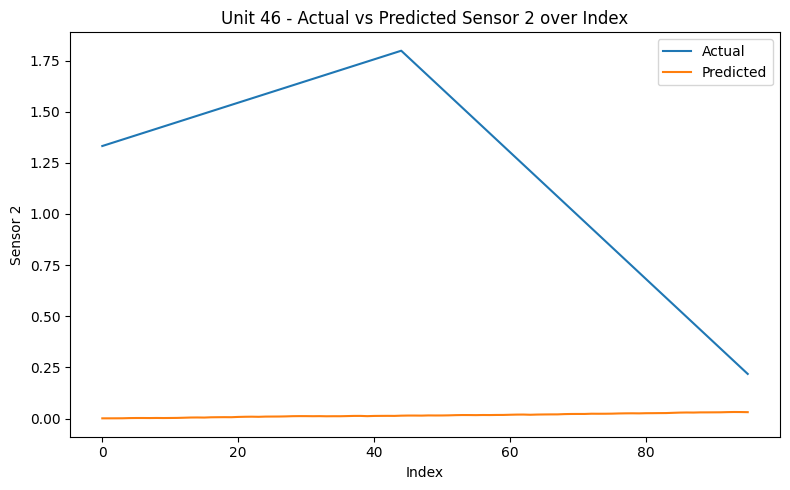

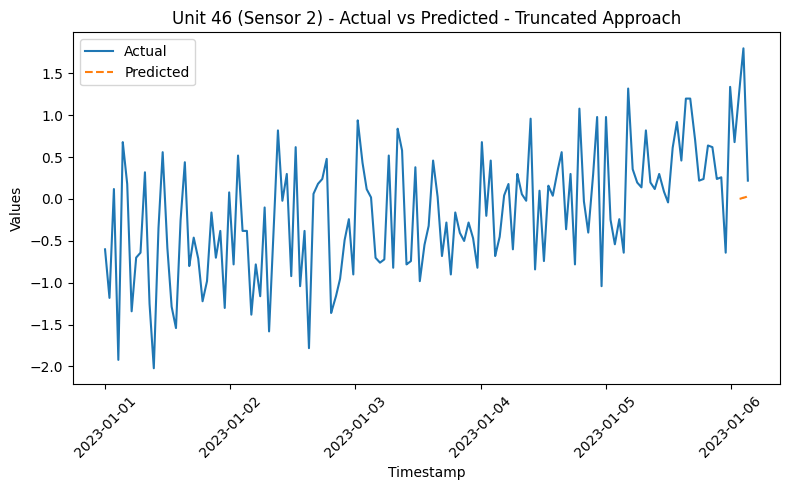

RMSE for Unit 46 - sensor_2: 1.325867644663684
{'train': [0, 2938], 'valid': [2426, 3306], 'test': [2794, 3672]}
3073
Dataset for unit 47 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[0.40829538174814184, 0.41260875223987437, 0.41692212273160684, 0.42123549322333936, 0.42554886371507183, 0.42986223420680436, 0.43417560469853683, 0.43848897519026936, 0.44280234568200183, 0.44711571617373436, 0.4514290866654668, 0.45574245715719935, 0.4600558276489318, 0.46436919814066435, 0.4686825686323968, 0.47299593912412935, 0.4773093096158618, 0.48162268010759435, 0.4859360505993268, 0.4902494210910593, 0.4945627915827918, 0.49887616207452434, 0.5031895325662568, 0.5075029030579893, 0.5118162735497218, 0.5161296440414543, 0.5204430145331869, 0.5247563850249193, 0.5290697555166518, 0.5333831260083843, 0.5376964965001167, 0.5420098669918493, 0.5463232374835818, 0.5506366079753143, 0.5549499784670469, 0.5592633489587793, 0.5635767194505118, 0.5678900899422443, 0.5722034604339767, 0.5765168309257093, 0.5808302014174418, 0.5851435719091742, 0.5894569424009067, 0.5937703128926393, 0.5980836833843718, 0.5882805686304355, 0.5784774538764992, 0.5686743391225629, 0.5588712243686267, 0

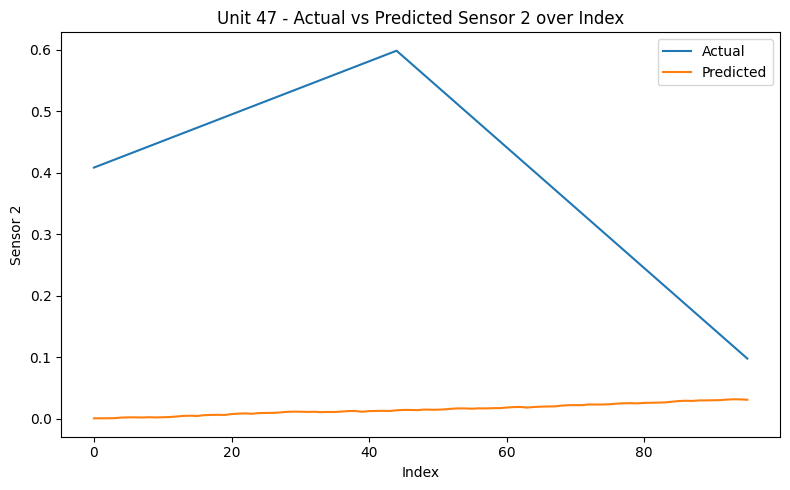

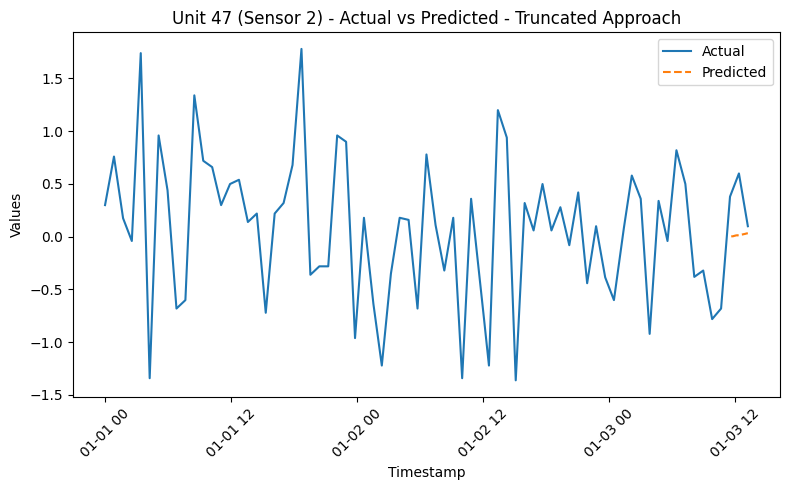

RMSE for Unit 47 - sensor_2: 0.4275373675764939
{'train': [0, 3142], 'valid': [2630, 3535], 'test': [3023, 3927]}
3328
Dataset for unit 48 is good


  0%|          | 0/27 [00:00<?, ?it/s]

96
[-0.1783230051273888, -0.18067575266833583, -0.18302850020928285, -0.18538124775022988, -0.1877339952911769, -0.19008674283212393, -0.19243949037307095, -0.19479223791401798, -0.197144985454965, -0.19949773299591203, -0.20185048053685906, -0.20420322807780608, -0.2065559756187531, -0.20890872315970013, -0.21126147070064716, -0.21361421824159418, -0.2159669657825412, -0.21831971332348823, -0.22067246086443526, -0.22302520840538229, -0.2253779559463293, -0.22773070348727634, -0.23008345102822336, -0.2324361985691704, -0.2347889461101174, -0.23714169365106444, -0.23949444119201146, -0.2418471887329585, -0.24419993627390552, -0.24655268381485254, -0.24890543135579957, -0.2512581788967466, -0.2536109264376936, -0.2559636739786406, -0.25831642151958767, -0.2606691690605347, -0.2630219166014817, -0.2653746641424287, -0.26772741168337577, -0.2700801592243228, -0.2724329067652698, -0.2747856543062168, -0.2771384018471639, -0.2794911493881109, -0.2818438969290579, -0.27282503135543584, -0.263

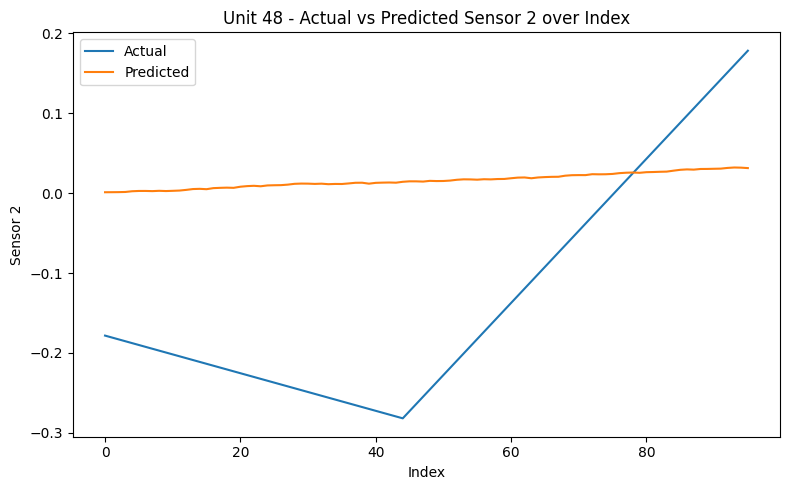

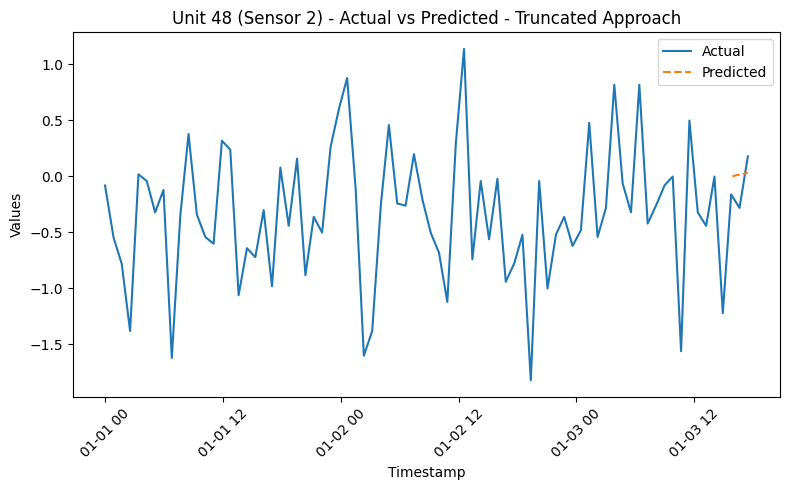

RMSE for Unit 48 - sensor_2: 0.19572932206507115
{'train': [0, 12322], 'valid': [11810, 13863], 'test': [13351, 15402]}
14803
Dataset for unit 49 is good


  0%|          | 0/170 [00:00<?, ?it/s]

96
[1.242736509603224, 1.2262672768166125, 1.2097980440300011, 1.19332881124339, 1.1768595784567786, 1.1603903456701672, 1.1439211128835558, 1.1274518800969444, 1.1109826473103332, 1.0945134145237219, 1.0780441817371105, 1.061574948950499, 1.0451057161638877, 1.0286364833772765, 1.012167250590665, 0.9956980178040538, 0.9792287850174424, 0.962759552230831, 0.9462903194442196, 0.9298210866576083, 0.913351853870997, 0.8968826210843857, 0.8804133882977743, 0.8639441555111629, 0.8474749227245516, 0.8310056899379402, 0.8145364571513288, 0.7980672243647176, 0.7815979915781062, 0.7651287587914948, 0.7486595260048835, 0.7321902932182721, 0.7157210604316607, 0.6992518276450495, 0.6827825948584381, 0.6663133620718267, 0.6498441292852154, 0.633374896498604, 0.6169056637119926, 0.6004364309253813, 0.58396719813877, 0.5674979653521586, 0.5510287325655473, 0.5345594997789359, 0.5180902669923245, 0.5286776309265749, 0.5392649948608255, 0.5498523587950759, 0.5604397227293264, 0.5710270866635768, 0.5816

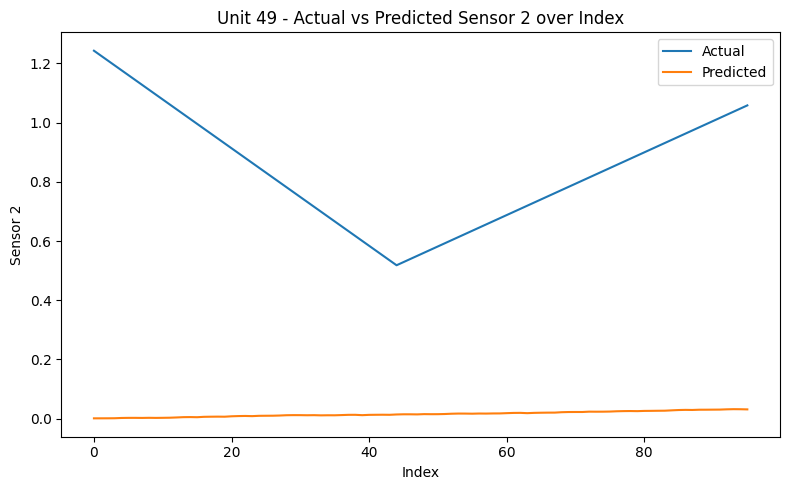

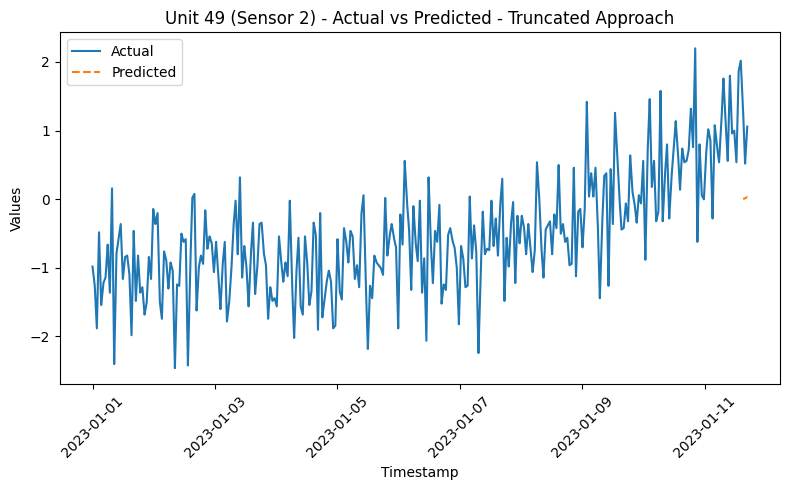

RMSE for Unit 49 - sensor_2: 0.8406909981971756
{'train': [0, 2979], 'valid': [2467, 3352], 'test': [2840, 3723]}
3124
Dataset for unit 50 is good


  0%|          | 0/24 [00:00<?, ?it/s]

96
[-0.21831971332341246, -0.2206724608643595, -0.2230252084053065, -0.22537795594625354, -0.22773070348720056, -0.2300834510281476, -0.23243619856909462, -0.23478894611004164, -0.23714169365098867, -0.2394944411919357, -0.24184718873288272, -0.24419993627382974, -0.24655268381477677, -0.2489054313557238, -0.2512581788966708, -0.25361092643761785, -0.25596367397856484, -0.2583164215195119, -0.2606691690604589, -0.26302191660140595, -0.26537466414235295, -0.2677274116833, -0.270080159224247, -0.27243290676519405, -0.27478565430614105, -0.2771384018470881, -0.2794911493880351, -0.28184389692898215, -0.28419664446992915, -0.2865493920108762, -0.2889021395518232, -0.29125488709277025, -0.29360763463371725, -0.2959603821746643, -0.2983131297156113, -0.30066587725655836, -0.30301862479750535, -0.3053713723384524, -0.3077241198793994, -0.31007686742034646, -0.31242961496129346, -0.31478236250224045, -0.3171351100431875, -0.31948785758413456, -0.32184060512508156, -0.3163508608628778, -0.31086

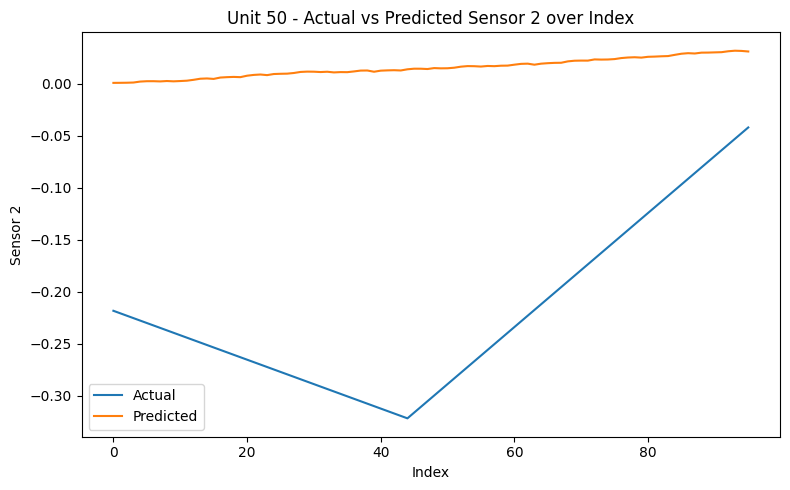

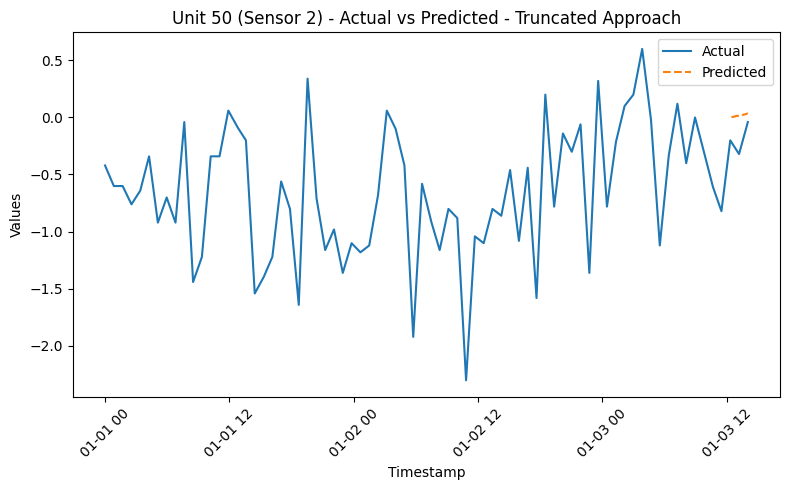

RMSE for Unit 50 - sensor_2: 0.24780666385609224
{'train': [0, 5835], 'valid': [5323, 6565], 'test': [6053, 7293]}
6694
Dataset for unit 51 is good


  0%|          | 0/69 [00:00<?, ?it/s]

96
[-0.7355320477412488, -0.697495962495975, -0.6594598772507012, -0.6214237920054273, -0.5833877067601535, -0.5453516215148797, -0.5073155362696058, -0.469279451024332, -0.4312433657790581, -0.3932072805337843, -0.3551711952885105, -0.3171351100432366, -0.2790990247979628, -0.24106293955268887, -0.20302685430741507, -0.16499076906214127, -0.12695468381686736, -0.08891859857159357, -0.05088251332631977, -0.012846428081045858, 0.025189657164228052, 0.06322574240950174, 0.10126182765477565, 0.13929791290004956, 0.17733399814532325, 0.21537008339059716, 0.25340616863587107, 0.29144225388114475, 0.32947833912641866, 0.36751442437169257, 0.40555050961696626, 0.44358659486224017, 0.4816226801075141, 0.519658765352788, 0.5576948505980617, 0.5957309358433356, 0.6337670210886095, 0.6718031063338832, 0.7098391915791571, 0.747875276824431, 0.7859113620697047, 0.8239474473149786, 0.8619835325602525, 0.9000196178055262, 0.9380557030508002, 0.9149203522315094, 0.8917850014122185, 0.8686496505929275,

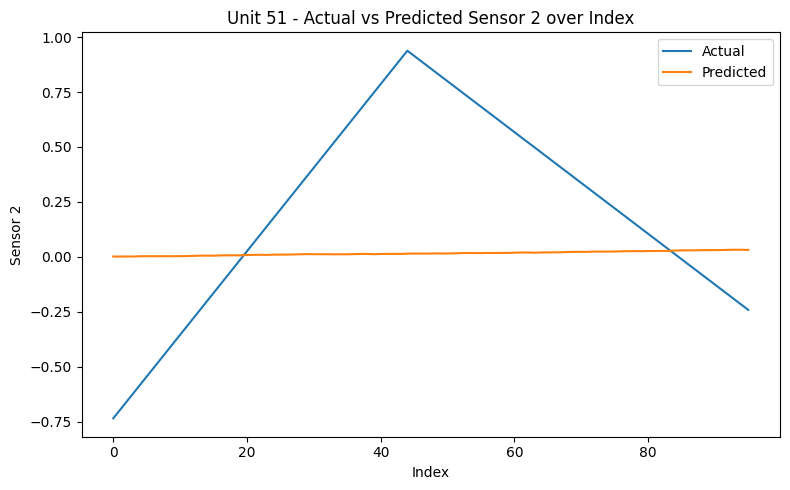

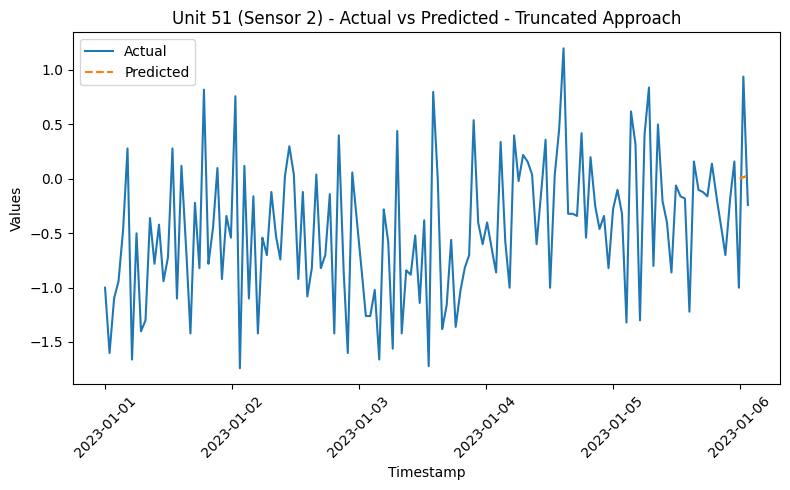

RMSE for Unit 51 - sensor_2: 0.4822122337470939
{'train': [0, 7671], 'valid': [7159, 8630], 'test': [8118, 9588]}
8989
Dataset for unit 52 is good


  0%|          | 0/97 [00:00<?, ?it/s]

96
[0.22948656863641315, 0.21968345388247684, 0.2098803391285406, 0.2000772243746043, 0.190274109620668, 0.18047099486673174, 0.17066788011279546, 0.16086476535885916, 0.15106165060492288, 0.1412585358509866, 0.13145542109705033, 0.12165230634311405, 0.11184919158917775, 0.10204607683524147, 0.0922429620813052, 0.08243984732736892, 0.07263673257343264, 0.06283361781949637, 0.053030503065560064, 0.043227388311623816, 0.03342427355768751, 0.023621158803751208, 0.01381804404981496, 0.004014929295878655, -0.005788185458057593, -0.015591300211993897, -0.0253944149659302, -0.03519752971986645, -0.04500064447380275, -0.054803759227739, -0.0646068739816753, -0.07440998873561161, -0.08421310348954786, -0.09401621824348416, -0.10381933299742041, -0.11362244775135671, -0.12342556250529302, -0.13322867725922927, -0.14303179201316557, -0.15283490676710182, -0.16263802152103812, -0.17244113627497437, -0.18224425102891068, -0.19204736578284698, -0.20185048053678328, -0.17949937889781106, -0.157148277

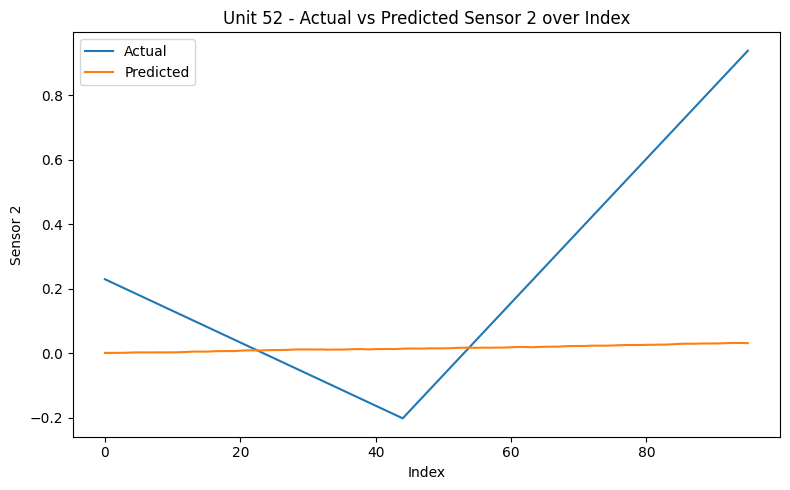

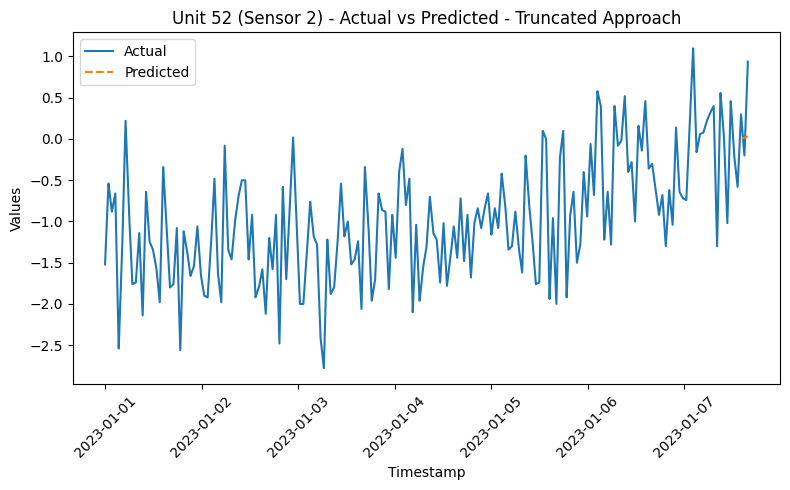

RMSE for Unit 52 - sensor_2: 0.362349193286253
{'train': [0, 6651], 'valid': [6139, 7483], 'test': [6971, 8313]}
7714
Dataset for unit 53 is good


  0%|          | 0/81 [00:00<?, ?it/s]

96
[0.8066939653481111, 0.7964987260040177, 0.7863034866599243, 0.776108247315831, 0.7659130079717376, 0.7557177686276442, 0.7455225292835508, 0.7353272899394575, 0.7251320505953641, 0.7149368112512707, 0.7047415719071773, 0.694546332563084, 0.6843510932189907, 0.6741558538748973, 0.6639606145308039, 0.6537653751867105, 0.6435701358426171, 0.6333748964985237, 0.6231796571544304, 0.612984417810337, 0.6027891784662436, 0.5925939391221502, 0.5823986997780568, 0.5722034604339635, 0.5620082210898701, 0.5518129817457768, 0.5416177424016834, 0.53142250305759, 0.5212272637134967, 0.5110320243694033, 0.5008367850253099, 0.49064154568121654, 0.48044630633712315, 0.47025106699302976, 0.4600558276489364, 0.449860588304843, 0.43966534896074966, 0.42947010961665627, 0.4192748702725629, 0.40907963092846955, 0.39888439158437616, 0.3886891522402828, 0.3784939128961894, 0.368298673552096, 0.35810343420800256, 0.35849555879815964, 0.3588876833883167, 0.35927980797847386, 0.35967193256863095, 0.3600640571

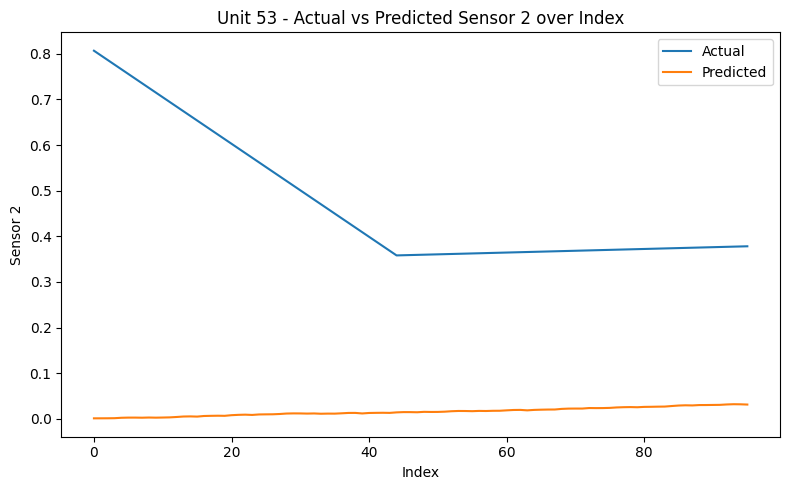

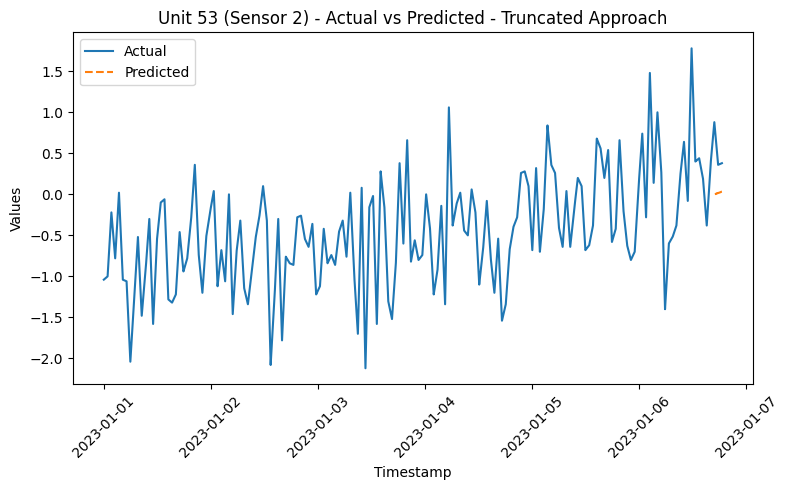

RMSE for Unit 53 - sensor_2: 0.47639589745196104
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 54 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[-0.6535780083983046, -0.6723999887258585, -0.6912219690534124, -0.7100439493809663, -0.7288659297085203, -0.7476879100360742, -0.766509890363628, -0.785331870691182, -0.8041538510187359, -0.8229758313462898, -0.8417978116738437, -0.8606197920013976, -0.8794417723289516, -0.8982637526565055, -0.9170857329840594, -0.9359077133116134, -0.9547296936391673, -0.9735516739667212, -0.992373654294275, -1.011195634621829, -1.030017614949383, -1.0488395952769367, -1.0676615756044907, -1.0864835559320447, -1.1053055362595985, -1.1241275165871525, -1.1429494969147065, -1.1617714772422603, -1.1805934575698143, -1.1994154378973683, -1.218237418224922, -1.237059398552476, -1.25588137888003, -1.2747033592075838, -1.2935253395351376, -1.3123473198626916, -1.3311693001902456, -1.3499912805177994, -1.3688132608453534, -1.3876352411729074, -1.4064572215004612, -1.4252792018280152, -1.4441011821555692, -1.462923162483123, -1.481745142810677, -1.462531037892966, -1.4433169329752549, -1.4241028280575438, 

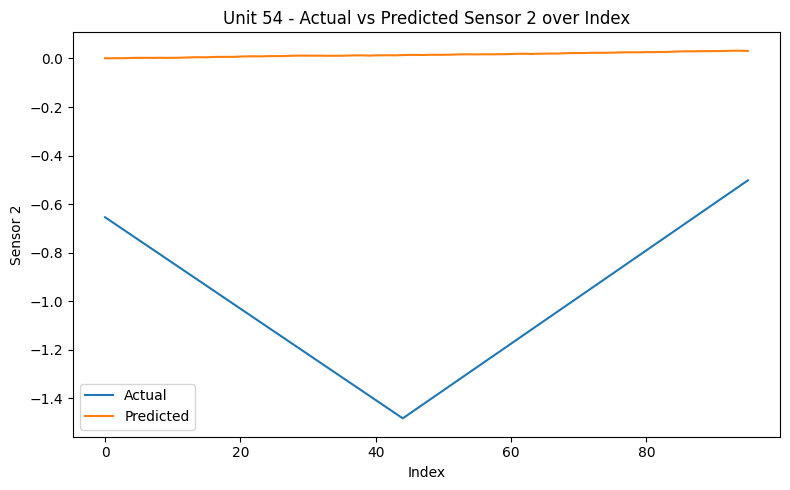

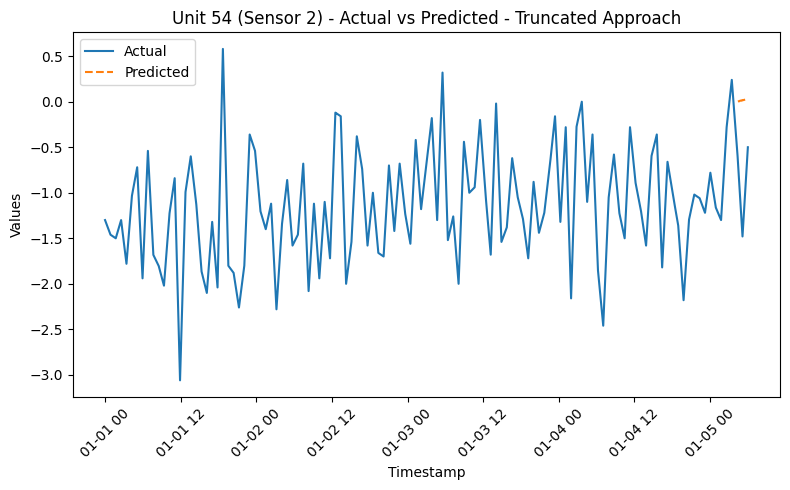

RMSE for Unit 54 - sensor_2: 1.0716391719705258
{'train': [0, 4570], 'valid': [4058, 5142], 'test': [4630, 5712]}
5113
Dataset for unit 55 is good


  0%|          | 0/49 [00:00<?, ?it/s]

96
[0.1396900374902423, 0.1342002932280385, 0.12871054896583473, 0.12322080470363095, 0.11773106044142717, 0.1122413161792234, 0.1067515719170196, 0.10126182765481583, 0.09577208339261203, 0.09028233913040826, 0.08479259486820448, 0.07930285060600069, 0.07381310634379691, 0.06832336208159312, 0.06283361781938934, 0.057343873557185565, 0.05185412929498179, 0.04636438503277801, 0.040874640770574205, 0.03538489650837043, 0.02989515224616665, 0.024405407983962873, 0.018915663721759096, 0.013425919459555291, 0.007936175197351514, 0.0024464309351477365, -0.003043313327056041, -0.008533057589259818, -0.014022801851463623, -0.0195125461136674, -0.025002290375871178, -0.030492034638074955, -0.03598177890027873, -0.04147152316248254, -0.046961267424686315, -0.05245101168689009, -0.05794075594909387, -0.06343050021129765, -0.06892024447350142, -0.0744099887357052, -0.07989973299790898, -0.08538947726011276, -0.09087922152231659, -0.09636896578452037, -0.10185871004672414, -0.11872006742349259, -0

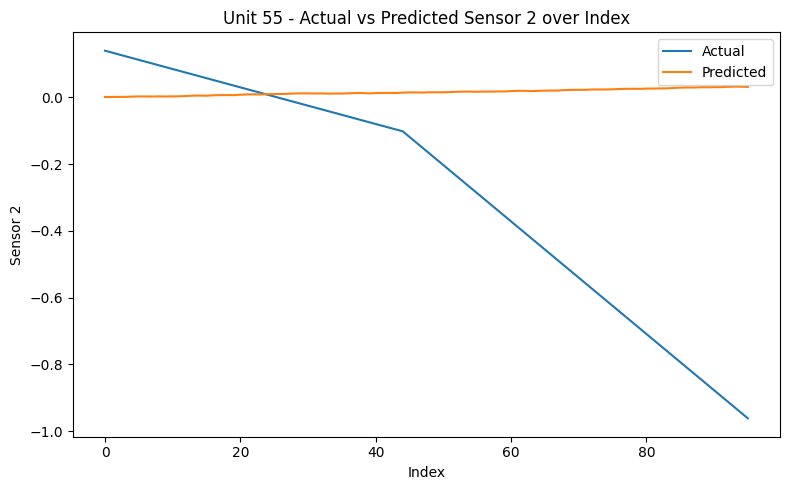

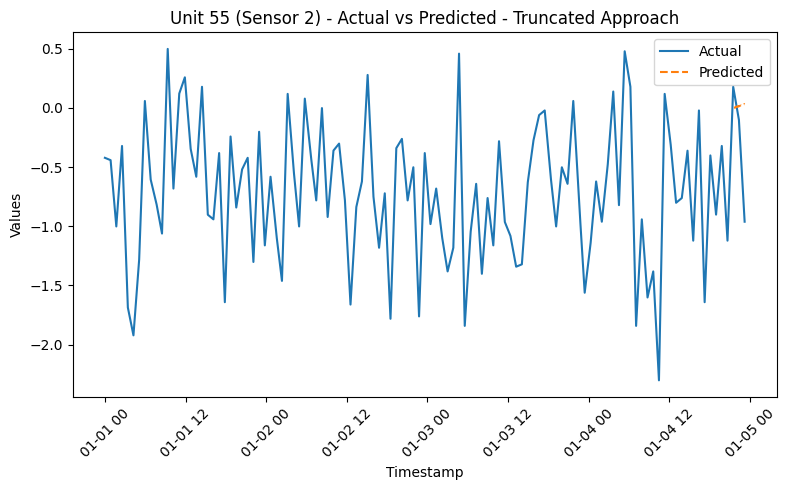

RMSE for Unit 55 - sensor_2: 0.45301689478749124
{'train': [0, 5509], 'valid': [4997, 6197], 'test': [5685, 6885]}
6286
Dataset for unit 56 is good


  0%|          | 0/64 [00:00<?, ?it/s]

96
[0.8490434210851397, 0.8506119194457681, 0.8521804178063965, 0.8537489161670249, 0.8553174145276533, 0.8568859128882816, 0.85845441124891, 0.8600229096095384, 0.8615914079701668, 0.8631599063307952, 0.8647284046914235, 0.8662969030520519, 0.8678654014126803, 0.8694338997733086, 0.8710023981339371, 0.8725708964945654, 0.8741393948551939, 0.8757078932158222, 0.8772763915764505, 0.878844889937079, 0.8804133882977073, 0.8819818866583358, 0.8835503850189641, 0.8851188833795924, 0.8866873817402209, 0.8882558801008492, 0.8898243784614777, 0.891392876822106, 0.8929613751827343, 0.8945298735433628, 0.8960983719039911, 0.8976668702646196, 0.8992353686252479, 0.9008038669858762, 0.9023723653465047, 0.903940863707133, 0.9055093620677614, 0.9070778604283898, 0.9086463587890181, 0.9102148571496466, 0.9117833555102749, 0.9133518538709033, 0.9149203522315317, 0.9164888505921601, 0.9180573489527885, 0.9251155915756251, 0.9321738341984617, 0.9392320768212983, 0.9462903194441349, 0.9533485620669715, 0

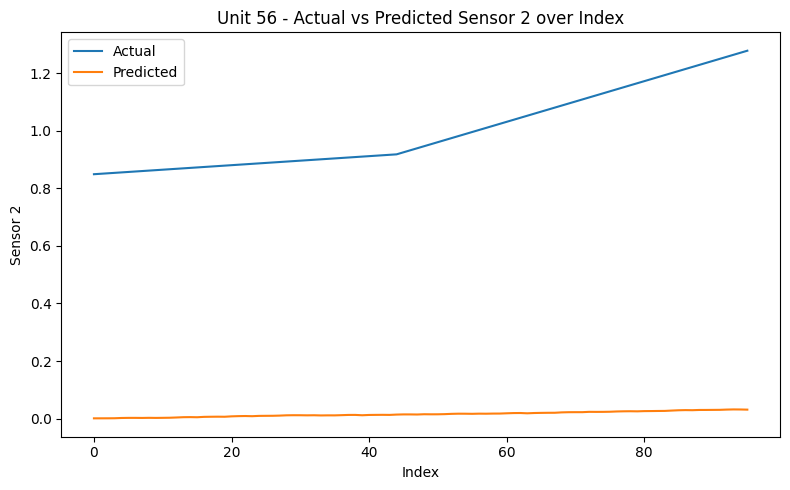

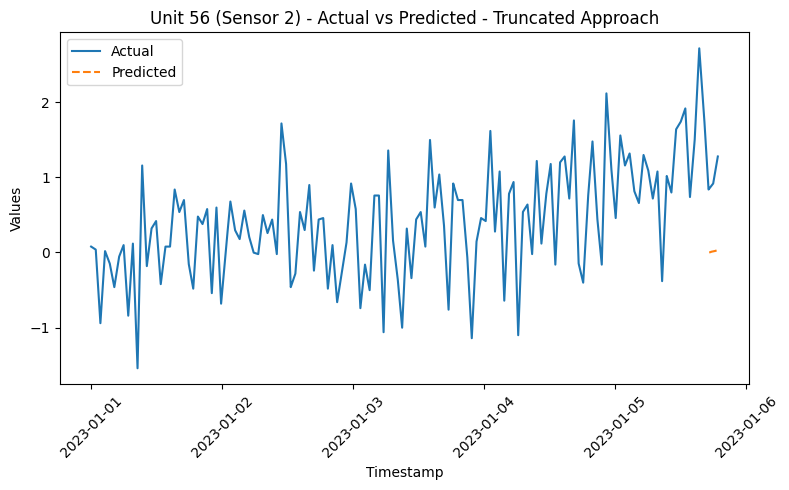

RMSE for Unit 56 - sensor_2: 0.9915505849373922
{'train': [0, 6488], 'valid': [5976, 7299], 'test': [6787, 8109]}
7510
Dataset for unit 57 is good


  0%|          | 0/79 [00:00<?, ?it/s]

96
[0.3632010538800136, 0.3553585620768673, 0.3475160702737209, 0.33967357847057456, 0.3318310866674282, 0.3239885948642819, 0.3161461030611355, 0.30830361125798916, 0.30046111945484283, 0.29261862765169644, 0.2847761358485501, 0.27693364404540377, 0.26909115224225744, 0.2612486604391111, 0.2534061686359647, 0.24556367683281838, 0.23772118502967202, 0.22987869322652565, 0.22203620142337932, 0.21419370962023296, 0.20635121781708662, 0.19850872601394026, 0.19066623421079393, 0.18282374240764757, 0.17498125060450123, 0.16713875880135487, 0.15929626699820854, 0.15145377519506215, 0.1436112833919158, 0.13576879158876948, 0.12792629978562314, 0.12008380798247675, 0.11224131617933042, 0.10439882437618409, 0.0965563325730377, 0.08871384076989136, 0.08087134896674503, 0.07302885716359869, 0.0651863653604523, 0.05734387355730597, 0.049501381754159635, 0.041658889951013245, 0.03381639814786691, 0.025973906344720576, 0.01813141454157417, -0.002259064146617036, -0.02264954283480824, -0.043040021522

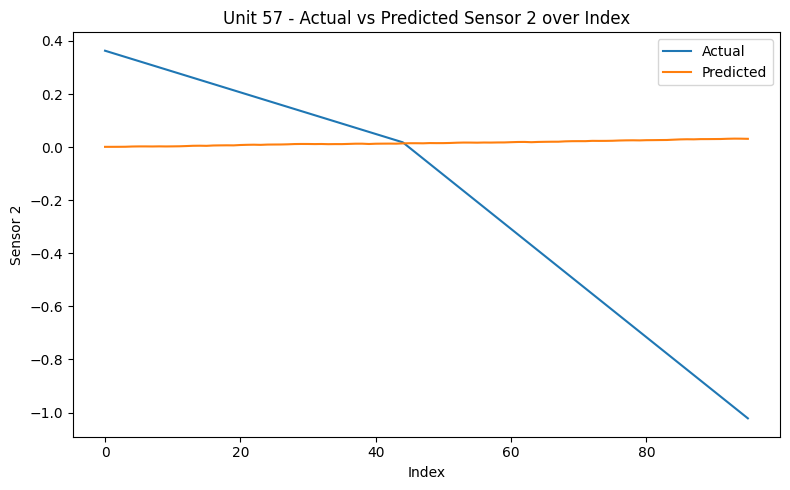

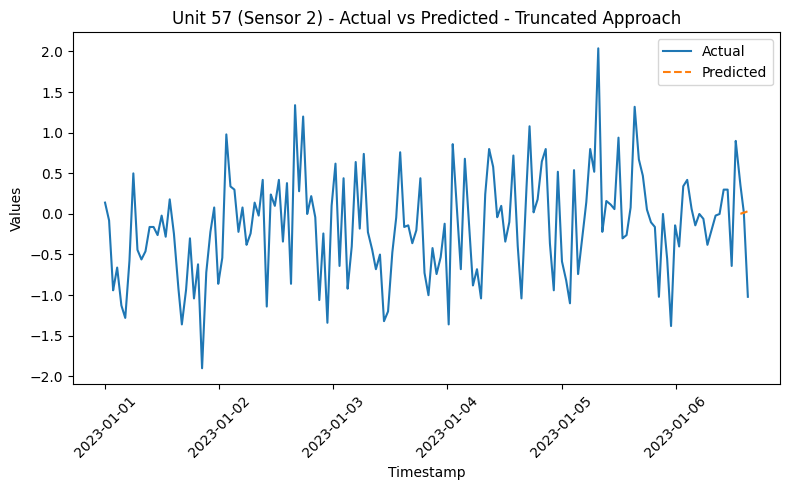

RMSE for Unit 57 - sensor_2: 0.4715969470609682
{'train': [0, 7141], 'valid': [6629, 8033], 'test': [7521, 8925]}
8326
Dataset for unit 58 is good


  0%|          | 0/89 [00:00<?, ?it/s]

96
[0.4910336702714137, 0.515737519451333, 0.5404413686312521, 0.5651452178111714, 0.5898490669910907, 0.6145529161710099, 0.6392567653509292, 0.6639606145308485, 0.6886644637107677, 0.7133683128906869, 0.7380721620706062, 0.7627760112505255, 0.7874798604304447, 0.8121837096103639, 0.8368875587902833, 0.8615914079702025, 0.8862952571501217, 0.9109991063300411, 0.9357029555099603, 0.9604068046898795, 0.9851106538697987, 1.009814503049718, 1.0345183522296373, 1.0592222014095565, 1.0839260505894757, 1.108629899769395, 1.1333337489493143, 1.1580375981292335, 1.1827414473091529, 1.207445296489072, 1.2321491456689913, 1.2568529948489104, 1.2815568440288299, 1.306260693208749, 1.3309645423886685, 1.3556683915685876, 1.3803722407485068, 1.405076089928426, 1.4297799391083454, 1.4544837882882646, 1.4791876374681838, 1.5038914866481032, 1.5285953358280224, 1.5532991850079416, 1.5780030341878608, 1.5599653030406166, 1.5419275718933725, 1.5238898407461283, 1.5058521095988842, 1.4878143784516398, 1.

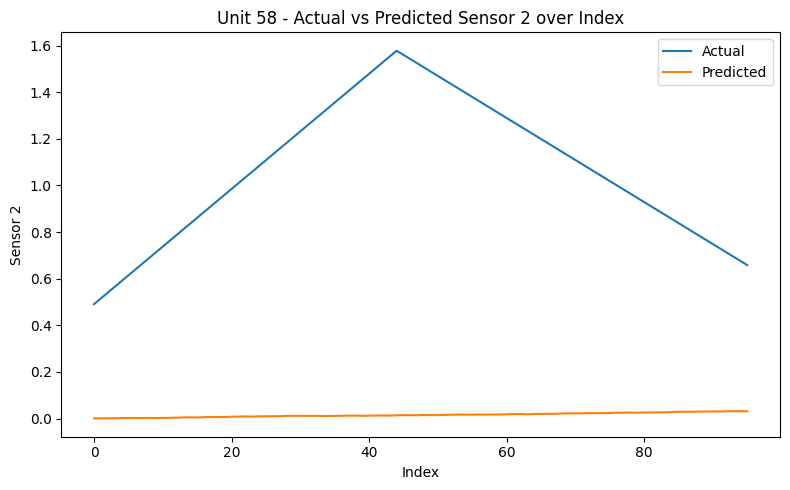

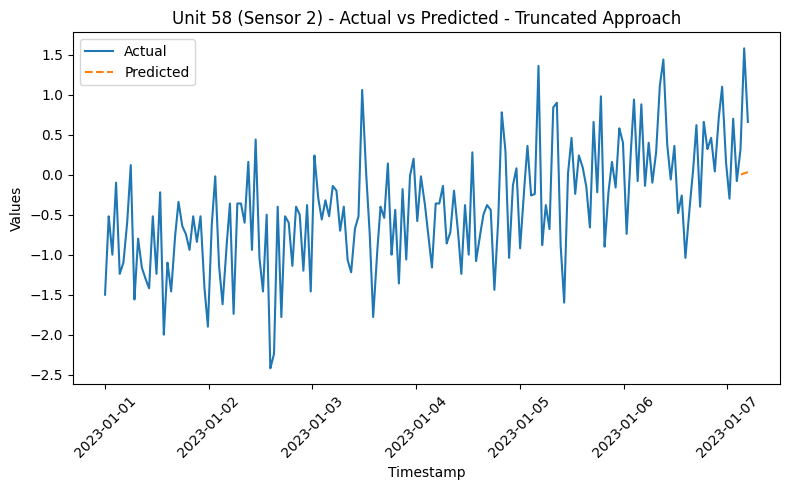

RMSE for Unit 58 - sensor_2: 1.098692446563777
{'train': [0, 3795], 'valid': [3283, 4270], 'test': [3758, 4743]}
4144
Dataset for unit 59 is good


  0%|          | 0/37 [00:00<?, ?it/s]

96
[-1.2119634247825022, -1.196278441176205, -1.180593457569908, -1.1649084739636109, -1.1492234903573135, -1.1335385067510164, -1.1178535231447193, -1.1021685395384222, -1.086483555932125, -1.0707985723258278, -1.0551135887195306, -1.0394286051132335, -1.0237436215069362, -1.008058637900639, -0.992373654294342, -0.9766886706880449, -0.9610036870817477, -0.9453187034754506, -0.9296337198691533, -0.9139487362628562, -0.8982637526565591, -0.8825787690502619, -0.8668937854439647, -0.8512088018376676, -0.8355238182313705, -0.8198388346250732, -0.8041538510187761, -0.7884688674124789, -0.7727838838061818, -0.7570989001998846, -0.7414139165935875, -0.7257289329872902, -0.7100439493809931, -0.6943589657746959, -0.6786739821683988, -0.6629889985621016, -0.6473040149558045, -0.6316190313495073, -0.6159340477432101, -0.6002490641369129, -0.5845640805306158, -0.5688790969243187, -0.5531941133180215, -0.5375091297117244, -0.5218241461054272, -0.5312351362692064, -0.5406461264329855, -0.55005711659

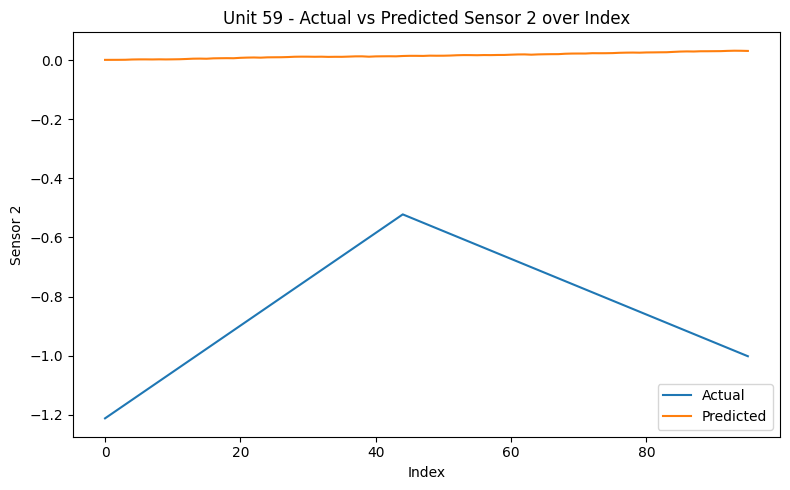

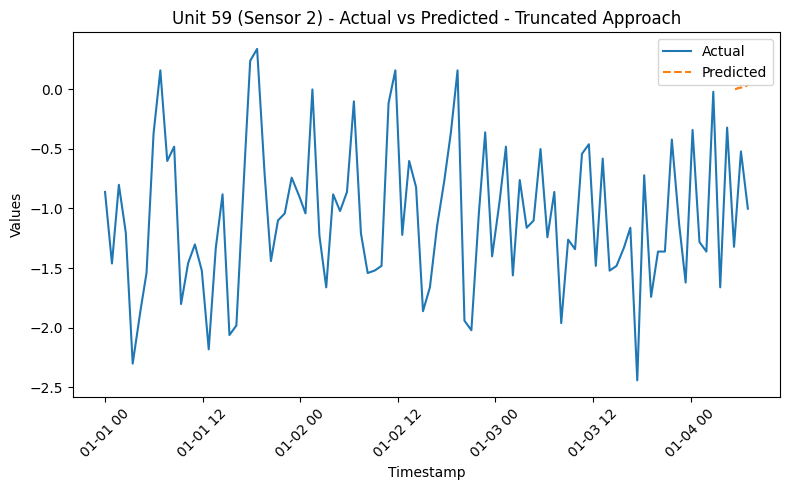

RMSE for Unit 59 - sensor_2: 0.8480530847907393
{'train': [0, 5958], 'valid': [5446, 6702], 'test': [6190, 7446]}
6847
Dataset for unit 60 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[-0.21008509693011349, -0.2112614707005892, -0.21243784447106495, -0.2136142182415407, -0.21479059201201645, -0.2159669657824922, -0.2171433395529679, -0.21831971332344366, -0.2194960870939194, -0.22067246086439515, -0.2218488346348709, -0.22302520840534662, -0.22420158217582237, -0.22537795594629811, -0.22655432971677386, -0.2277307034872496, -0.22890707725772536, -0.23008345102820107, -0.23125982479867682, -0.23243619856915257, -0.23361257233962832, -0.23478894611010404, -0.23596531988057978, -0.23714169365105553, -0.23831806742153128, -0.23949444119200702, -0.24067081496248277, -0.2418471887329585, -0.24302356250343424, -0.24419993627390998, -0.24537631004438573, -0.24655268381486145, -0.2477290575853372, -0.24890543135581294, -0.2500818051262887, -0.25125817889676444, -0.2524345526672402, -0.25361092643771593, -0.2547873002081917, -0.25596367397866737, -0.2571400477491431, -0.25831642151961887, -0.2594927952900946, -0.26066916906057036, -0.2618455428310461, -0.2496896805361628, 

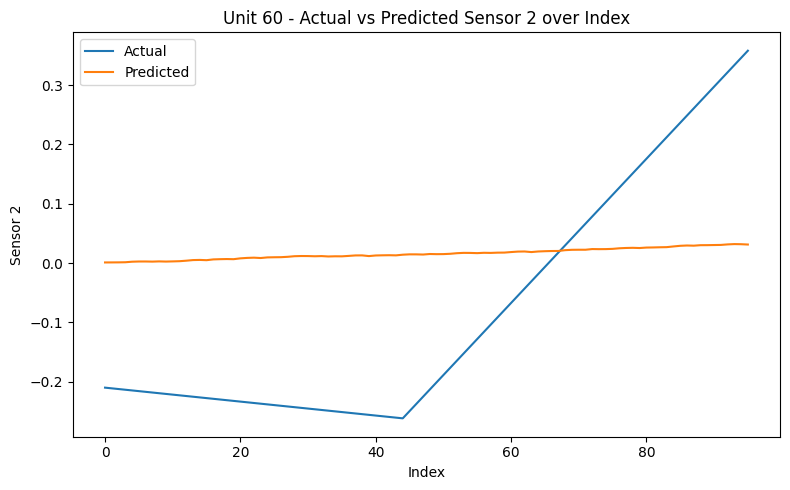

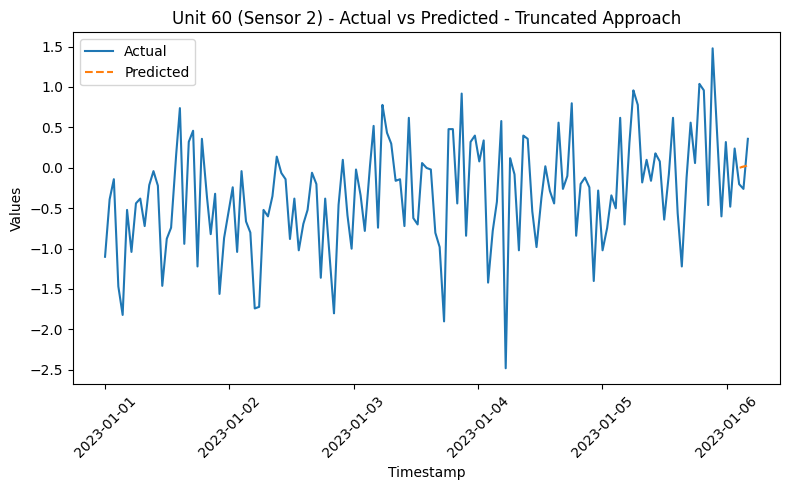

RMSE for Unit 60 - sensor_2: 0.21108483949910967
{'train': [0, 6447], 'valid': [5935, 7253], 'test': [6741, 8058]}
7459
Dataset for unit 61 is good


  0%|          | 0/78 [00:00<?, ?it/s]

96
[1.0423608440326588, 1.0172648702625824, 0.9921688964925061, 0.9670729227224297, 0.9419769489523534, 0.9168809751822771, 0.8917850014122006, 0.8666890276421244, 0.841593053872048, 0.8164970801019716, 0.7914011063318953, 0.7663051325618189, 0.7412091587917427, 0.7161131850216662, 0.6910172112515899, 0.6659212374815136, 0.6408252637114372, 0.6157292899413609, 0.5906333161712845, 0.5655373424012081, 0.5404413686311318, 0.5153453948610555, 0.49024942109097913, 0.4651534473209027, 0.44005747355082636, 0.41496149978075003, 0.3898655260106737, 0.3647695522405974, 0.33967357847052093, 0.3145776047004446, 0.28948163093036827, 0.26438565716029194, 0.2392896833902156, 0.21419370962013917, 0.18909773585006295, 0.1640017620799865, 0.13890578830991007, 0.11380981453983385, 0.08871384076975741, 0.0636178669996812, 0.03852189322960475, 0.013425919459528535, -0.011670054310547906, -0.03676602808062435, -0.06186200185070049, -0.03676602808062414, -0.011670054310547788, 0.013425919459528556, 0.0385218

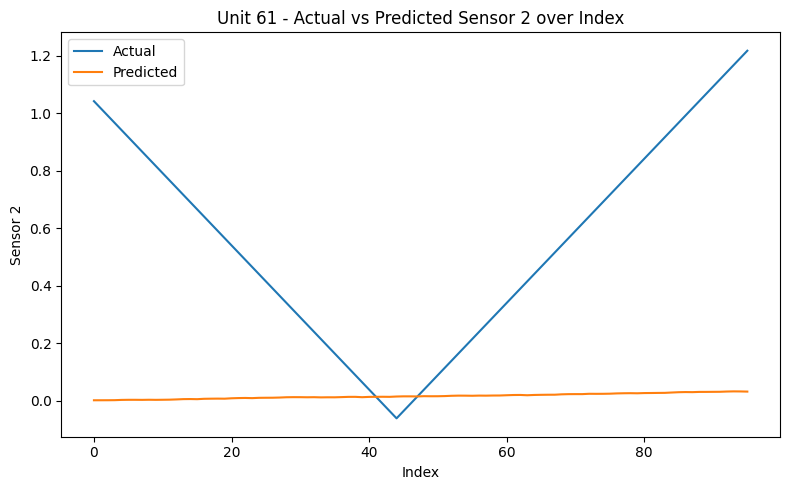

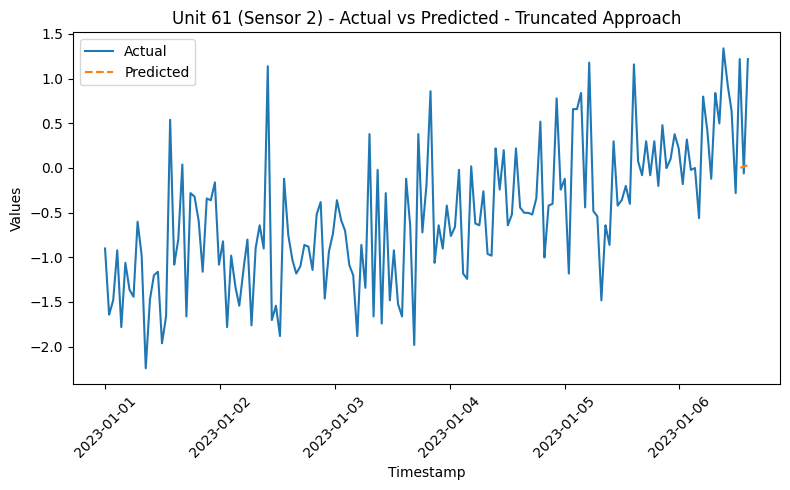

RMSE for Unit 61 - sensor_2: 0.6339587879252633
{'train': [0, 9426], 'valid': [8914, 10604], 'test': [10092, 11781]}
11182
Dataset for unit 62 is good


  0%|          | 0/125 [00:00<?, ?it/s]

96
[-0.5578996083998488, -0.5516256149573308, -0.5453516215148128, -0.5390776280722948, -0.5328036346297769, -0.5265296411872589, -0.5202556477447409, -0.5139816543022229, -0.507707660859705, -0.501433667417187, -0.495159673974669, -0.48888568053215103, -0.48261168708963303, -0.4763376936471151, -0.4700637002045971, -0.4637897067620791, -0.45751571331956115, -0.4512417198770432, -0.4449677264345252, -0.4386937329920072, -0.43241973954948926, -0.4261457461069713, -0.4198717526644533, -0.4135977592219353, -0.40732376577941737, -0.4010497723368994, -0.3947757788943814, -0.3885017854518634, -0.3822277920093455, -0.37595379856682754, -0.36967980512430954, -0.36340581168179154, -0.3571318182392736, -0.3508578247967556, -0.34458383135423765, -0.33830983791171965, -0.3320358444692017, -0.3257618510266837, -0.31948785758416576, -0.31321386414164776, -0.3069398706991298, -0.3006658772566118, -0.29439188381409387, -0.28811789037157587, -0.2818438969290579, -0.2704722838144888, -0.2591006706999197

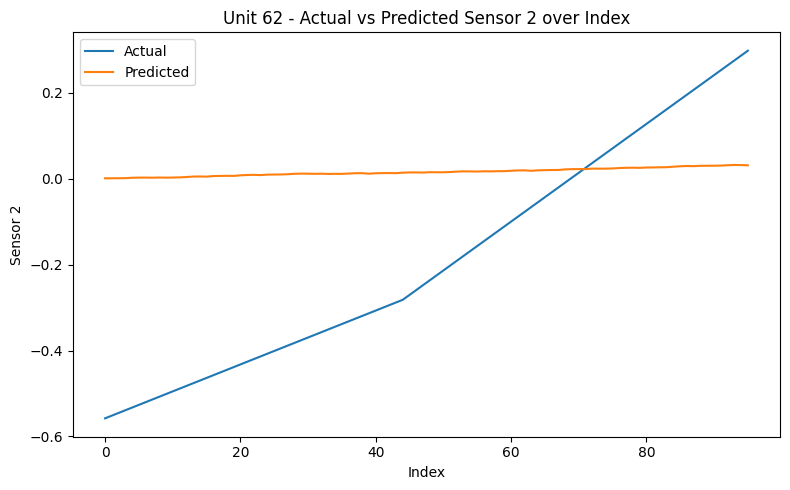

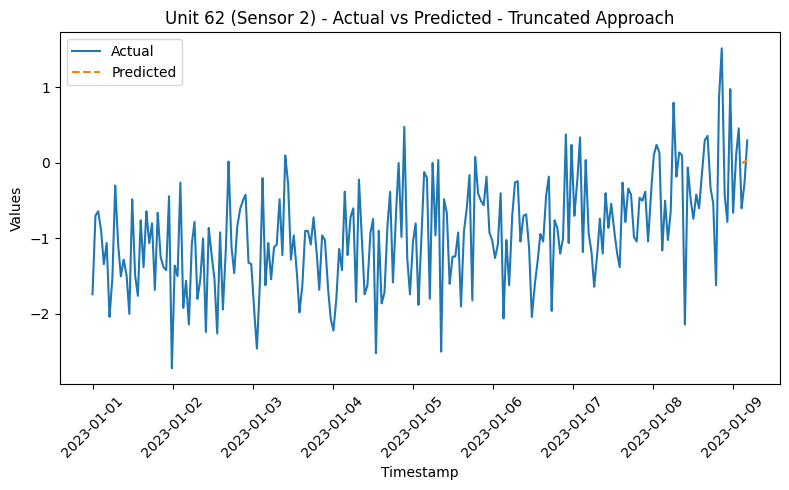

RMSE for Unit 62 - sensor_2: 0.32020556611154244
{'train': [0, 6284], 'valid': [5772, 7070], 'test': [6558, 7854]}
7255
Dataset for unit 63 is good


  0%|          | 0/76 [00:00<?, ?it/s]

96
[0.3702592965028101, 0.35771130961777414, 0.3451633227327382, 0.3326153358477023, 0.3200673489626663, 0.3075193620776304, 0.2949713751925944, 0.28242338830755853, 0.26987540142252253, 0.25732741453748664, 0.24477942765245067, 0.23223144076741473, 0.21968345388237878, 0.20713546699734287, 0.19458748011230692, 0.18203949322727098, 0.16949150634223503, 0.1569435194571991, 0.14439553257216314, 0.1318475456871272, 0.11929955880209125, 0.10675157191705531, 0.09420358503201937, 0.08165559814698342, 0.06910761126194748, 0.05655962437691153, 0.04401163749187559, 0.031463650606839644, 0.0189156637218037, 0.006367676836767755, -0.006180310048268189, -0.018728296933304134, -0.03127628381834008, -0.04382427070337597, -0.05637225758841197, -0.06892024447344786, -0.08146823135848386, -0.09401621824351974, -0.10656420512855574, -0.11911219201359163, -0.13166017889862763, -0.14420816578366352, -0.15675615266869952, -0.1693041395537354, -0.18185212643877144, -0.1555797788982238, -0.1293074313576762, 

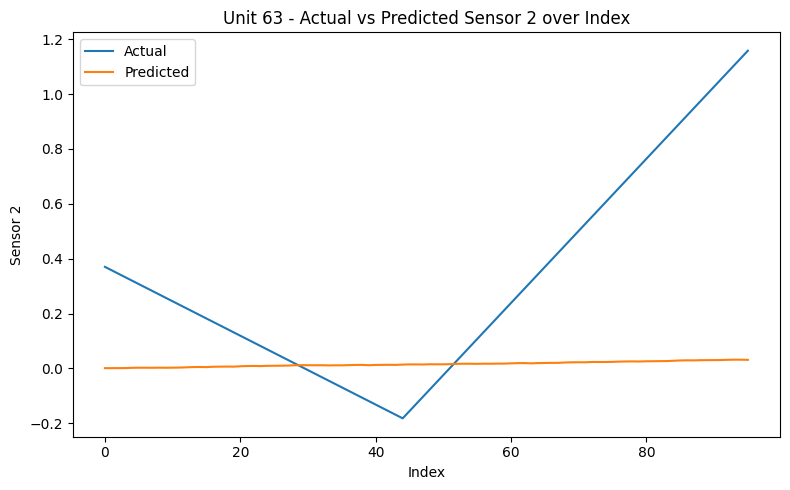

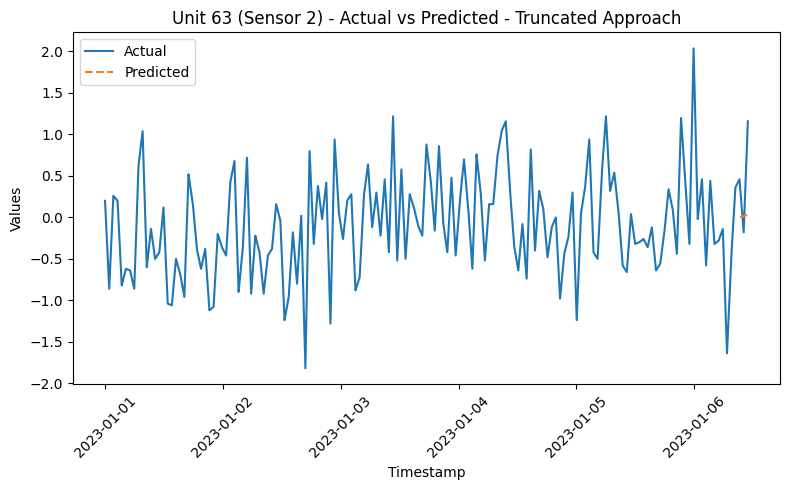

RMSE for Unit 63 - sensor_2: 0.4642065836109178
{'train': [0, 6814], 'valid': [6302, 7666], 'test': [7154, 8517]}
7918
Dataset for unit 64 is good


  0%|          | 0/84 [00:00<?, ?it/s]

96
[1.1654879653421737, 1.169409211243749, 1.1733304571453245, 1.1772517030468999, 1.1811729489484752, 1.1850941948500506, 1.189015440751626, 1.1929366866532014, 1.1968579325547768, 1.2007791784563522, 1.2047004243579276, 1.208621670259503, 1.2125429161610786, 1.216464162062654, 1.2203854079642293, 1.2243066538658047, 1.2282278997673801, 1.2321491456689555, 1.236070391570531, 1.2399916374721063, 1.2439128833736817, 1.247834129275257, 1.2517553751768324, 1.2556766210784078, 1.2595978669799832, 1.2635191128815588, 1.2674403587831342, 1.2713616046847096, 1.275282850586285, 1.2792040964878604, 1.2831253423894358, 1.2870465882910112, 1.2909678341925865, 1.294889080094162, 1.2988103259957373, 1.3027315718973127, 1.306652817798888, 1.3105740637004635, 1.314495309602039, 1.3184165555036145, 1.3223378014051899, 1.3262590473067652, 1.3301802932083406, 1.334101539109916, 1.3380227850114914, 1.324690548946137, 1.3113583128807822, 1.2980260768154277, 1.284693840750073, 1.2713616046847185, 1.2580293

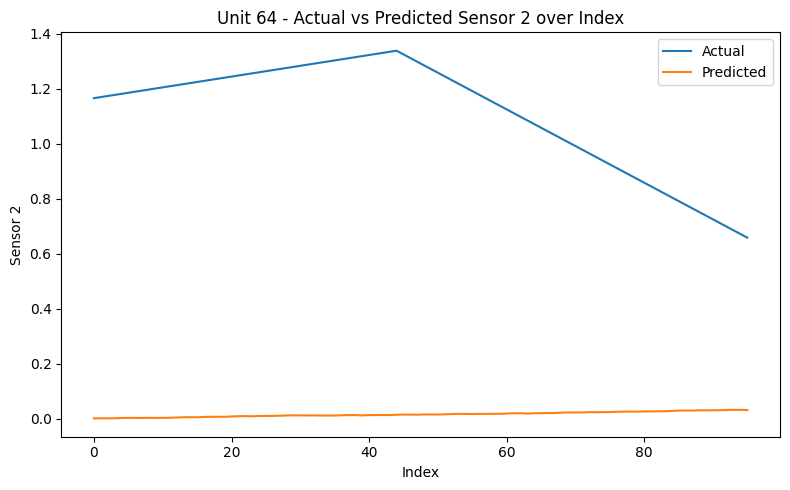

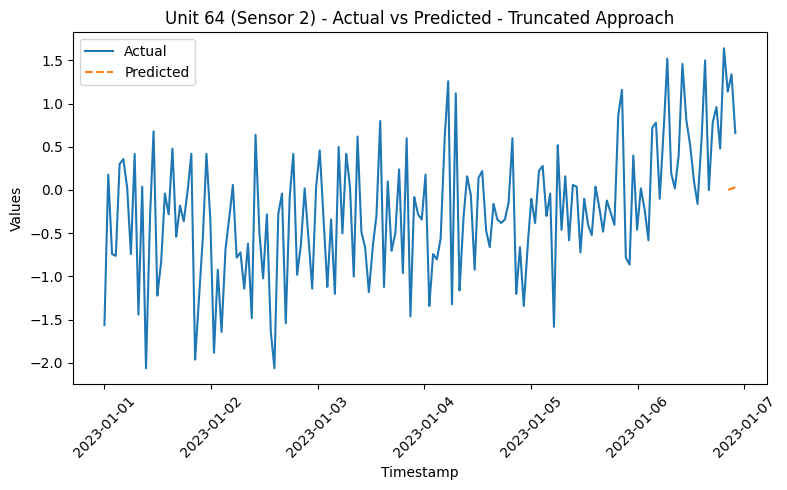

RMSE for Unit 64 - sensor_2: 1.1164739775525387
{'train': [0, 2857], 'valid': [2345, 3214], 'test': [2702, 3570]}
2971
Dataset for unit 65 is good


  0%|          | 0/22 [00:00<?, ?it/s]

96
[-2.3636333460747987, -2.34677198869803, -2.329910631321262, -2.3130492739444932, -2.296187916567725, -2.2793265591909564, -2.262465201814188, -2.2456038444374196, -2.228742487060651, -2.2118811296838827, -2.195019772307114, -2.178158414930346, -2.1612970575535773, -2.144435700176809, -2.1275743428000404, -2.1107129854232722, -2.0938516280465036, -2.076990270669735, -2.0601289132929668, -2.043267555916198, -2.02640619853943, -2.0095448411626613, -1.9926834837858929, -1.9758221264091245, -1.9589607690323558, -1.9420994116555876, -1.925238054278819, -1.9083766969020506, -1.8915153395252822, -1.8746539821485138, -1.8577926247717453, -1.8409312673949767, -1.8240699100182085, -1.8072085526414399, -1.7903471952646715, -1.773485837887903, -1.7566244805111346, -1.7397631231343662, -1.7229017657575976, -1.7060404083808294, -1.6891790510040607, -1.6723176936272923, -1.655456336250524, -1.6385949788737555, -1.621733621496987, -1.6264391165788767, -1.6311446116607662, -1.6358501067426559, -1.64

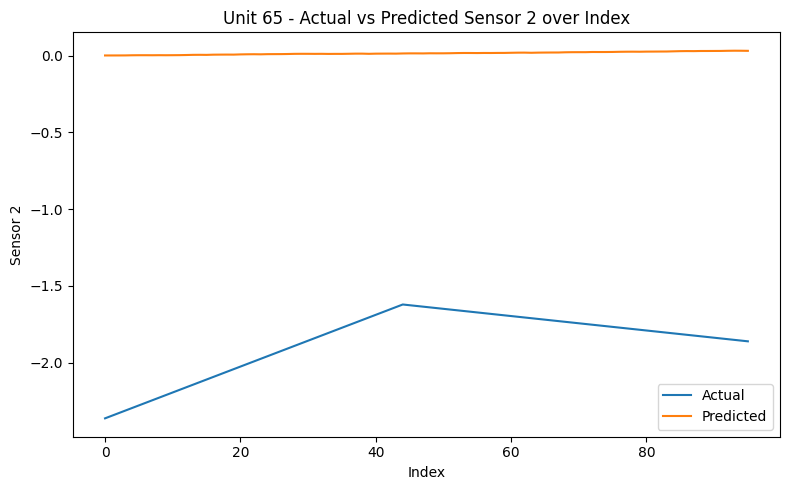

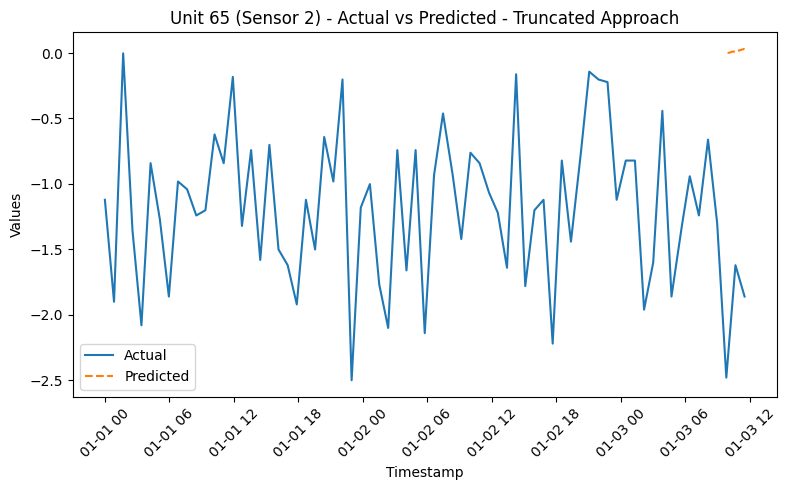

RMSE for Unit 65 - sensor_2: 1.8864697008869218
{'train': [0, 5958], 'valid': [5446, 6702], 'test': [6190, 7446]}
6847
Dataset for unit 66 is good


  0%|          | 0/71 [00:00<?, ?it/s]

96
[2.355193971879779, 2.3348034931915924, 2.314413014503406, 2.2940225358152193, 2.2736320571270325, 2.2532415784388458, 2.232851099750659, 2.212460621062472, 2.1920701423742854, 2.1716796636860987, 2.151289184997912, 2.130898706309725, 2.1105082276215383, 2.0901177489333516, 2.069727270245165, 2.049336791556978, 2.0289463128687917, 2.008555834180605, 1.988165355492418, 1.9677748768042311, 1.9473843981160446, 1.9269939194278578, 1.906603440739671, 1.8862129620514843, 1.8658224833632975, 1.8454320046751107, 1.825041525986924, 1.8046510472987372, 1.7842605686105504, 1.7638700899223636, 1.7434796112341768, 1.7230891325459903, 1.7026986538578035, 1.6823081751696167, 1.66191769648143, 1.6415272177932432, 1.6211367391050566, 1.6007462604168698, 1.580355781728683, 1.5599653030404963, 1.5395748243523095, 1.5191843456641227, 1.498793866975936, 1.4784033882877492, 1.4580129095995624, 1.4552680374684628, 1.4525231653373631, 1.4497782932062635, 1.4470334210751639, 1.4442885489440642, 1.4415436768

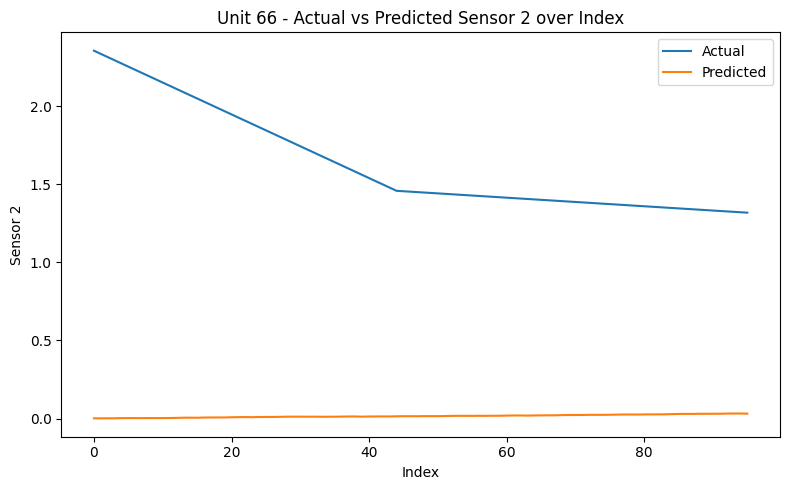

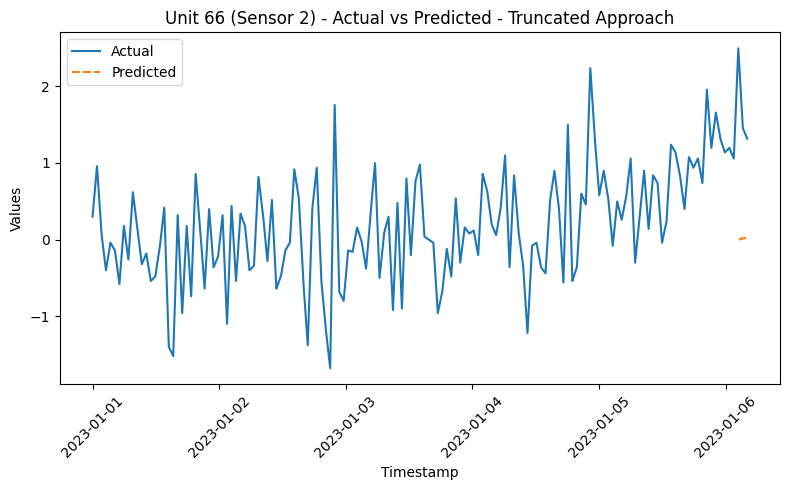

RMSE for Unit 66 - sensor_2: 1.6472413683390736
{'train': [0, 2857], 'valid': [2345, 3214], 'test': [2702, 3570]}
2971
Dataset for unit 67 is good


  0%|          | 0/22 [00:00<?, ?it/s]

96
[-0.8782653985585561, -0.860619792001469, -0.842974185444382, -0.8253285788872948, -0.8076829723302077, -0.7900373657731207, -0.7723917592160335, -0.7547461526589465, -0.7371005461018594, -0.7194549395447722, -0.7018093329876852, -0.6841637264305982, -0.6665181198735111, -0.6488725133164239, -0.6312269067593368, -0.6135813002022498, -0.5959356936451627, -0.5782900870880756, -0.5606444805309885, -0.5429988739739013, -0.5253532674168143, -0.5077076608597273, -0.49006205430264016, -0.472416447745553, -0.454770841188466, -0.43712523463137887, -0.41947962807429173, -0.4018340215172047, -0.3841884149601176, -0.36654280840303055, -0.3488972018459434, -0.3312515952888563, -0.31360598873176926, -0.2959603821746821, -0.2783147756175951, -0.26066916906050797, -0.24302356250342083, -0.2253779559463338, -0.20773234938924667, -0.19008674283215965, -0.17244113627507252, -0.1547955297179855, -0.13714992316089836, -0.11950431660381122, -0.10185871004672414, -0.11126970021050334, -0.12068069037428251

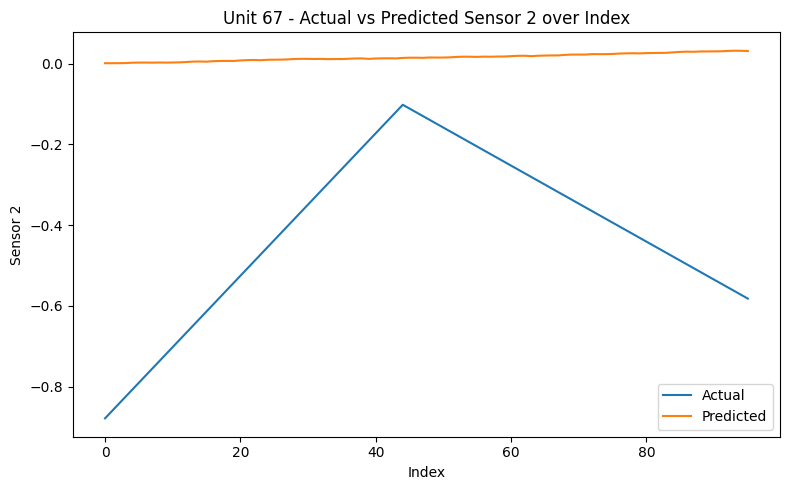

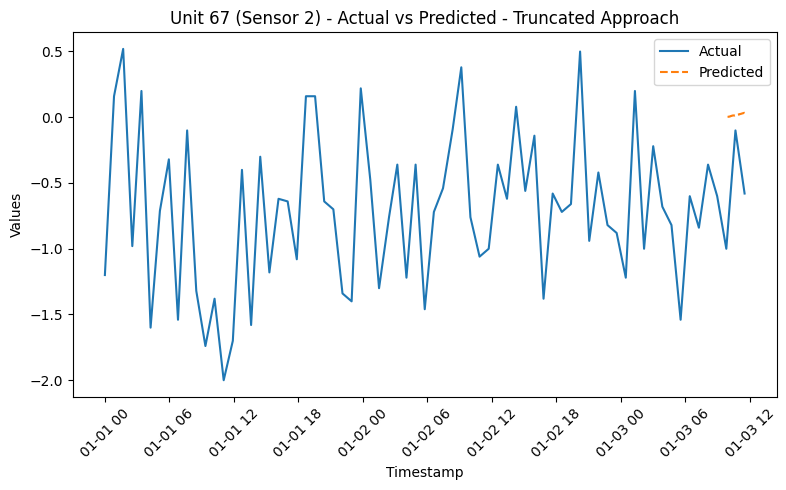

RMSE for Unit 67 - sensor_2: 0.47262094184629905
{'train': [0, 7590], 'valid': [7078, 8538], 'test': [8026, 9486]}
8887
Dataset for unit 68 is good


  0%|          | 0/96 [00:00<?, ?it/s]

96
[2.2442227128653216, 2.2222637358165067, 2.2003047587676914, 2.1783457817188765, 2.156386804670061, 2.134427827621246, 2.112468850572431, 2.0905098735236156, 2.0685508964748007, 2.0465919194259854, 2.0246329423771705, 2.002673965328355, 1.98071498827954, 1.958756011230725, 1.9367970341819098, 1.9148380571330947, 1.8928790800842796, 1.8709201030354645, 1.8489611259866492, 1.8270021489378343, 1.805043171889019, 1.783084194840204, 1.7611252177913888, 1.7391662407425736, 1.7172072636937585, 1.6952482866449434, 1.6732893095961283, 1.6513303325473132, 1.629371355498498, 1.6074123784496828, 1.5854534014008679, 1.5634944243520525, 1.5415354473032377, 1.5195764702544223, 1.4976174932056072, 1.475658516156792, 1.453699539107977, 1.431740562059162, 1.4097815850103468, 1.3878226079615317, 1.3658636309127166, 1.3439046538639015, 1.3219456768150861, 1.299986699766271, 1.278027722717456, 1.2737143522257235, 1.2694009817339909, 1.2650876112422584, 1.260774240750526, 1.2564608702587934, 1.2521474997

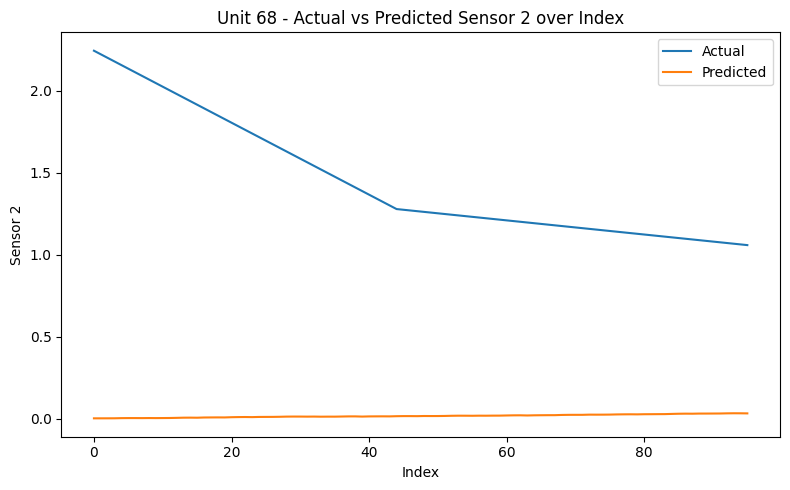

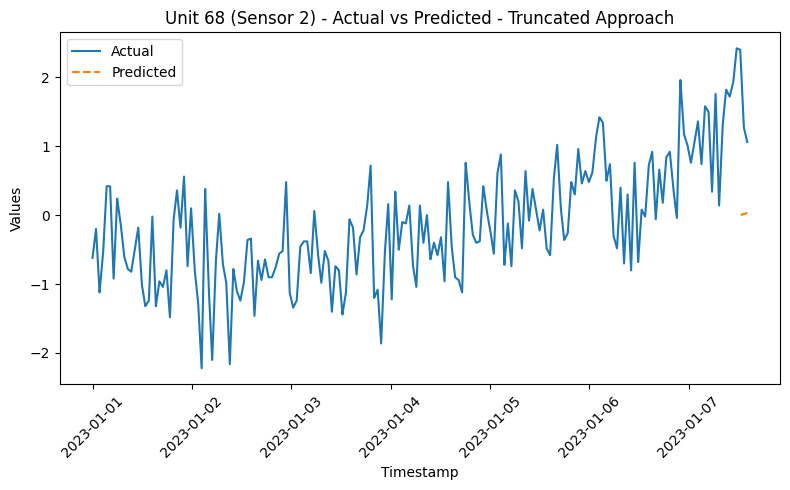

RMSE for Unit 68 - sensor_2: 1.4754803715593594
{'train': [0, 2163], 'valid': [1651, 2434], 'test': [1922, 2703]}
2104
Dataset for unit 69 is good


  0%|          | 0/11 [00:00<?, ?it/s]

96
[-1.8730854837878272, -1.8232856608378318, -1.7734858378878362, -1.7236860149378406, -1.673886191987845, -1.6240863690378493, -1.574286546087854, -1.524486723137858, -1.4746869001878626, -1.424887077237867, -1.3750872542878714, -1.325287431337876, -1.2754876083878801, -1.2256877854378847, -1.175887962487889, -1.1260881395378934, -1.0762883165878978, -1.0264884936379022, -0.9766886706879068, -0.9268888477379111, -0.8770890247879155, -0.8272892018379199, -0.7774893788879242, -0.7276895559379288, -0.6778897329879332, -0.6280899100379376, -0.5782900870879419, -0.5284902641379463, -0.4786904411879509, -0.42889061823795527, -0.37909079528795964, -0.329290972337964, -0.2794911493879684, -0.22969132643797296, -0.1798915034879771, -0.1300916805379817, -0.08029185758798629, -0.03049203463799044, 0.01930778831200497, 0.06910761126200082, 0.11890743421199623, 0.16870725716199209, 0.2185070801119875, 0.2683069030619829, 0.3181067260119789, 0.2973241227336306, 0.2765415194552823, 0.25575891617693

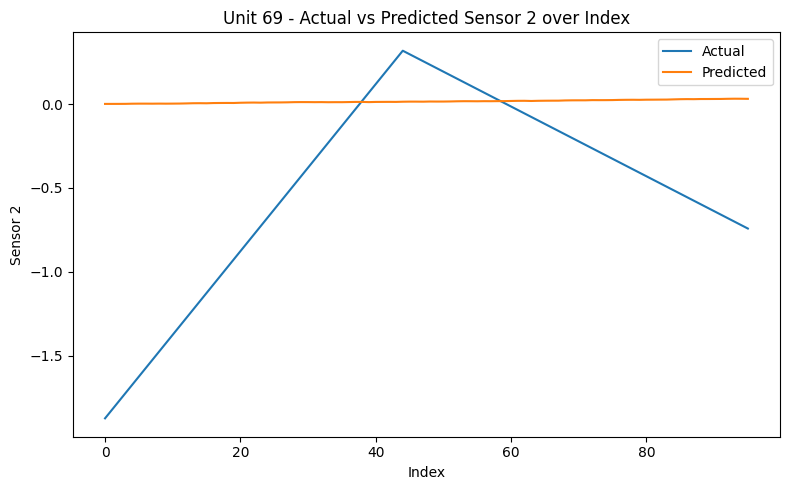

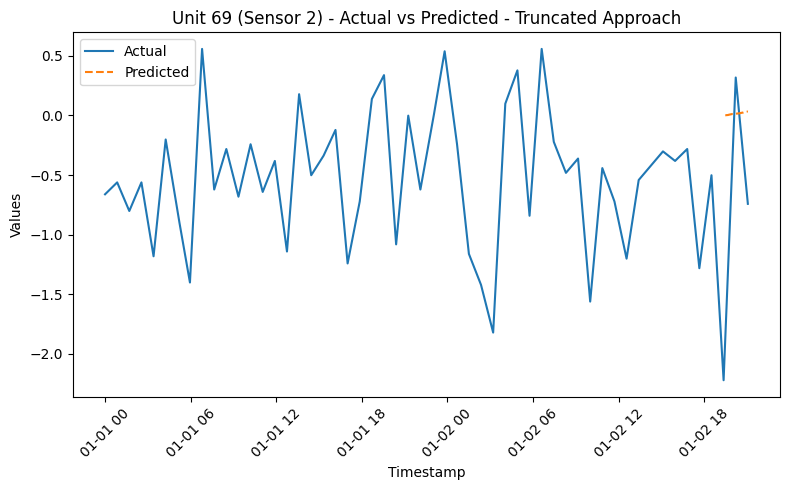

RMSE for Unit 69 - sensor_2: 0.7523684228562745
{'train': [0, 6162], 'valid': [5650, 6932], 'test': [6420, 7701]}
7102
Dataset for unit 70 is good


  0%|          | 0/74 [00:00<?, ?it/s]

96
[1.5685920440239345, 1.5415354473030725, 1.5144788505822109, 1.4874222538613489, 1.460365657140487, 1.4333090604196252, 1.4062524636987634, 1.3791958669779016, 1.3521392702570398, 1.325082673536178, 1.2980260768153162, 1.2709694800944544, 1.2439128833735926, 1.2168562866527308, 1.1897996899318688, 1.1627430932110072, 1.1356864964901452, 1.1086298997692836, 1.0815733030484216, 1.05451670632756, 1.027460109606698, 1.0004035128858362, 0.9733469161649744, 0.9462903194441126, 0.9192337227232508, 0.892177126002389, 0.8651205292815272, 0.8380639325606654, 0.8110073358398036, 0.7839507391189418, 0.75689414239808, 0.7298375456772181, 0.7027809489563563, 0.6757243522354945, 0.6486677555146325, 0.6216111587937707, 0.5945545620729089, 0.5674979653520471, 0.5404413686311853, 0.5133847719103235, 0.4863281751894617, 0.4592715784685999, 0.4322149817477381, 0.4051583850268763, 0.3781017883060144, 0.37182779486349643, 0.36555380142097843, 0.3592798079784605, 0.3530058145359425, 0.34673182109342454, 0

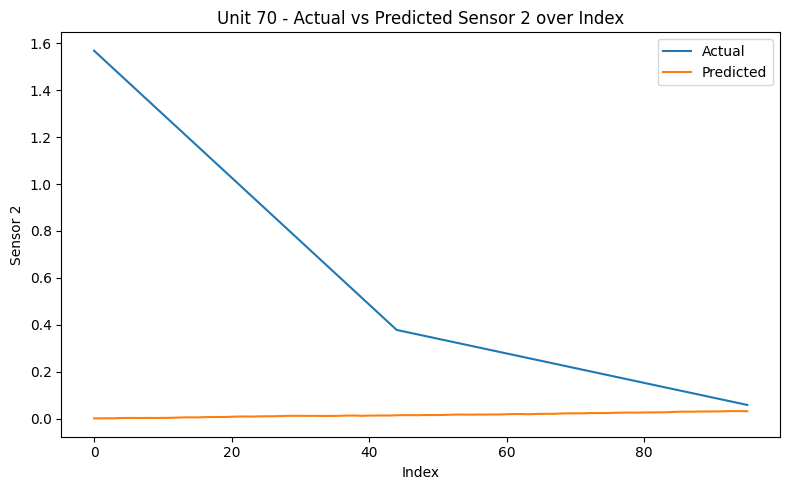

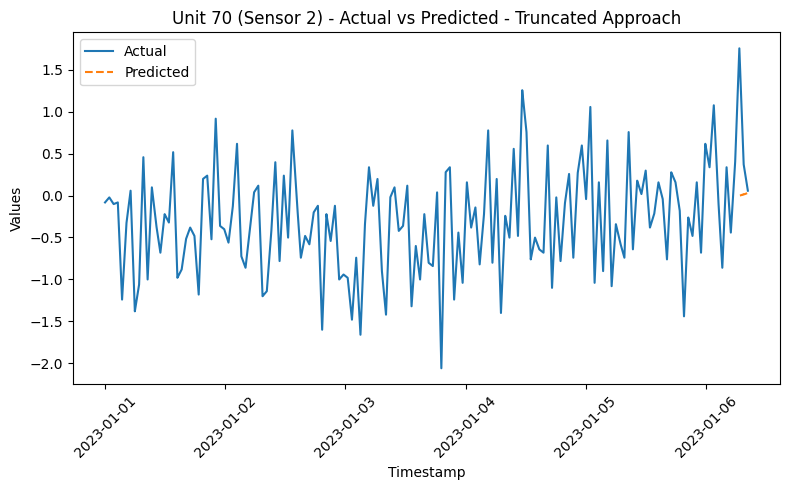

RMSE for Unit 70 - sensor_2: 0.7217634028162685
{'train': [0, 2734], 'valid': [2222, 3076], 'test': [2564, 3417]}
2818
Dataset for unit 71 is good


  0%|          | 0/20 [00:00<?, ?it/s]

96
[-0.5528019887277663, -0.5743688411864288, -0.5959356936450912, -0.6175025461037538, -0.6390693985624163, -0.6606362510210788, -0.6822031034797413, -0.7037699559384037, -0.7253368083970663, -0.7469036608557287, -0.7684705133143912, -0.7900373657730537, -0.8116042182317162, -0.8331710706903788, -0.8547379231490412, -0.8763047756077037, -0.8978716280663661, -0.9194384805250286, -0.9410053329836912, -0.9625721854423537, -0.9841390379010161, -1.0057058903596787, -1.027272742818341, -1.0488395952770038, -1.070406447735666, -1.0919733001943286, -1.113540152652991, -1.1351070051116534, -1.1566738575703162, -1.1782407100289785, -1.1998075624876412, -1.2213744149463035, -1.242941267404966, -1.2645081198636285, -1.2860749723222908, -1.3076418247809536, -1.3292086772396159, -1.3507755296982786, -1.372342382156941, -1.3939092346156035, -1.415476087074266, -1.4370429395329283, -1.458609791991591, -1.4801766444502533, -1.501743496908916, -1.4786081460896252, -1.4554727952703344, -1.43233744445104

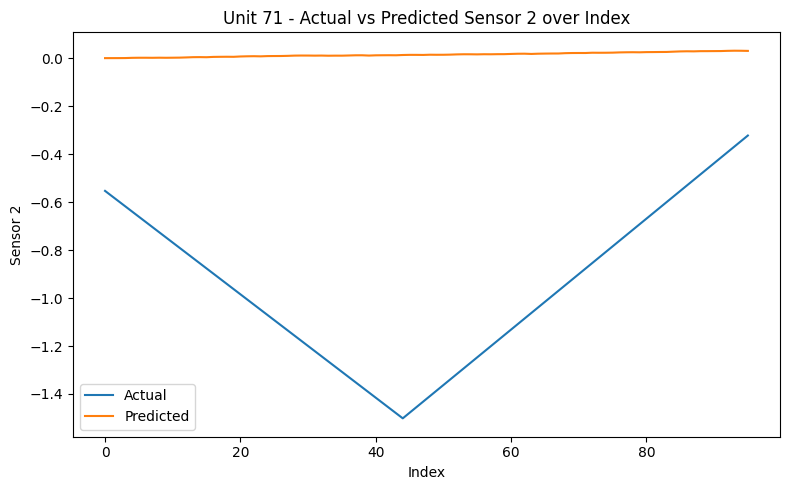

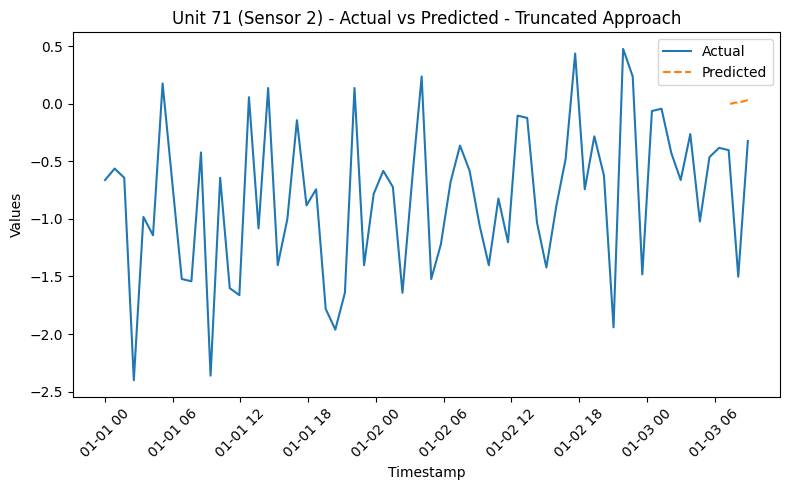

RMSE for Unit 71 - sensor_2: 1.0257712815854343
{'train': [0, 5305], 'valid': [4793, 5968], 'test': [5456, 6630]}
6031
Dataset for unit 72 is good


  0%|          | 0/60 [00:00<?, ?it/s]

96
[-1.0535450903588799, -1.0123720083923493, -0.9711989264258187, -0.9300258444592882, -0.8888527624927575, -0.8476796805262269, -0.8065065985596963, -0.7653335165931656, -0.724160434626635, -0.6829873526601045, -0.6418142706935739, -0.6006411887270433, -0.5594681067605126, -0.518295024793982, -0.47712194282745146, -0.4359488608609208, -0.3947757788943902, -0.3536026969278596, -0.31242961496132904, -0.27125653299479846, -0.23008345102826788, -0.18891036906173708, -0.1477372870952065, -0.10656420512867593, -0.06539112316214535, -0.02421804119561477, 0.016955040770915808, 0.058128122737446386, 0.09930120470397696, 0.14047428667050754, 0.18164736863703834, 0.22282045060356892, 0.2639935325700995, 0.3051666145366301, 0.34633969650316065, 0.38751277846969123, 0.4286858604362218, 0.4698589424027526, 0.5110320243692832, 0.5522051063358138, 0.5933781883023443, 0.6345512702688749, 0.6757243522354055, 0.7168974342019361, 0.7580705161684664, 0.7517965227259484, 0.7455225292834305, 0.739248535840

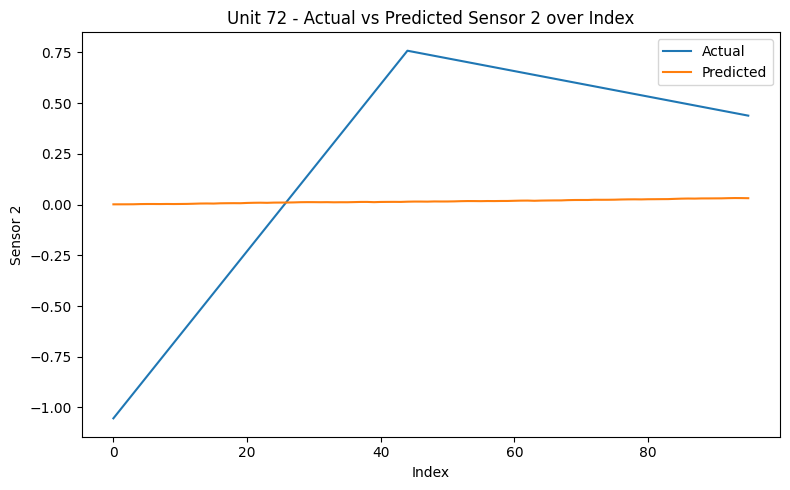

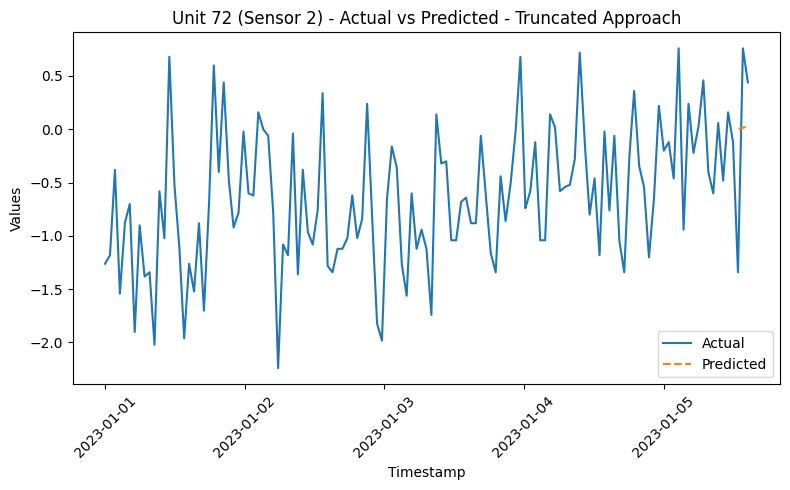

RMSE for Unit 72 - sensor_2: 0.5678170074678508
{'train': [0, 4530], 'valid': [4018, 5096], 'test': [4584, 5661]}
5062
Dataset for unit 73 is good


  0%|          | 0/48 [00:00<?, ?it/s]

96
[0.10871219486790318, 0.0816555981470369, 0.054599001426170635, 0.027542404705304335, 0.00048580798443809137, -0.026570788736428208, -0.05362738545729445, -0.08068398217816075, -0.107740578899027, -0.1347971756198933, -0.1618537723407596, -0.18891036906162584, -0.21596696578249208, -0.24302356250335844, -0.2700801592242247, -0.2971367559450909, -0.32419335266595717, -0.3512499493868235, -0.37830654610768977, -0.405363142828556, -0.43241973954942237, -0.4594763362702886, -0.48653293299115485, -0.5135895297120211, -0.5406461264328875, -0.5677027231537537, -0.5947593198746199, -0.6218159165954863, -0.6488725133163525, -0.6759291100372188, -0.702985706758085, -0.7300423034789513, -0.7570989001998175, -0.784155496920684, -0.8112120936415502, -0.8382686903624165, -0.8653252870832827, -0.892381883804149, -0.9194384805250152, -0.9464950772458814, -0.9735516739667479, -1.0006082706876143, -1.0276648674084803, -1.0547214641293468, -1.081778060850213, -1.0766804411781663, -1.0715828215061196, 

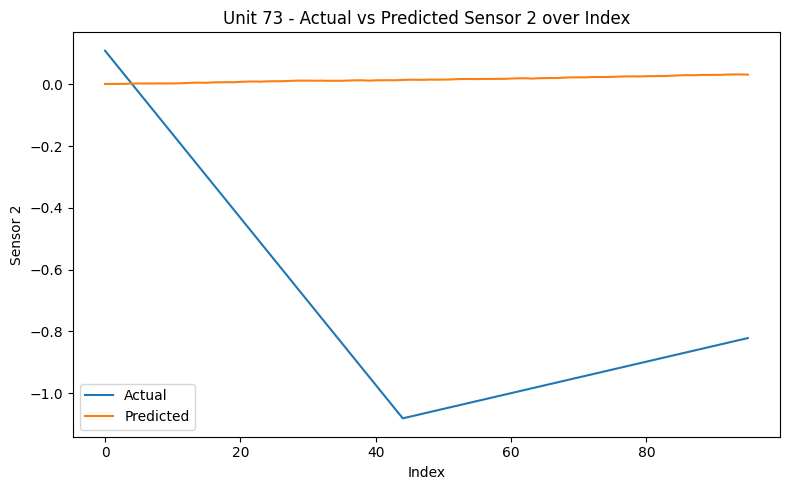

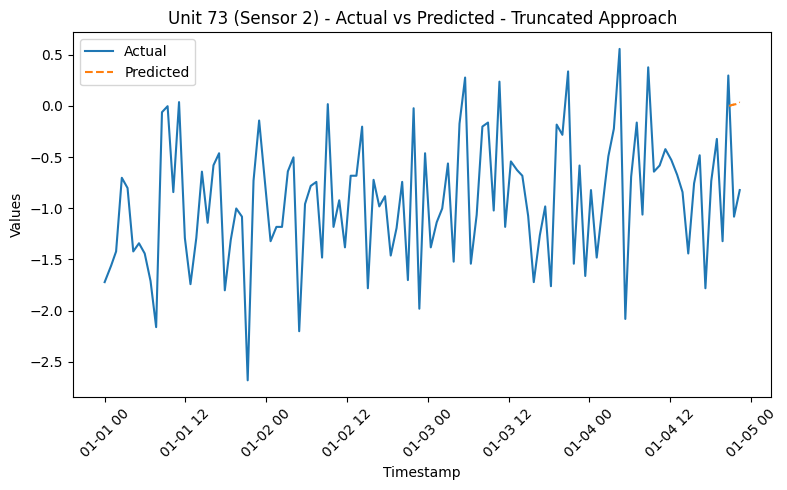

RMSE for Unit 73 - sensor_2: 0.823505515413936
{'train': [0, 5550], 'valid': [5038, 6243], 'test': [5731, 6936]}
6337
Dataset for unit 74 is good


  0%|          | 0/64 [00:00<?, ?it/s]

96
[0.17341275224387726, 0.18988198503048861, 0.20635121781709997, 0.2228204506037113, 0.23928968339032267, 0.255758916176934, 0.27222814896354536, 0.2886973817501567, 0.3051666145367681, 0.3216358473233794, 0.33810508010999074, 0.35457431289660213, 0.37104354568321346, 0.3875127784698248, 0.4039820112564362, 0.4204512440430475, 0.43692047682965884, 0.45338970961627023, 0.46985894240288156, 0.4863281751894929, 0.5027974079761042, 0.5192666407627156, 0.535735873549327, 0.5522051063359383, 0.5686743391225496, 0.585143571909161, 0.6016128046957724, 0.6180820374823837, 0.634551270268995, 0.6510205030556064, 0.6674897358422177, 0.6839589686288291, 0.7004282014154405, 0.7168974342020518, 0.7333666669886632, 0.7498358997752745, 0.7663051325618858, 0.7827743653484972, 0.7992435981351086, 0.8157128309217199, 0.8321820637083313, 0.8486512964949426, 0.8651205292815539, 0.8815897620681653, 0.8980589948547766, 0.8776685161665898, 0.857278037478403, 0.8368875587902164, 0.8164970801020296, 0.79610660

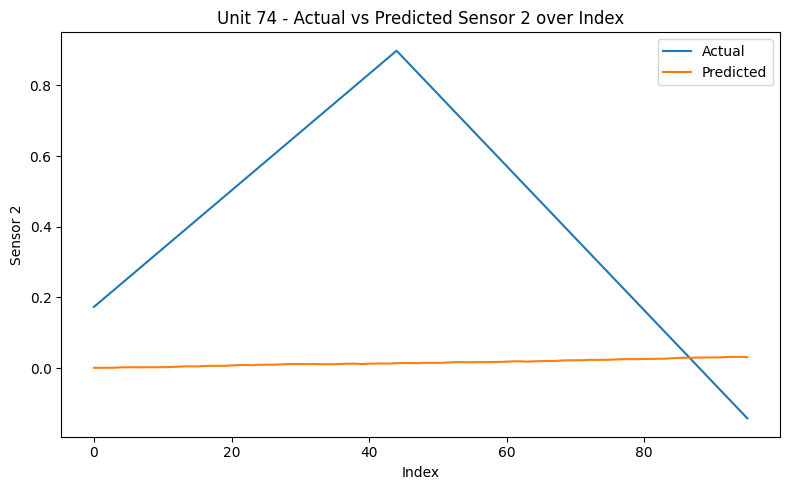

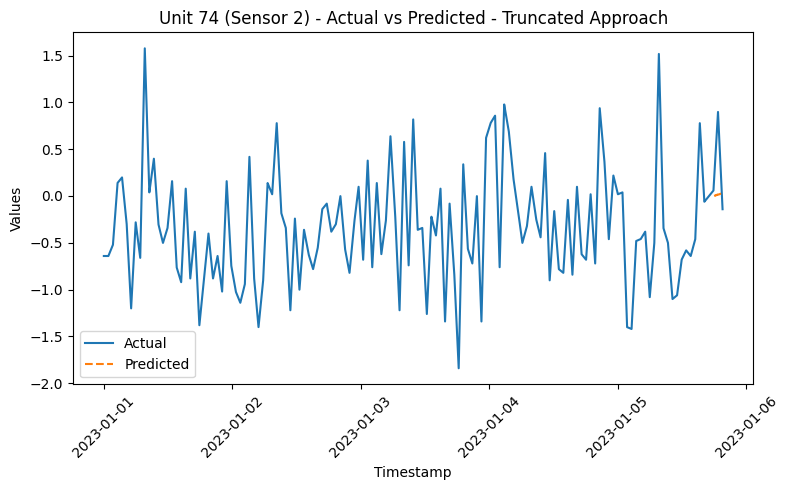

RMSE for Unit 74 - sensor_2: 0.5140064690510084
{'train': [0, 3550], 'valid': [3038, 3994], 'test': [3482, 4437]}
3838
Dataset for unit 75 is good


  0%|          | 0/33 [00:00<?, ?it/s]

96
[-0.41242138545136153, -0.44535985102458864, -0.47829831659781585, -0.511236782171043, -0.5441752477442702, -0.5771137133174973, -0.6100521788907244, -0.6429906444639516, -0.6759291100371787, -0.7088675756104059, -0.741806041183633, -0.7747445067568602, -0.8076829723300873, -0.8406214379033146, -0.8735599034765417, -0.9064983690497689, -0.939436834622996, -0.9723753001962231, -1.0053137657694502, -1.0382522313426774, -1.0711906969159046, -1.1041291624891316, -1.1370676280623588, -1.170006093635586, -1.202944559208813, -1.2358830247820403, -1.2688214903552675, -1.3017599559284945, -1.3346984215017217, -1.367636887074949, -1.4005753526481761, -1.4335138182214031, -1.4664522837946303, -1.4993907493678575, -1.5323292149410845, -1.5652676805143118, -1.598206146087539, -1.6311446116607662, -1.6640830772339932, -1.6970215428072204, -1.7299600083804476, -1.7628984739536746, -1.7958369395269018, -1.828775405100129, -1.8617138706733563, -1.8468131362473732, -1.8319124018213904, -1.81701166739

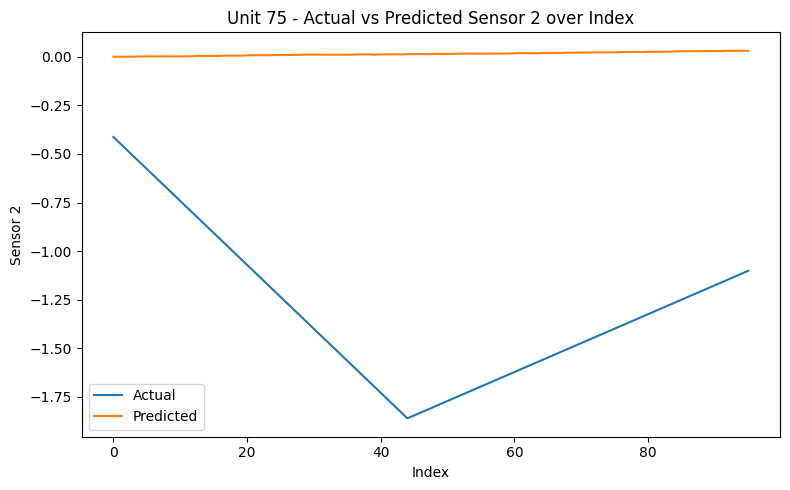

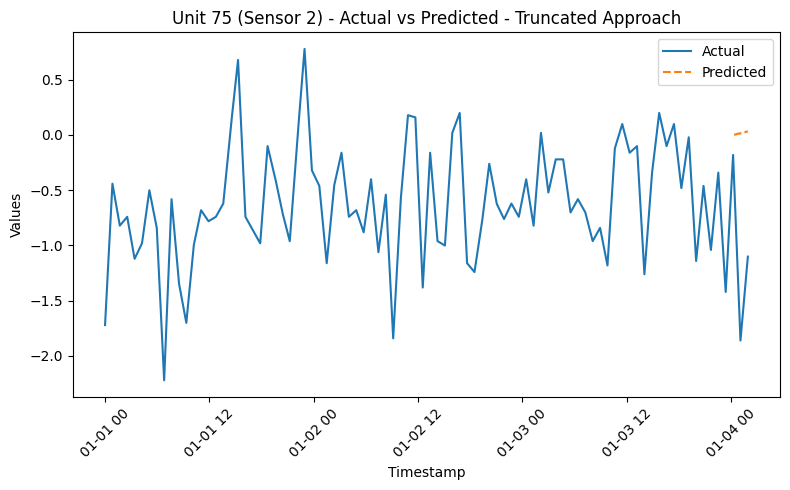

RMSE for Unit 75 - sensor_2: 1.3844135684045051
{'train': [0, 8324], 'valid': [7812, 9364], 'test': [8852, 10404]}
9805
Dataset for unit 76 is good


  0%|          | 0/108 [00:00<?, ?it/s]

96
[1.3921359784531304, 1.4227216964854106, 1.4533074145176905, 1.4838931325499707, 1.5144788505822508, 1.545064568614531, 1.5756502866468112, 1.6062360046790913, 1.6368217227113715, 1.6674074407436517, 1.6979931587759318, 1.7285788768082118, 1.759164594840492, 1.789750312872772, 1.820336030905052, 1.8509217489373322, 1.8815074669696124, 1.9120931850018925, 1.9426789030341727, 1.9732646210664528, 2.003850339098733, 2.034436057131013, 2.0650217751632933, 2.0956074931955735, 2.1261932112278537, 2.156778929260134, 2.187364647292414, 2.217950365324694, 2.2485360833569743, 2.279121801389254, 2.309707519421534, 2.3402932374538143, 2.3708789554860945, 2.4014646735183747, 2.432050391550655, 2.4626361095829346, 2.4932218276152147, 2.523807545647495, 2.554393263679775, 2.584978981712055, 2.6155646997443354, 2.6461504177766155, 2.6767361358088957, 2.707321853841176, 2.737907571873456, 2.702224234169129, 2.6665408964648023, 2.6308575587604754, 2.5951742210561486, 2.559490883351822, 2.5238075456474

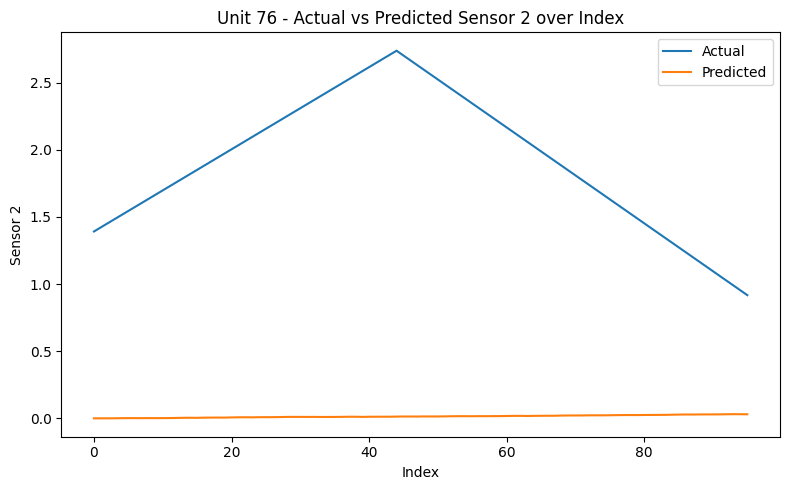

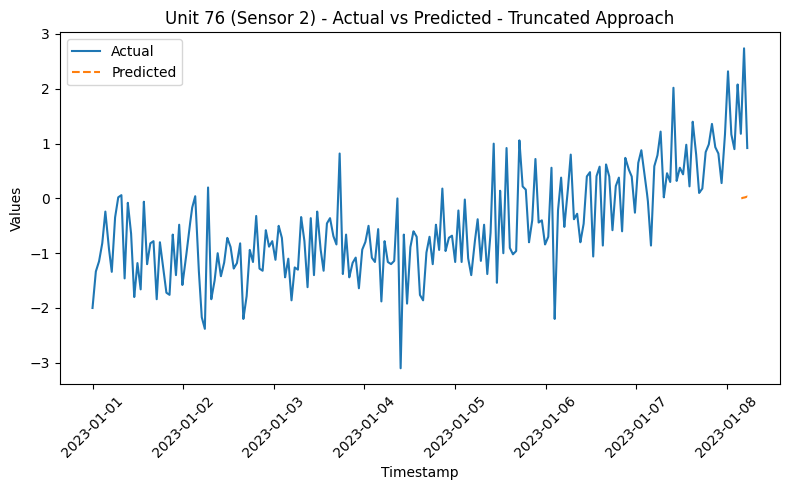

RMSE for Unit 76 - sensor_2: 1.975664489803183
{'train': [0, 6570], 'valid': [6058, 7391], 'test': [6879, 8211]}
7612
Dataset for unit 77 is good


  0%|          | 0/80 [00:00<?, ?it/s]

96
[1.350962896486582, 1.335670037470442, 1.320377178454302, 1.3050843194381618, 1.2897914604220218, 1.2744986014058817, 1.2592057423897416, 1.2439128833736015, 1.2286200243574614, 1.2133271653413213, 1.1980343063251813, 1.1827414473090414, 1.1674485882929013, 1.1521557292767612, 1.1368628702606212, 1.121570011244481, 1.106277152228341, 1.090984293212201, 1.0756914341960608, 1.0603985751799208, 1.0451057161637807, 1.0298128571476406, 1.0145199981315005, 0.9992271391153604, 0.9839342800992205, 0.9686414210830804, 0.9533485620669403, 0.9380557030508002, 0.9227628440346601, 0.9074699850185202, 0.8921771260023801, 0.87688426698624, 0.8615914079700999, 0.8462985489539598, 0.8310056899378198, 0.8157128309216798, 0.8004199719055397, 0.7851271128893996, 0.7698342538732595, 0.7545413948571195, 0.7392485358409794, 0.7239556768248394, 0.7086628178086993, 0.6933699587925592, 0.6780770997764192, 0.6690582342027971, 0.660039368629175, 0.6510205030555529, 0.6420016374819308, 0.6329827719083088, 0.623

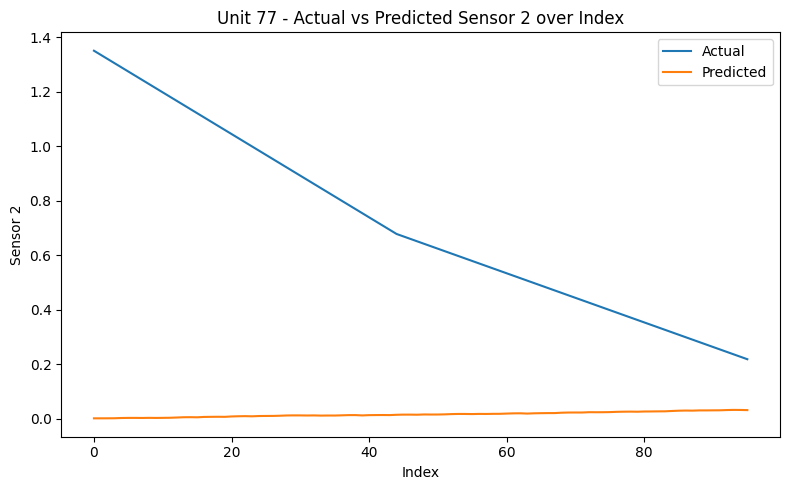

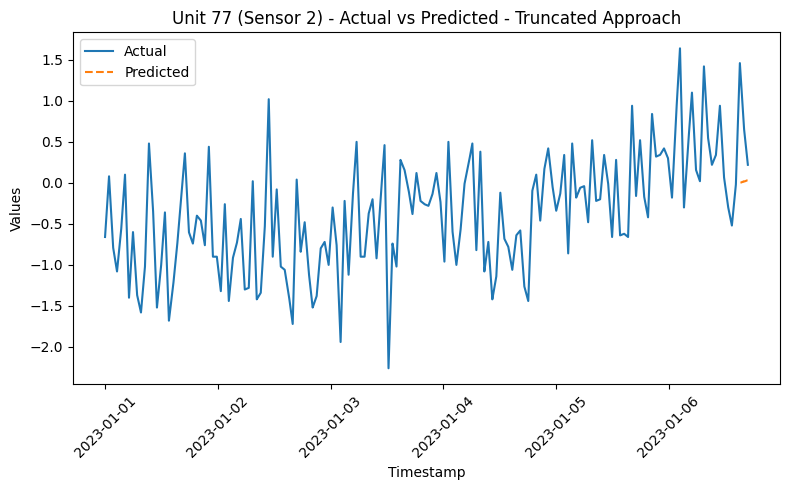

RMSE for Unit 77 - sensor_2: 0.7736794075602378
{'train': [0, 2898], 'valid': [2386, 3260], 'test': [2748, 3621]}
3022
Dataset for unit 78 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[-0.5771137133174751, -0.5935829461040908, -0.6100521788907066, -0.6265214116773224, -0.6429906444639382, -0.659459877250554, -0.6759291100371698, -0.6923983428237857, -0.7088675756104015, -0.7253368083970173, -0.7418060411836331, -0.7582752739702489, -0.7747445067568647, -0.7912137395434804, -0.8076829723300962, -0.824152205116712, -0.8406214379033279, -0.8570906706899437, -0.8735599034765595, -0.8900291362631754, -0.9064983690497911, -0.9229676018364069, -0.9394368346230226, -0.9559060674096385, -0.9723753001962543, -0.9888445329828701, -1.005313765769486, -1.0217829985561018, -1.0382522313427174, -1.0547214641293334, -1.071190696915949, -1.087659929702565, -1.1041291624891807, -1.1205983952757965, -1.1370676280624123, -1.1535368608490282, -1.170006093635644, -1.1864753264222596, -1.2029445592088757, -1.2194137919954913, -1.2358830247821073, -1.252352257568723, -1.2688214903553388, -1.2852907231419546, -1.3017599559285704, -1.3115630706825068, -1.321366185436443, -1.33116930019037

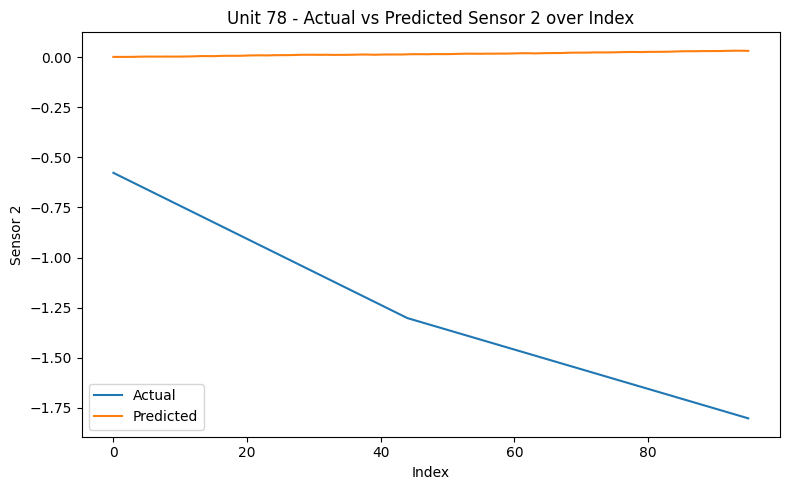

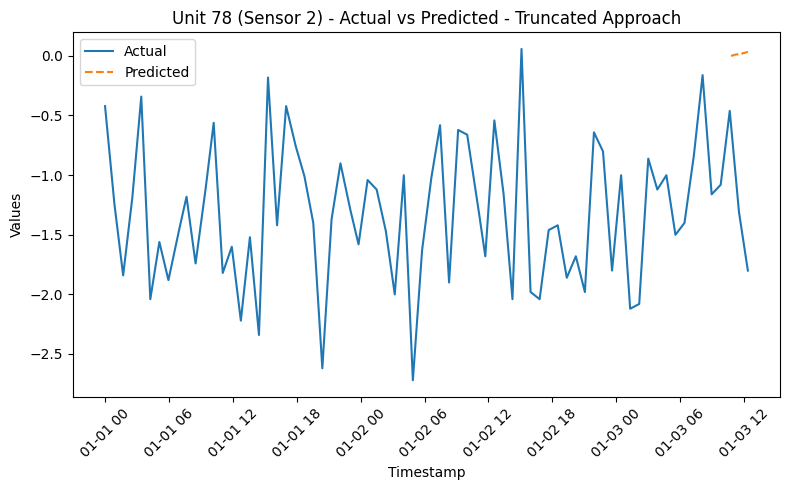

RMSE for Unit 78 - sensor_2: 1.3340955497878677
{'train': [0, 4081], 'valid': [3569, 4591], 'test': [4079, 5100]}
4501
Dataset for unit 79 is good


  0%|          | 0/41 [00:00<?, ?it/s]

96
[-0.5175107756136055, -0.5026100411876225, -0.4877093067616396, -0.47280857233565665, -0.45790783790967365, -0.44300710348369066, -0.4281063690577077, -0.41320563463172477, -0.3983049002057418, -0.3834041657797588, -0.36850343135377583, -0.3536026969277929, -0.3387019625018099, -0.32380122807582695, -0.30890049364984395, -0.293999759223861, -0.279099024797878, -0.2641982903718951, -0.24929755594591207, -0.23439682151992913, -0.21949608709394614, -0.2045953526679632, -0.1896946182419802, -0.17479388381599725, -0.15989314939001426, -0.1449924149640313, -0.13009168053804837, -0.11519094611206537, -0.10029021168608243, -0.08538947726009949, -0.07048874283411644, -0.055588008408133494, -0.04068727398215055, -0.02578653955616761, -0.010885805130184556, 0.004014929295798386, 0.01891566372178133, 0.03381639814776427, 0.048717132573747324, 0.06361786699973027, 0.07851860142571321, 0.09341933585169615, 0.10832007027767909, 0.12322080470366215, 0.13812153912964512, 0.1255735522446047, 0.113025

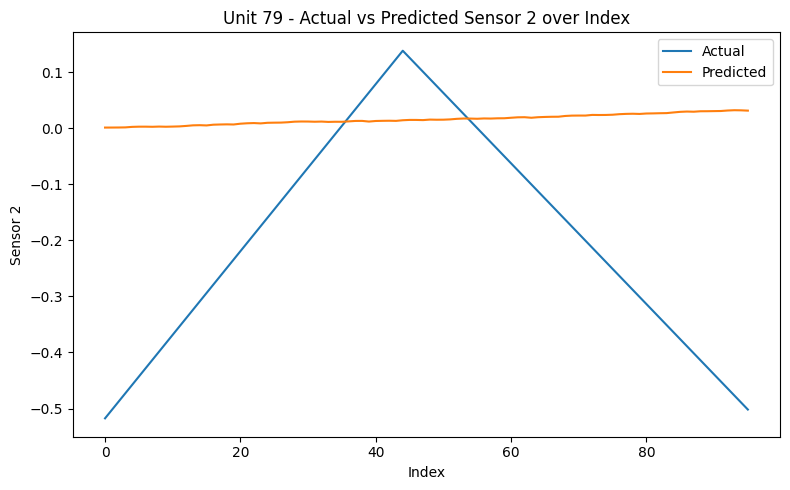

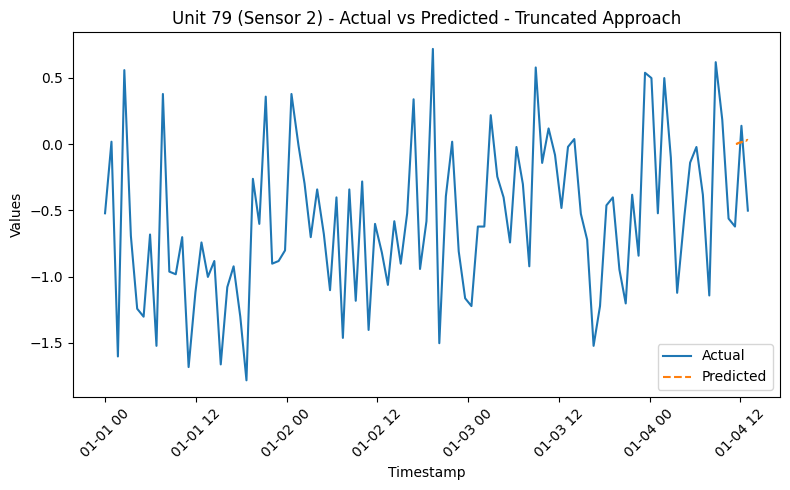

RMSE for Unit 79 - sensor_2: 0.2791370862729155
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 80 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[-0.5014336674171959, -0.4928069264337309, -0.4841801854502659, -0.4755534444668009, -0.4669267034833359, -0.4582999624998709, -0.4496732215164059, -0.44104648053294093, -0.4324197395494759, -0.42379299856601094, -0.4151662575825459, -0.40653951659908094, -0.3979127756156159, -0.38928603463215095, -0.3806592936486859, -0.37203255266522095, -0.3634058116817559, -0.3547790706982909, -0.3461523297148259, -0.3375255887313609, -0.3288988477478959, -0.3202721067644309, -0.3116453657809659, -0.3030186247975009, -0.2943918838140359, -0.2857651428305709, -0.2771384018471059, -0.2685116608636409, -0.2598849198801759, -0.2512581788967109, -0.24263143791324593, -0.23400469692978093, -0.22537795594631593, -0.21675121496285094, -0.20812447397938594, -0.19949773299592094, -0.19087099201245594, -0.18224425102899094, -0.17361751004552595, -0.16499076906206095, -0.15636402807859595, -0.1477372870951309, -0.1391105461116659, -0.1304838051282009, -0.12185706414473596, -0.12107281496442177, -0.120288565

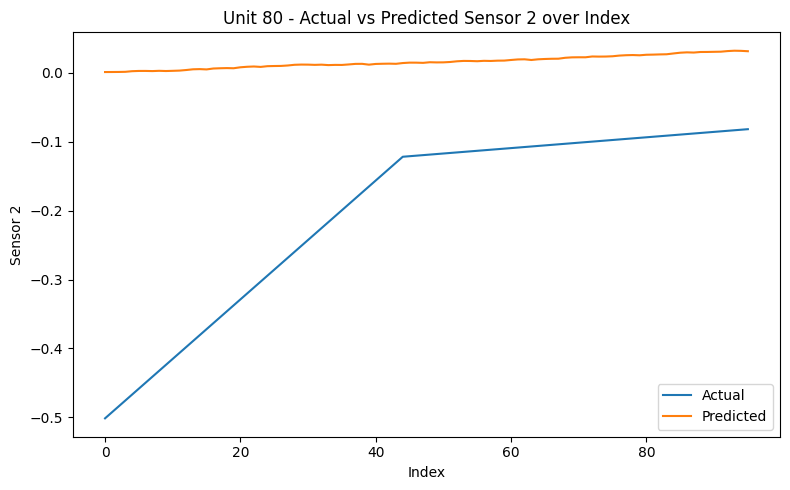

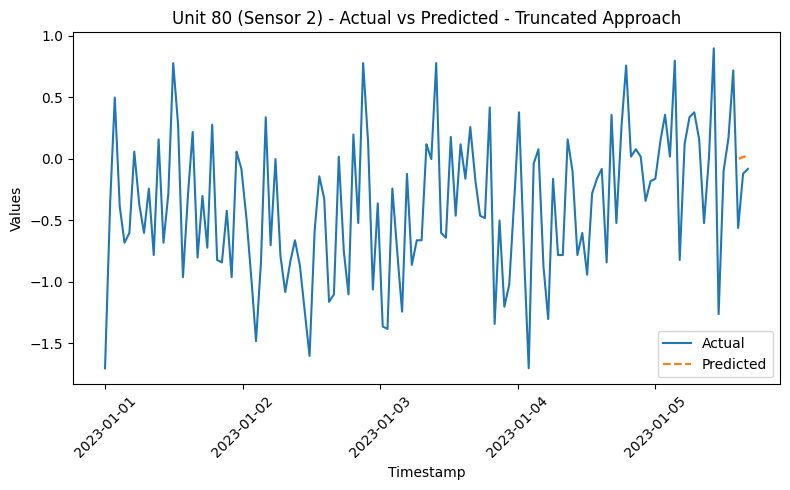

RMSE for Unit 80 - sensor_2: 0.24801093015421055
{'train': [0, 8650], 'valid': [8138, 9732], 'test': [9220, 10812]}
10213
Dataset for unit 81 is good


  0%|          | 0/113 [00:00<?, ?it/s]

96
[1.5650629227126454, 1.560357427630756, 1.5556519325488662, 1.5509464374669766, 1.5462409423850871, 1.5415354473031975, 1.5368299522213078, 1.5321244571394184, 1.5274189620575287, 1.522713466975639, 1.5180079718937496, 1.51330247681186, 1.5085969817299703, 1.5038914866480808, 1.4991859915661911, 1.4944804964843015, 1.489775001402412, 1.4850695063205224, 1.4803640112386327, 1.4756585161567433, 1.4709530210748536, 1.466247525992964, 1.4615420309110745, 1.4568365358291848, 1.4521310407472952, 1.4474255456654057, 1.442720050583516, 1.4380145555016264, 1.433309060419737, 1.4286035653378473, 1.4238980702559576, 1.4191925751740682, 1.4144870800921785, 1.4097815850102888, 1.4050760899283994, 1.4003705948465097, 1.39566509976462, 1.3909596046827306, 1.386254109600841, 1.3815486145189513, 1.3768431194370618, 1.3721376243551722, 1.3674321292732825, 1.362726634191393, 1.3580211391095034, 1.36311875878155, 1.3682163784535968, 1.3733139981256435, 1.3784116177976902, 1.3835092374697369, 1.38860685

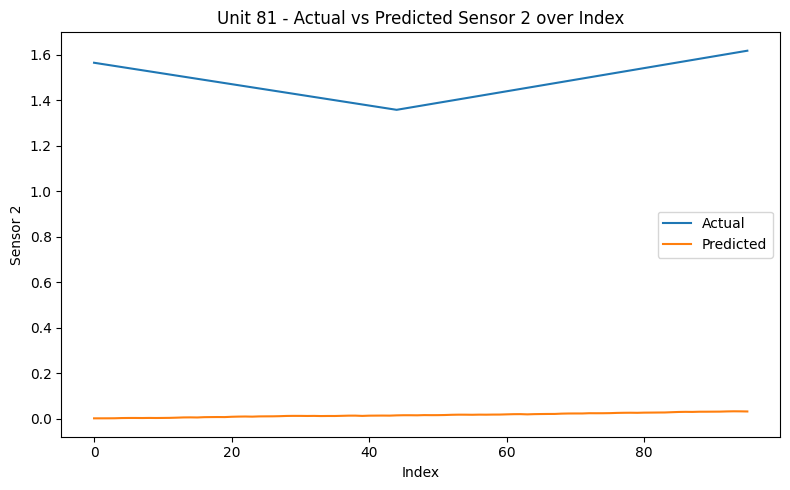

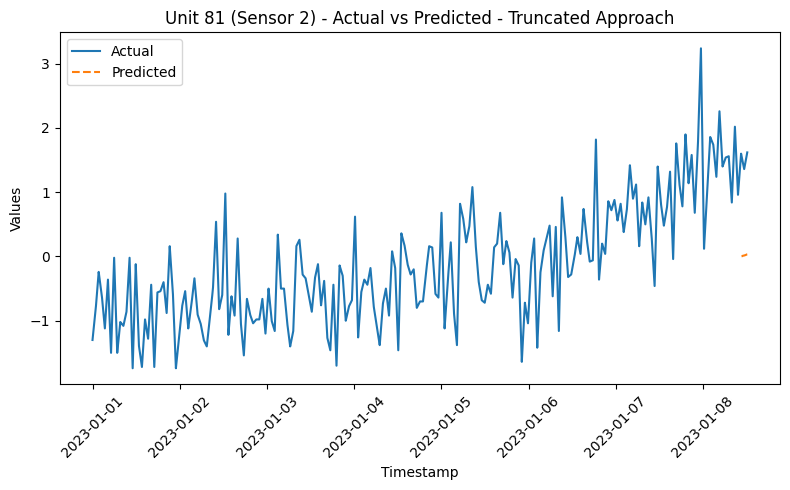

RMSE for Unit 81 - sensor_2: 1.4628360228219892
{'train': [0, 6570], 'valid': [6058, 7391], 'test': [6879, 8211]}
7612
Dataset for unit 82 is good


  0%|          | 0/80 [00:00<?, ?it/s]

96
[1.8207281554952048, 1.8011219259873323, 1.7815156964794596, 1.7619094669715871, 1.7423032374637146, 1.722697007955842, 1.7030907784479694, 1.683484548940097, 1.6638783194322242, 1.6442720899243517, 1.6246658604164792, 1.6050596309086067, 1.585453401400734, 1.5658471718928615, 1.546240942384989, 1.5266347128771165, 1.5070284833692438, 1.4874222538613713, 1.4678160243534988, 1.448209794845626, 1.4286035653377536, 1.408997335829881, 1.3893911063220084, 1.3697848768141359, 1.3501786473062634, 1.3305724177983906, 1.3109661882905181, 1.2913599587826456, 1.271753729274773, 1.2521474997669007, 1.232541270259028, 1.2129350407511552, 1.193328811243283, 1.1737225817354102, 1.1541163522275377, 1.1345101227196652, 1.1149038932117925, 1.09529766370392, 1.0756914341960475, 1.0560852046881748, 1.0364789751803023, 1.0168727456724298, 0.9972665161645572, 0.9776602866566846, 0.9580540571488121, 0.9741311653452708, 0.9902082735417295, 1.0062853817381883, 1.0223624899346468, 1.0384395981311056, 1.05451

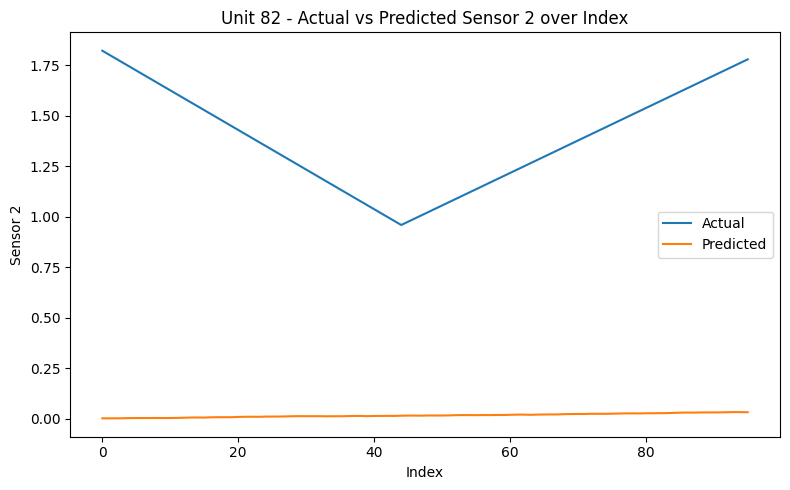

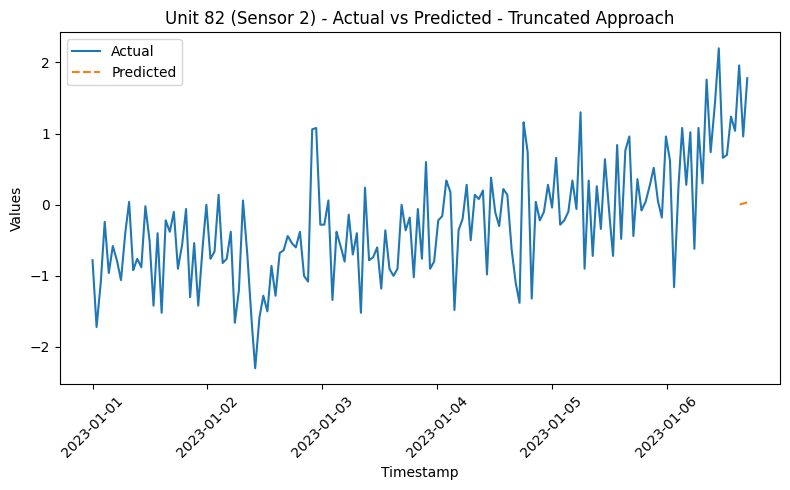

RMSE for Unit 82 - sensor_2: 1.3883767149926507
{'train': [0, 2938], 'valid': [2426, 3306], 'test': [2794, 3672]}
3073
Dataset for unit 83 is good


  0%|          | 0/23 [00:00<?, ?it/s]

96
[-0.4782983165978649, -0.4606527100407778, -0.44300710348369077, -0.42536149692660363, -0.40771589036951655, -0.3900702838124295, -0.37242467725534234, -0.3547790706982553, -0.3371334641411682, -0.3194878575840811, -0.301842251026994, -0.28419664446990694, -0.2665510379128198, -0.24890543135573273, -0.23125982479864565, -0.21361421824155857, -0.1959686116844715, -0.17832300512738442, -0.16067739857029728, -0.1430317920132102, -0.12538618545612312, -0.10774057889903604, -0.09009497234194896, -0.07244936578486183, -0.054803759227774806, -0.03715815267068767, -0.019512546113600537, -0.0018669395565135138, 0.01577866700057362, 0.033424273557660644, 0.05106988011474778, 0.06871548667183491, 0.08636109322892194, 0.10400669978600907, 0.1216523063430961, 0.13929791290018323, 0.15694351945727036, 0.1745891260143574, 0.19223473257144452, 0.20988033912853155, 0.22752594568561868, 0.2451715522427057, 0.26281715879979284, 0.28046276535688, 0.2981083719139671, 0.29732412273364844, 0.2965398735533

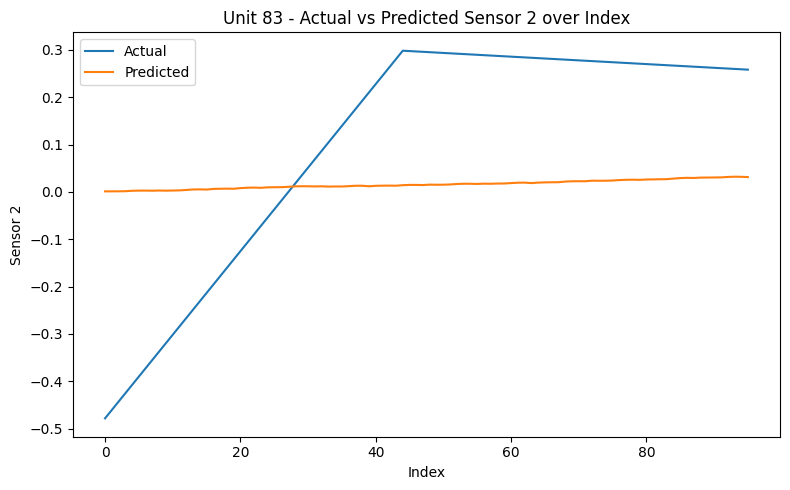

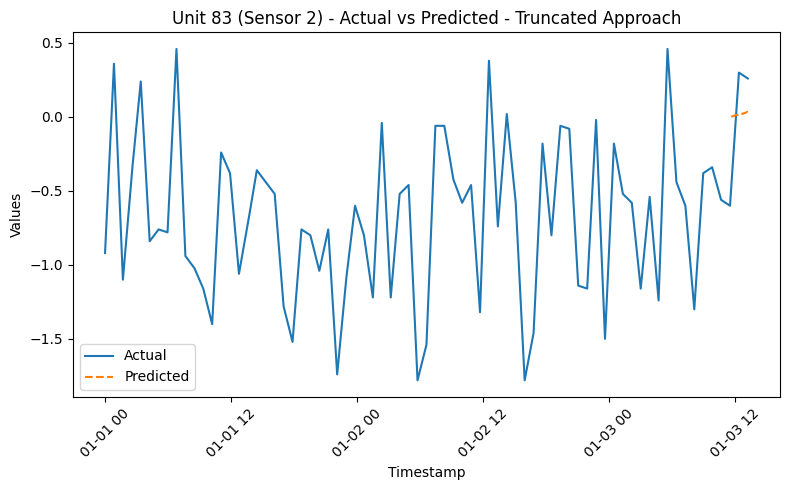

RMSE for Unit 83 - sensor_2: 0.2509221615565252
{'train': [0, 6978], 'valid': [6466, 7850], 'test': [7338, 8721]}
8122
Dataset for unit 84 is good


  0%|          | 0/87 [00:00<?, ?it/s]

96
[0.25144554568521044, 0.2447794276525309, 0.2381133096198514, 0.23144719158717186, 0.22478107355449234, 0.21811495552181281, 0.2114488374891333, 0.20478271945645377, 0.19811660142377424, 0.19145048339109472, 0.1847843653584152, 0.17811824732573567, 0.17145212929305612, 0.1647860112603766, 0.15811989322769707, 0.15145377519501754, 0.14478765716233802, 0.1381215391296585, 0.13145542109697897, 0.12478930306429944, 0.11812318503161992, 0.1114570669989404, 0.10479094896626087, 0.09812483093358135, 0.09145871290090182, 0.0847925948682223, 0.07812647683554277, 0.07146035880286325, 0.06479424077018373, 0.0581281227375042, 0.051462004704824676, 0.044795886672145124, 0.0381297686394656, 0.031463650606786076, 0.02479753257410655, 0.018131414541427027, 0.011465296508747502, 0.004799178476067978, -0.0018669395566115465, -0.008533057589291071, -0.015199175621970595, -0.02186529365465012, -0.028531411687329644, -0.03519752972000917, -0.041863647752688665, -0.013238552671194014, 0.01538654241030063

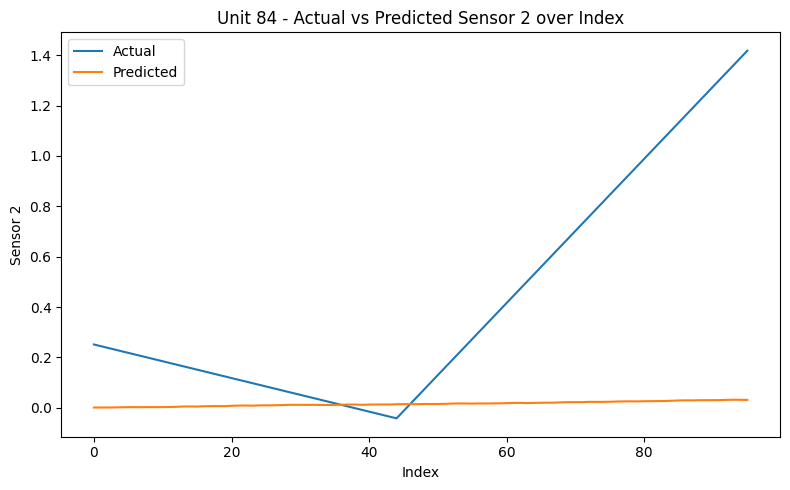

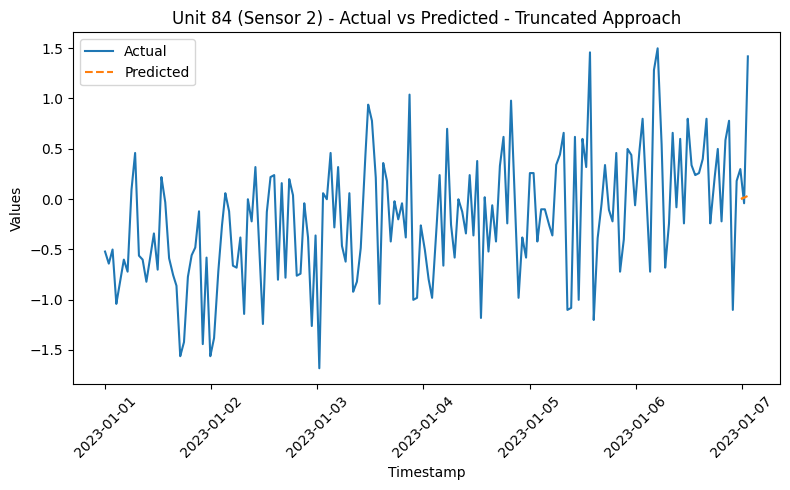

RMSE for Unit 84 - sensor_2: 0.5878972962799734
{'train': [0, 1347], 'valid': [835, 1516], 'test': [1004, 1683]}
1084
Dataset for unit 85 is good


  0%|          | 0/1 [00:00<?, ?it/s]

96
[0.5522051063359293, 0.5427941161721501, 0.533383126008371, 0.5239721358445918, 0.5145611456808126, 0.5051501555170335, 0.49573916535325424, 0.486328175189475, 0.47691718502569586, 0.4675061948619167, 0.45809520469813747, 0.44868421453435825, 0.43927322437057914, 0.4298622342067999, 0.4204512440430207, 0.41104025387924154, 0.40162926371546237, 0.39221827355168315, 0.382807283387904, 0.3733962932241248, 0.3639853030603456, 0.35457431289656643, 0.3451633227327872, 0.33575233256900805, 0.32634134240522883, 0.31693035224144966, 0.3075193620776705, 0.2981083719138913, 0.2886973817501121, 0.2792863915863329, 0.26987540142255373, 0.26046441125877456, 0.25105342109499534, 0.24164243093121618, 0.23223144076743696, 0.2228204506036578, 0.21340946043987863, 0.2039984702760994, 0.19458748011232024, 0.18517648994854102, 0.17576549978476186, 0.16635450962098264, 0.15694351945720347, 0.1475325292934243, 0.13812153912964512, 0.13145542109697006, 0.12478930306429498, 0.11812318503161992, 0.1114570669

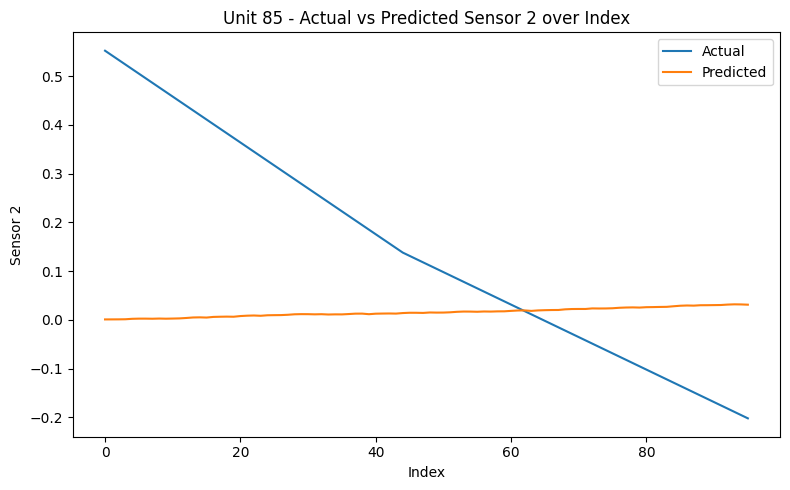

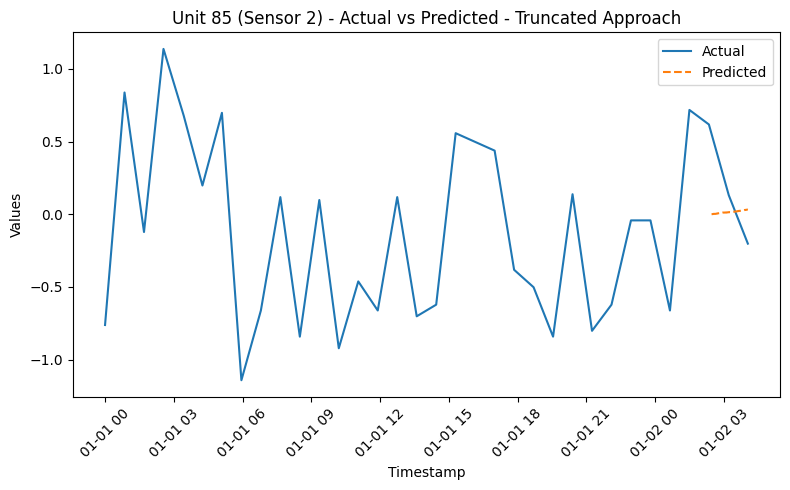

RMSE for Unit 85 - sensor_2: 0.2613306885018911
{'train': [0, 4448], 'valid': [3936, 5004], 'test': [4492, 5559]}
4960
Dataset for unit 86 is good


  0%|          | 0/47 [00:00<?, ?it/s]

96
[0.06871548667170564, 0.08165559814690314, 0.09459570962210063, 0.10753582109729813, 0.12047593257249563, 0.1334160440476931, 0.1463561555228906, 0.1592962669980881, 0.1722363784732856, 0.1851764899484831, 0.1981166014236806, 0.2110567128988781, 0.2239968243740756, 0.23693693584927308, 0.24987704732447055, 0.2628171587996681, 0.27575727027486563, 0.2886973817500631, 0.30163749322526057, 0.3145776047004581, 0.3275177161756556, 0.3404578276508531, 0.35339793912605055, 0.3663380506012481, 0.3792781620764456, 0.39221827355164307, 0.40515838502684054, 0.41809849650203806, 0.4310386079772356, 0.44397871945243306, 0.4569188309276305, 0.46985894240282805, 0.4827990538780256, 0.49573916535322304, 0.5086792768284205, 0.521619388303618, 0.5345594997788156, 0.547499611254013, 0.5604397227292105, 0.5733798342044081, 0.5863199456796055, 0.599260057154803, 0.6122001686300005, 0.625140280105198, 0.6380803915803955, 0.6408252637114996, 0.6435701358426038, 0.6463150079737079, 0.649059880104812, 0.651

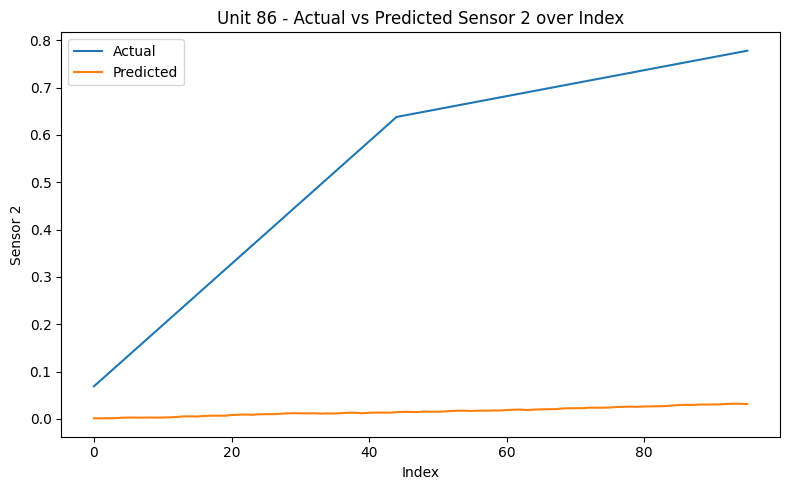

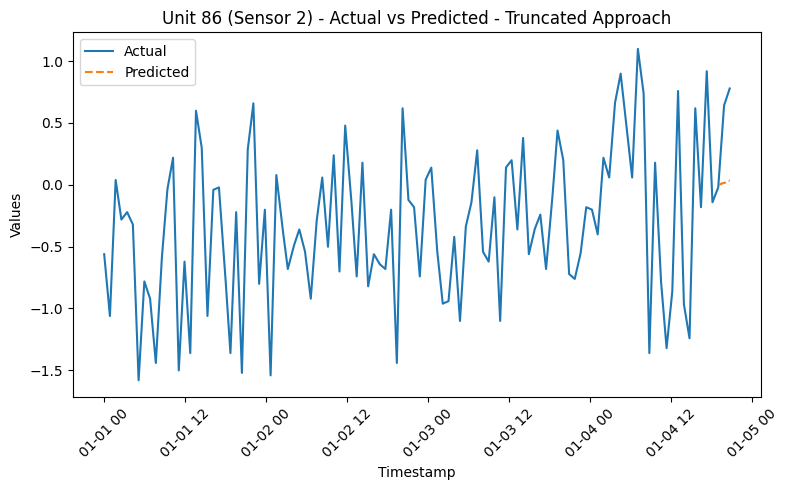

RMSE for Unit 86 - sensor_2: 0.5655265244010622
{'train': [0, 2245], 'valid': [1733, 2525], 'test': [2013, 2805]}
2206
Dataset for unit 87 is good


  0%|          | 0/13 [00:00<?, ?it/s]

96
[-0.015199175621966071, -0.048529765785345874, -0.08186035594872568, -0.11519094611210548, -0.14852153627548523, -0.18185212643886503, -0.21518271660224483, -0.24851330676562458, -0.28184389692900436, -0.31517448709238416, -0.34850507725576396, -0.38183566741914376, -0.41516625758252357, -0.44849684774590337, -0.48182743790928306, -0.5151580280726629, -0.5484886182360427, -0.5818192083994225, -0.6151497985628023, -0.6484803887261821, -0.6818109788895619, -0.7151415690529416, -0.7484721592163214, -0.7818027493797012, -0.815133339543081, -0.8484639297064608, -0.8817945198698406, -0.9151251100332204, -0.9484557001966002, -0.98178629035998, -1.01511688052336, -1.0484474706867397, -1.0817780608501195, -1.1151086510134993, -1.148439241176879, -1.1817698313402587, -1.2151004215036385, -1.2484310116670183, -1.2817616018303981, -1.315092191993778, -1.3484227821571577, -1.3817533723205375, -1.4150839624839173, -1.4484145526472971, -1.481745142810677, -1.4723341526469023, -1.4629231624831274, 

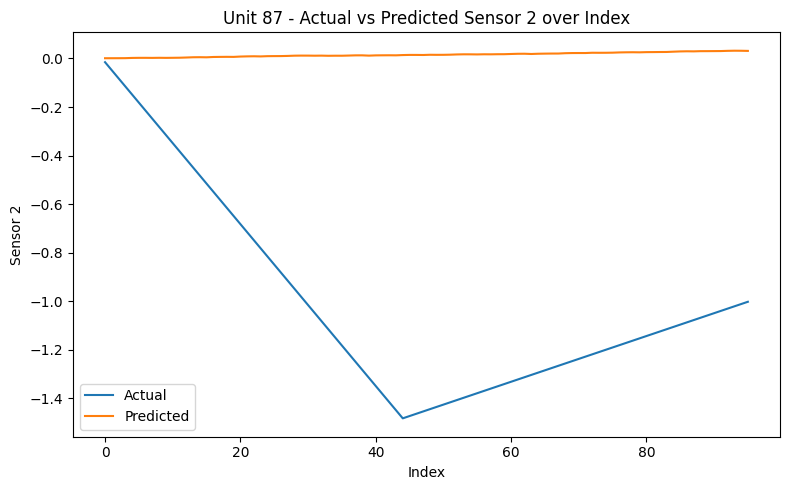

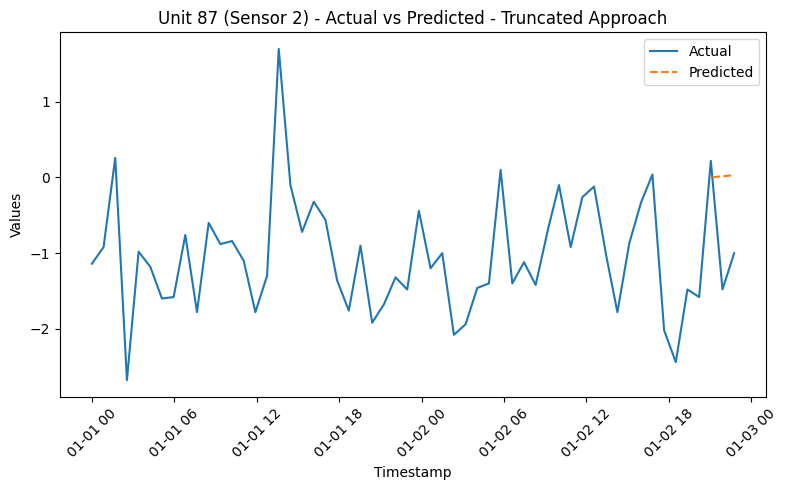

RMSE for Unit 87 - sensor_2: 1.100020252524376
{'train': [0, 2734], 'valid': [2222, 3076], 'test': [2564, 3417]}
2818
Dataset for unit 88 is good


  0%|          | 0/20 [00:00<?, ?it/s]

96
[-0.07754698545699318, -0.042647896932980545, -0.007748808408967911, 0.027150280115044723, 0.062049368639057356, 0.09694845716306993, 0.13184754568708257, 0.1667466342110952, 0.2016457227351079, 0.23654481125912047, 0.27144389978313305, 0.30634298830714574, 0.3412420768311583, 0.376141165355171, 0.4110402538791836, 0.44593934240319627, 0.48083843092720885, 0.5157375194512215, 0.5506366079752341, 0.5855356964992466, 0.6204347850232594, 0.655333873547272, 0.6902329620712846, 0.7251320505952974, 0.76003113911931, 0.7949302276433226, 0.8298293161673351, 0.8647284046913477, 0.8996274932153605, 0.9345265817393731, 0.9694256702633857, 1.0043247587873982, 1.039223847311411, 1.0741229358354236, 1.1090220243594362, 1.1439211128834488, 1.1788202014074614, 1.2137192899314742, 1.2486183784554867, 1.2835174669794993, 1.3184165555035119, 1.3533156440275245, 1.3882147325515373, 1.4231138210755498, 1.4580129095995624, 1.43840668009169, 1.4188004505838172, 1.3991942210759447, 1.3795879915680722, 1.35

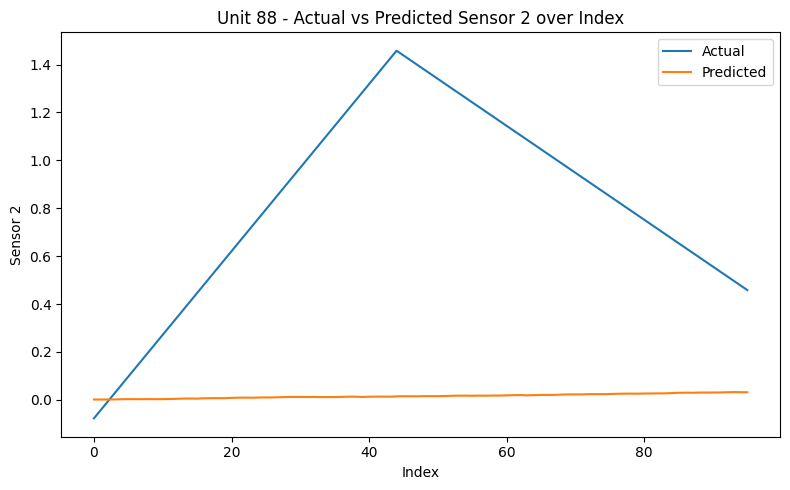

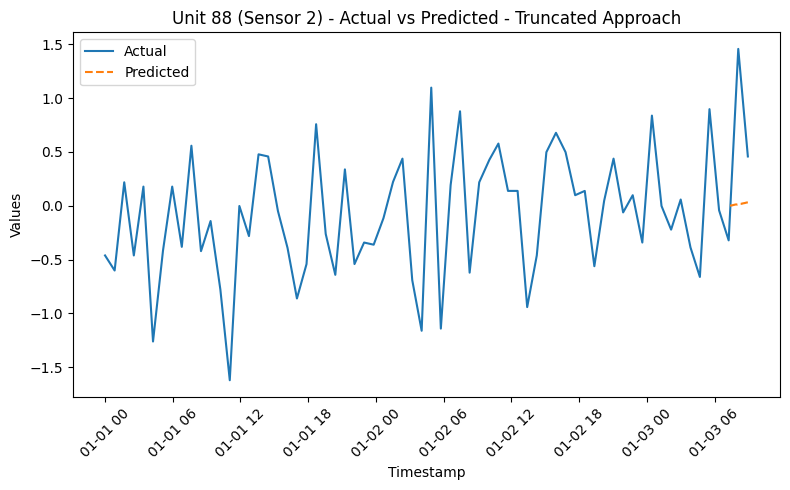

RMSE for Unit 88 - sensor_2: 0.902180362691356
{'train': [0, 7182], 'valid': [6670, 8079], 'test': [7567, 8976]}
8377
Dataset for unit 89 is good


  0%|          | 0/90 [00:00<?, ?it/s]

96
[0.5153453948611, 0.49495491617291326, 0.47456443748472654, 0.45417395879653977, 0.433783480108353, 0.4133930014201662, 0.3930025227319795, 0.3726120440437927, 0.352221565355606, 0.33183108666741923, 0.31144060797923245, 0.29105012929104573, 0.27065965060285896, 0.25026917191467224, 0.22987869322648546, 0.2094882145382987, 0.18909773585011197, 0.1687072571619252, 0.14831677847373848, 0.1279262997855517, 0.10753582109736493, 0.08714534240917815, 0.06675486372099138, 0.04636438503280471, 0.025973906344617936, 0.005583427656431161, -0.014807051031755614, -0.03519752971994239, -0.05558800840812905, -0.07597848709631583, -0.0963689657845026, -0.11675944447268938, -0.13714992316087615, -0.15754040184906282, -0.1779308805372496, -0.19832135922543637, -0.21871183791362314, -0.23910231660180992, -0.2594927952899967, -0.27988327397818336, -0.30027375266637013, -0.3206642313545569, -0.3410547100427437, -0.36144518873093034, -0.38183566741911706, -0.36536643463250573, -0.34889720184589434, -0.3

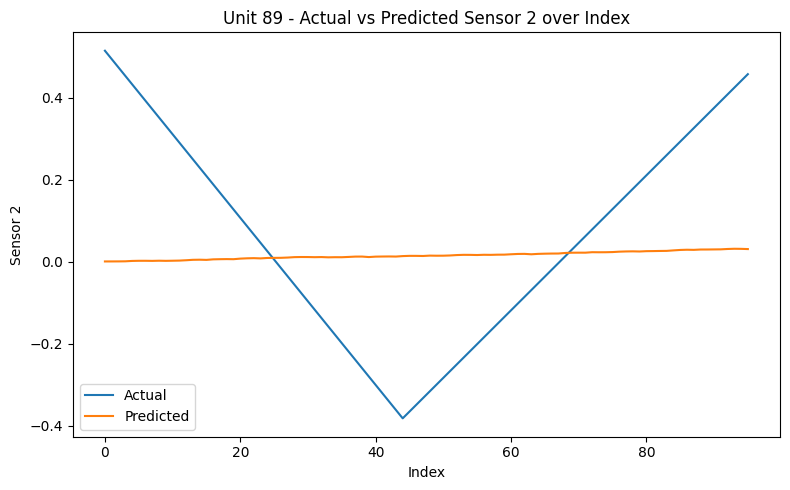

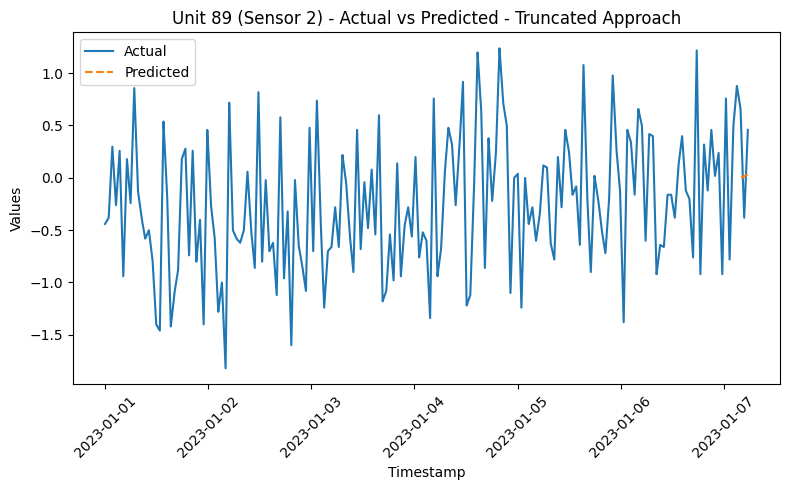

RMSE for Unit 89 - sensor_2: 0.2562335638369408
{'train': [0, 5917], 'valid': [5405, 6656], 'test': [6144, 7395]}
6796
Dataset for unit 90 is good


  0%|          | 0/70 [00:00<?, ?it/s]

96
[-0.21126147070059362, -0.17832300512737093, -0.1453845395541482, -0.11244607398092554, -0.07950760840770282, -0.046569142834480104, -0.01363067726125744, 0.01930778831196528, 0.05224625388518794, 0.08518471945841066, 0.11812318503163333, 0.1510616506048561, 0.18400011617807877, 0.21693858175130143, 0.2498770473245242, 0.28281551289774687, 0.31575397847096953, 0.3486924440441923, 0.38163090961741497, 0.41456937519063763, 0.4475078407638603, 0.4804463063370831, 0.5133847719103057, 0.5463232374835284, 0.5792617030567511, 0.6122001686299738, 0.6451386342031966, 0.6780770997764192, 0.7110155653496419, 0.7439540309228647, 0.7768924964960873, 0.80983096206931, 0.8427694276425328, 0.8757078932157554, 0.9086463587889781, 0.9415848243622009, 0.9745232899354235, 1.0074617555086463, 1.040400221081869, 1.0733386866550916, 1.1062771522283144, 1.1392156178015371, 1.1721540833747597, 1.2050925489479825, 1.238031014521205, 1.2439128833735704, 1.2497947522259356, 1.255676621078301, 1.261558489930666

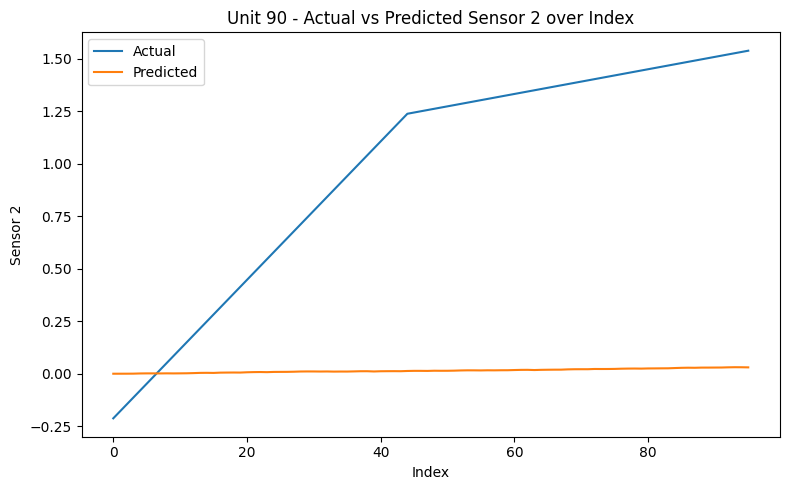

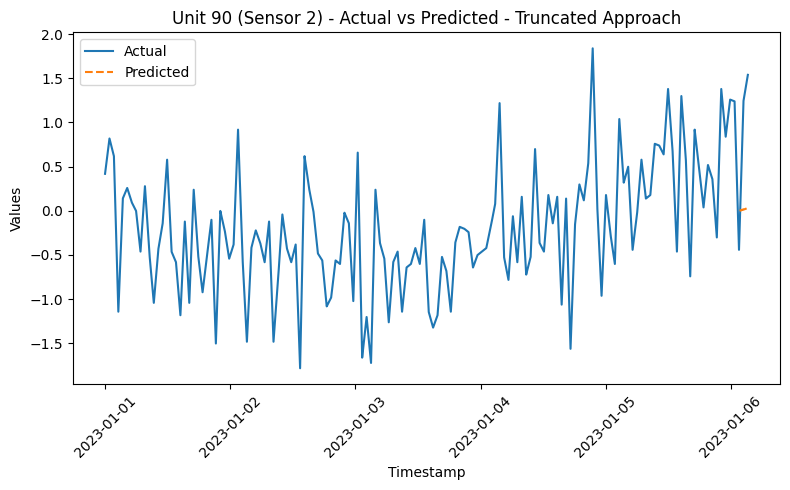

RMSE for Unit 90 - sensor_2: 1.0964060775967865
{'train': [0, 9507], 'valid': [8995, 10696], 'test': [10184, 11883]}
11284
Dataset for unit 91 is good


  0%|          | 0/126 [00:00<?, ?it/s]

96
[1.9105246866413756, 1.8866050866417707, 1.8626854866421656, 1.8387658866425605, 1.8148462866429553, 1.7909266866433504, 1.7670070866437453, 1.7430874866441401, 1.7191678866445352, 1.69524828664493, 1.671328686645325, 1.64740908664572, 1.623489486646115, 1.5995698866465098, 1.5756502866469049, 1.5517306866472997, 1.5278110866476946, 1.5038914866480897, 1.4799718866484846, 1.4560522866488794, 1.4321326866492745, 1.4082130866496694, 1.3842934866500642, 1.3603738866504593, 1.3364542866508542, 1.312534686651249, 1.2886150866516441, 1.264695486652039, 1.2407758866524339, 1.216856286652829, 1.1929366866532238, 1.1690170866536187, 1.1450974866540138, 1.1211778866544087, 1.0972582866548035, 1.0733386866551986, 1.0494190866555935, 1.0254994866559883, 1.0015798866563834, 0.9776602866567783, 0.9537406866571732, 0.9298210866575682, 0.9059014866579631, 0.881981886658358, 0.858062286658753, 0.8608071587898526, 0.8635520309209522, 0.866296903052052, 0.8690417751831516, 0.8717866473142513, 0.874531

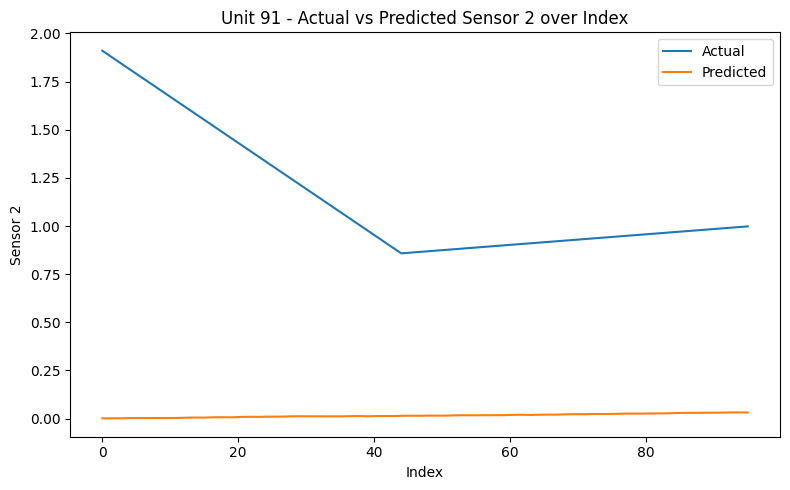

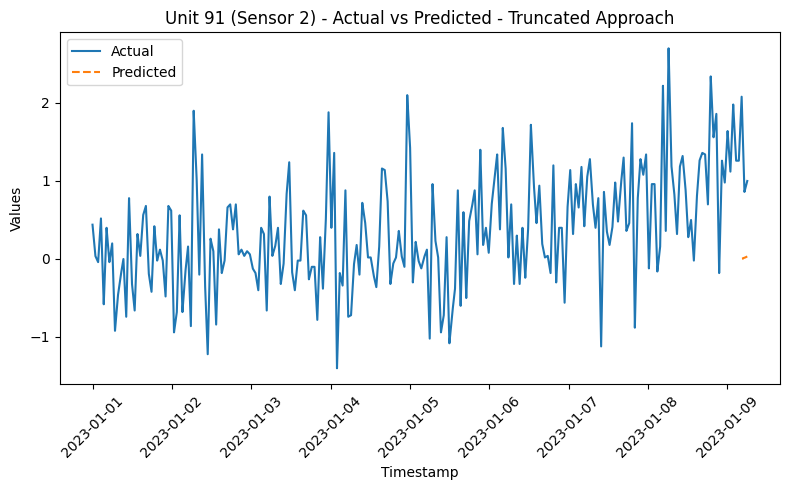

RMSE for Unit 91 - sensor_2: 1.1713344091847604
{'train': [0, 6080], 'valid': [5568, 6840], 'test': [6328, 7599]}
7000
Dataset for unit 92 is good


  0%|          | 0/73 [00:00<?, ?it/s]

96
[0.8470827981343543, 0.8455142997737259, 0.8439458014130975, 0.8423773030524692, 0.8408088046918407, 0.8392403063312124, 0.837671807970584, 0.8361033096099556, 0.8345348112493273, 0.8329663128886988, 0.8313978145280705, 0.8298293161674422, 0.8282608178068137, 0.8266923194461854, 0.8251238210855569, 0.8235553227249286, 0.8219868243643003, 0.8204183260036718, 0.8188498276430435, 0.817281329282415, 0.8157128309217867, 0.8141443325611583, 0.8125758342005299, 0.8110073358399016, 0.8094388374792731, 0.8078703391186448, 0.8063018407580164, 0.804733342397388, 0.8031648440367597, 0.8015963456761313, 0.8000278473155029, 0.7984593489548745, 0.7968908505942461, 0.7953223522336177, 0.7937538538729894, 0.792185355512361, 0.7906168571517326, 0.7890483587911042, 0.7874798604304758, 0.7859113620698475, 0.7843428637092191, 0.7827743653485907, 0.7812058669879623, 0.7796373686273339, 0.7780688702667056, 0.8157128309218179, 0.8533567915769301, 0.8910007522320424, 0.9286447128871548, 0.9662886735422671, 

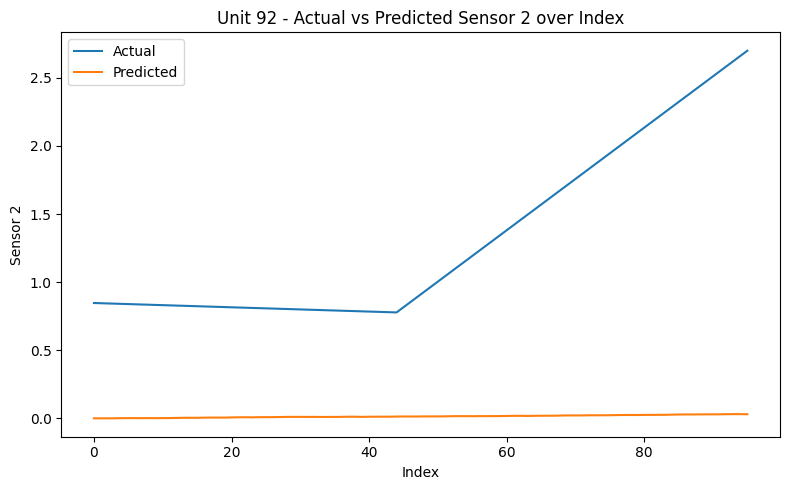

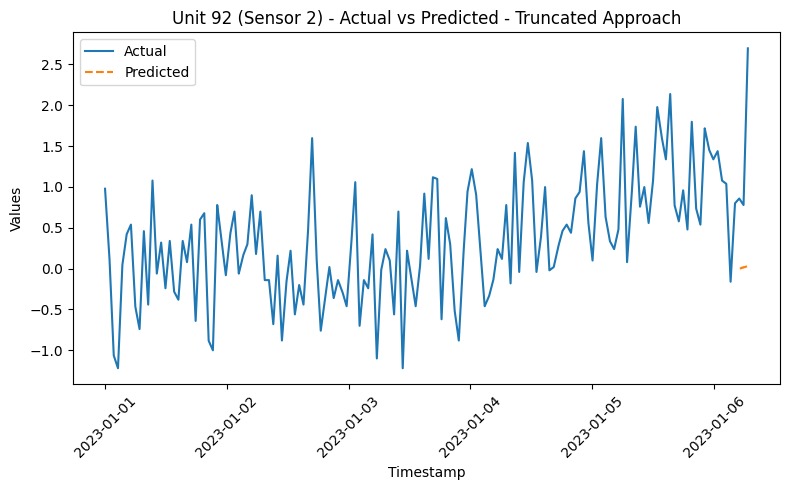

RMSE for Unit 92 - sensor_2: 1.4357660979247353
{'train': [0, 9915], 'valid': [9403, 11155], 'test': [10643, 12393]}
11794
Dataset for unit 93 is good


  0%|          | 0/132 [00:00<?, ?it/s]

96
[0.6867038407598128, 0.6765086014157194, 0.6663133620716261, 0.6561181227275327, 0.6459228833834393, 0.6357276440393459, 0.6255324046952525, 0.6153371653511591, 0.6051419260070658, 0.5949466866629725, 0.5847514473188791, 0.5745562079747857, 0.5643609686306923, 0.5541657292865989, 0.5439704899425055, 0.5337752505984121, 0.5235800112543187, 0.5133847719102254, 0.503189532566132, 0.49299429322203864, 0.48279905387794525, 0.47260381453385186, 0.4624085751897585, 0.45221333584566514, 0.44201809650157176, 0.43182285715747837, 0.421627617813385, 0.4114323784692916, 0.40123713912519826, 0.3910418997811049, 0.3808466604370115, 0.3706514210929181, 0.3604561817488247, 0.3502609424047314, 0.340065703060638, 0.3298704637165446, 0.3196752243724512, 0.30947998502835783, 0.29928474568426444, 0.2890895063401711, 0.2788942669960777, 0.26869902765198433, 0.25850378830789095, 0.24830854896379762, 0.23811330961970426, 0.24674005060316925, 0.2553667915866343, 0.2639935325700993, 0.2726202735535643, 0.281

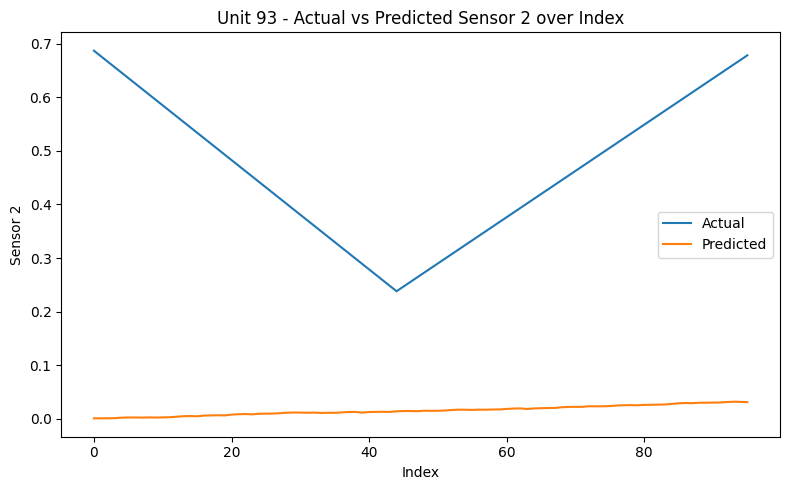

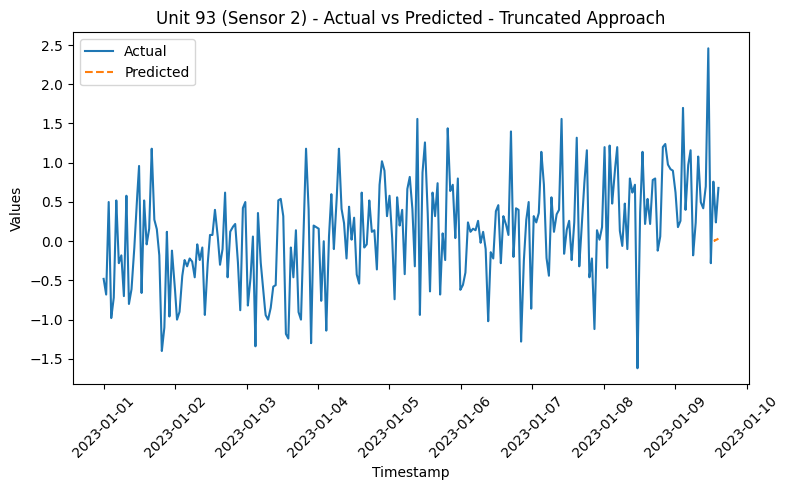

RMSE for Unit 93 - sensor_2: 0.4649562840170418
{'train': [0, 5386], 'valid': [4874, 6060], 'test': [5548, 6732]}
6133
Dataset for unit 94 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[0.42515673912483454, 0.4204512440429449, 0.4157457489610554, 0.41104025387916576, 0.40633475879727615, 0.40162926371538654, 0.396923768633497, 0.3922182735516074, 0.38751277846971777, 0.3828072833878282, 0.3781017883059386, 0.373396293224049, 0.36869079814215944, 0.3639853030602698, 0.3592798079783802, 0.35457431289649066, 0.34986881781460105, 0.34516332273271144, 0.3404578276508219, 0.3357523325689323, 0.33104683748704267, 0.3263413424051531, 0.32163584732326345, 0.3169303522413739, 0.3122248571594843, 0.30751936207759467, 0.3028138669957051, 0.2981083719138155, 0.2934028768319259, 0.28869738175003634, 0.28399188666814673, 0.2792863915862571, 0.27458089650436757, 0.26987540142247796, 0.26516990634058835, 0.2604644112586988, 0.2557589161768092, 0.25105342109491957, 0.24634792601303, 0.24164243093114038, 0.2369369358492508, 0.23223144076736119, 0.2275259456854716, 0.22282045060358202, 0.21811495552169244, 0.21733070634137824, 0.21654645716106405, 0.21576220798074988, 0.2149779588004

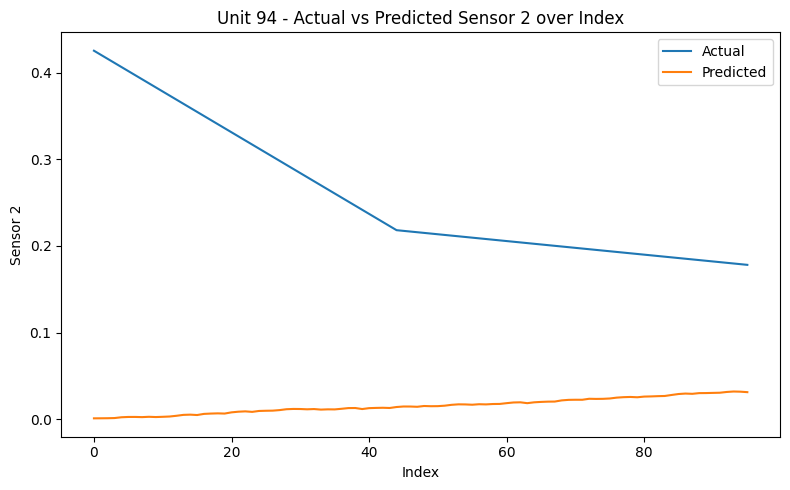

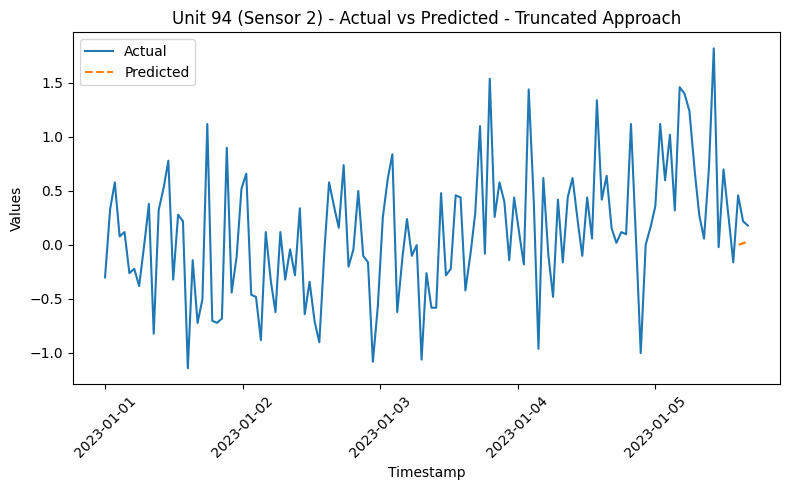

RMSE for Unit 94 - sensor_2: 0.25414572397249496
{'train': [0, 3591], 'valid': [3079, 4040], 'test': [3528, 4488]}
3889
Dataset for unit 95 is good


  0%|          | 0/34 [00:00<?, ?it/s]

96
[-0.10852482807933235, -0.09519259201398221, -0.08186035594863207, -0.06852811988328195, -0.05519588381793181, -0.04186364775258167, -0.028531411687231528, -0.015199175621881417, -0.0018669395565312774, 0.011465296508818862, 0.024797532574169, 0.03812976863951914, 0.05146200470486928, 0.06479424077021939, 0.07812647683556956, 0.09145871290091967, 0.10479094896626978, 0.11812318503161995, 0.13145542109697006, 0.14478765716232023, 0.15811989322767034, 0.17145212929302045, 0.18478436535837062, 0.19811660142372073, 0.2114488374890709, 0.224781073554421, 0.23811330961977112, 0.2514455456851213, 0.2647777817504714, 0.27811001781582156, 0.2914422538811717, 0.30477448994652184, 0.3181067260118719, 0.33143896207722207, 0.34477119814257223, 0.3581034342079224, 0.37143567027327246, 0.3847679063386226, 0.3981001424039728, 0.41143237846932285, 0.424764614534673, 0.4380968506000232, 0.45142908666537324, 0.4647613227307234, 0.4780935587960735, 0.4408417227311183, 0.40358988666616313, 0.36633805060

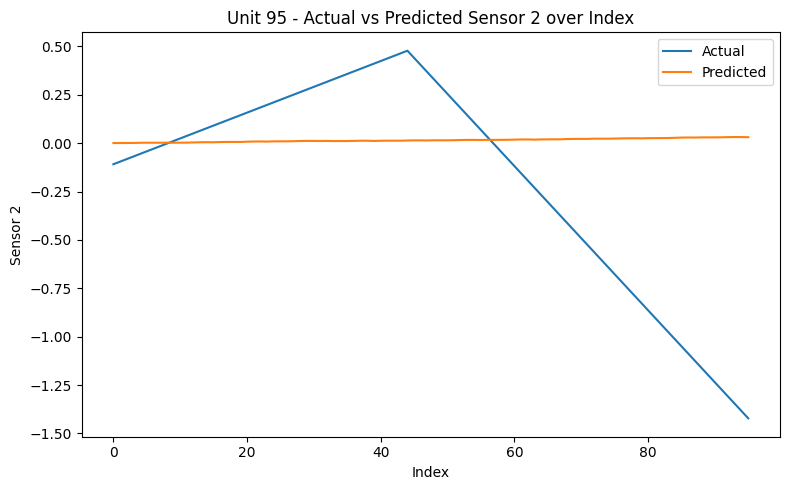

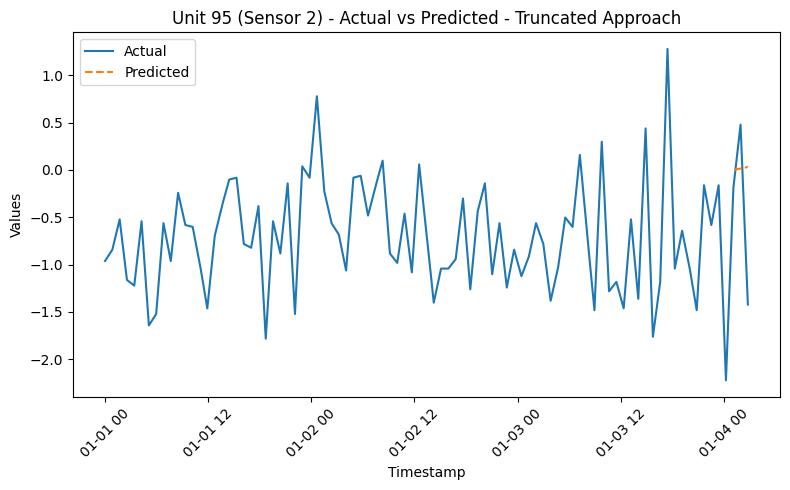

RMSE for Unit 95 - sensor_2: 0.5751974404253294
{'train': [0, 3918], 'valid': [3406, 4407], 'test': [3895, 4896]}
4297
Dataset for unit 96 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[-1.0802095624894912, -1.0657009526536652, -1.0511923428178394, -1.0366837329820136, -1.0221751231461875, -1.0076665133103617, -0.9931579034745358, -0.9786492936387099, -0.9641406838028841, -0.9496320739670582, -0.9351234641312323, -0.9206148542954065, -0.9061062444595805, -0.8915976346237546, -0.8770890247879288, -0.8625804149521029, -0.848071805116277, -0.8335631952804512, -0.8190545854446253, -0.8045459756087994, -0.7900373657729736, -0.7755287559371477, -0.7610201461013217, -0.7465115362654959, -0.73200292642967, -0.7174943165938441, -0.7029857067580183, -0.6884770969221924, -0.6739684870863665, -0.6594598772505407, -0.6449512674147148, -0.6304426575788888, -0.615934047743063, -0.6014254379072371, -0.5869168280714112, -0.5724082182355854, -0.5578996083997595, -0.5433909985639336, -0.5288823887281078, -0.5143737788922819, -0.49986516905645595, -0.48535655922063015, -0.47084794938480423, -0.4563393395489783, -0.4418307297131525, -0.44810472315567496, -0.4543787165981974, -0.460652

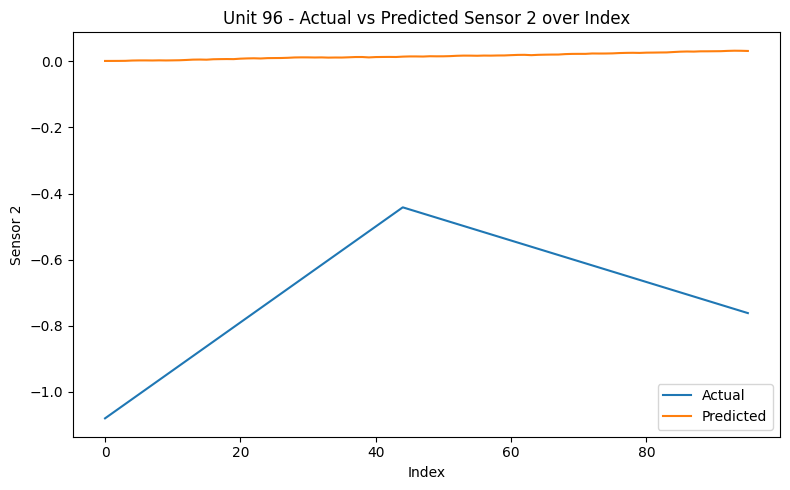

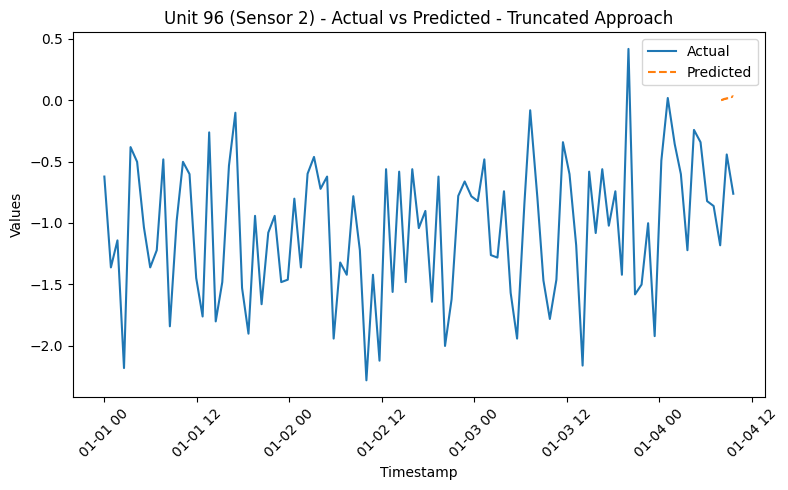

RMSE for Unit 96 - sensor_2: 0.7122862070484937
{'train': [0, 5427], 'valid': [4915, 6106], 'test': [5594, 6783]}
6184
Dataset for unit 97 is good


  0%|          | 0/62 [00:00<?, ?it/s]

96
[-0.9562981919997154, -0.9555139428194012, -0.954729693639087, -0.9539454444587728, -0.9531611952784587, -0.9523769460981445, -0.9515926969178302, -0.950808447737516, -0.9500241985572019, -0.9492399493768877, -0.9484557001965735, -0.9476714510162593, -0.9468872018359451, -0.9461029526556309, -0.9453187034753168, -0.9445344542950026, -0.9437502051146884, -0.9429659559343742, -0.94218170675406, -0.9413974575737458, -0.9406132083934317, -0.9398289592131175, -0.9390447100328032, -0.938260460852489, -0.9374762116721749, -0.9366919624918607, -0.9359077133115465, -0.9351234641312323, -0.9343392149509181, -0.9335549657706039, -0.9327707165902898, -0.9319864674099756, -0.9312022182296613, -0.9304179690493471, -0.929633719869033, -0.9288494706887188, -0.9280652215084046, -0.9272809723280904, -0.9264967231477762, -0.925712473967462, -0.9249282247871479, -0.9241439756068337, -0.9233597264265194, -0.9225754772462053, -0.9217912280658911, -0.9072826182300652, -0.8927740083942394, -0.8782653985584

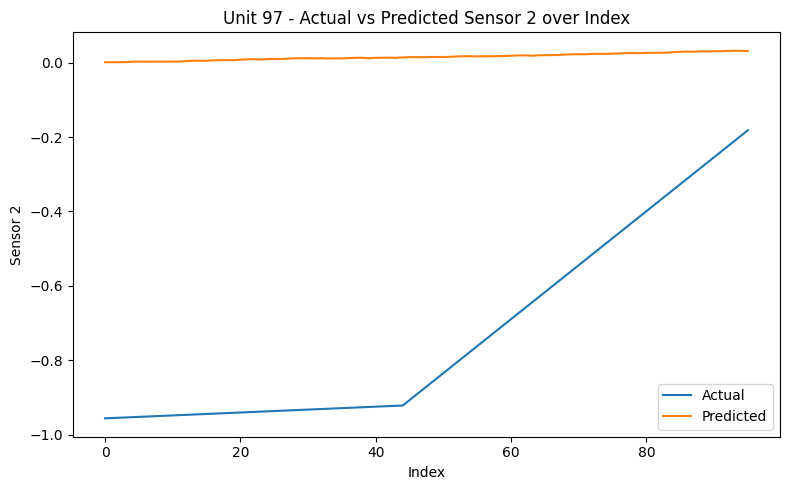

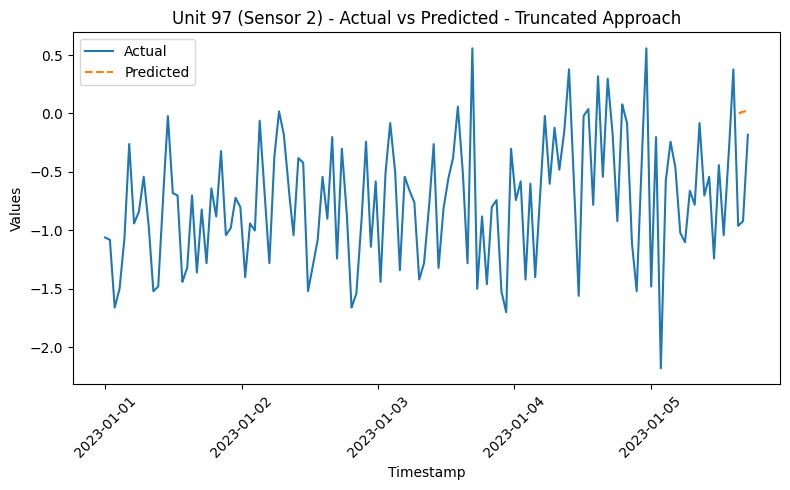

RMSE for Unit 97 - sensor_2: 0.7837195469003987
{'train': [0, 4897], 'valid': [4385, 5509], 'test': [4997, 6120]}
5521
Dataset for unit 98 is good


  0%|          | 0/54 [00:00<?, ?it/s]

96
[0.7286611719068492, 0.7216029292840126, 0.714544686661176, 0.7074864440383394, 0.7004282014155028, 0.6933699587926662, 0.6863117161698296, 0.679253473546993, 0.6721952309241563, 0.6651369883013197, 0.6580787456784831, 0.6510205030556464, 0.6439622604328098, 0.6369040178099732, 0.6298457751871366, 0.6227875325643, 0.6157292899414634, 0.6086710473186268, 0.6016128046957901, 0.5945545620729535, 0.5874963194501169, 0.5804380768272803, 0.5733798342044436, 0.5663215915816071, 0.5592633489587704, 0.5522051063359338, 0.5451468637130972, 0.5380886210902606, 0.531030378467424, 0.5239721358445874, 0.5169138932217507, 0.509855650598914, 0.5027974079760775, 0.49573916535324086, 0.48868092273040425, 0.48162268010756765, 0.47456443748473104, 0.4675061948618944, 0.46044795223905777, 0.45338970961622116, 0.44633146699338455, 0.43927322437054794, 0.43221498174771134, 0.42515673912487467, 0.41809849650203806, 0.40986388010873015, 0.40162926371542224, 0.3933946473221144, 0.38516003092880646, 0.3769254

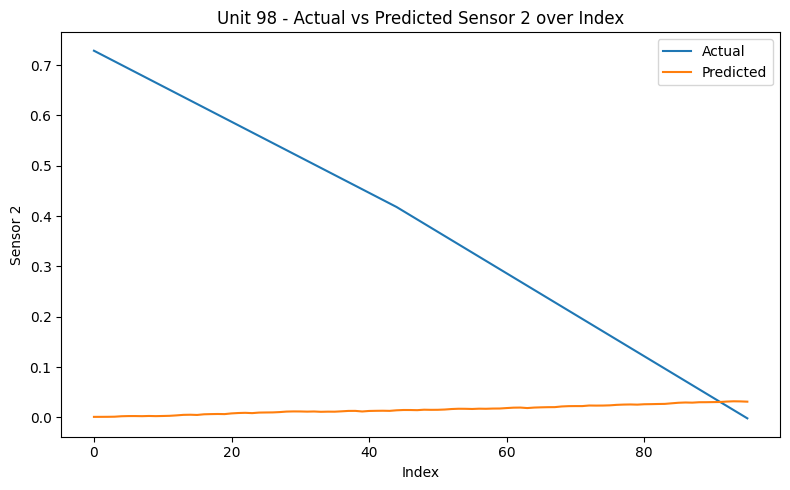

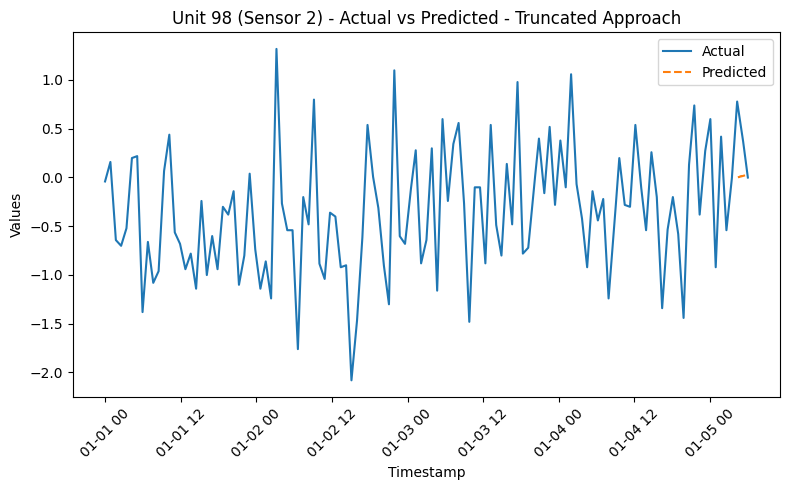

RMSE for Unit 98 - sensor_2: 0.4245223211617504
{'train': [0, 3918], 'valid': [3406, 4407], 'test': [3895, 4896]}
4297
Dataset for unit 99 is good


  0%|          | 0/39 [00:00<?, ?it/s]

96
[0.10910431945792651, 0.09067446372052967, 0.07224460798313284, 0.053814752245736036, 0.0353848965083392, 0.01695504077094237, -0.0014748149664544352, -0.01990467070385124, -0.0383345264412481, -0.05676438217864491, -0.07519423791604171, -0.09362409365343857, -0.11205394939083538, -0.13048380512823218, -0.14891366086562904, -0.16734351660302585, -0.18577337234042265, -0.20420322807781952, -0.22263308381521632, -0.24106293955261313, -0.2594927952900099, -0.27792265102740676, -0.2963525067648036, -0.3147823625022005, -0.33321221823959724, -0.3516420739769941, -0.37007192971439096, -0.3885017854517877, -0.40693164118918457, -0.42536149692658143, -0.4437913526639782, -0.46222120840137504, -0.4806510641387719, -0.49908091987616865, -0.5175107756135655, -0.5359406313509624, -0.5543704870883591, -0.572800342825756, -0.5912301985631528, -0.6096600543005496, -0.6280899100379465, -0.6465197657753433, -0.6649496215127401, -0.6833794772501369, -0.7018093329875337, -0.7147494444627311, -0.727689

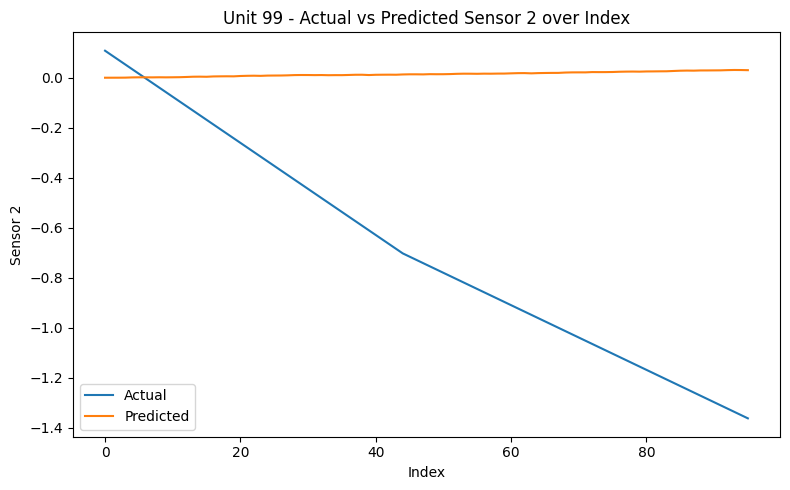

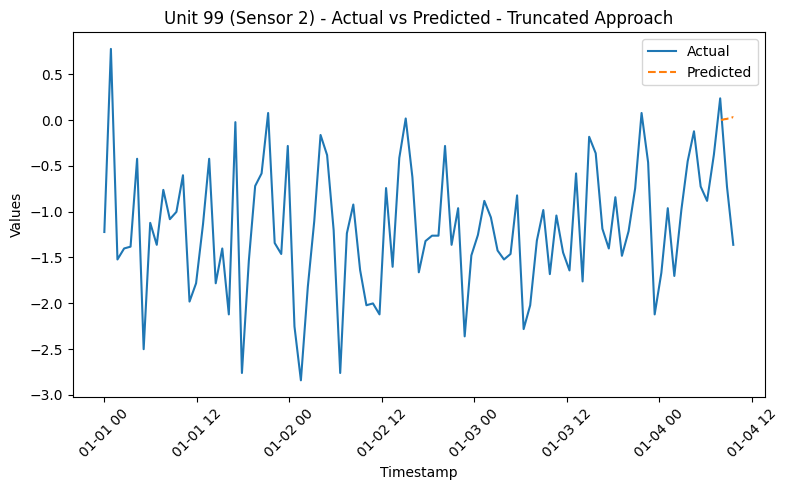

RMSE for Unit 99 - sensor_2: 0.8303388251756207
{'train': [0, 8038], 'valid': [7526, 9043], 'test': [8531, 10047]}
9448
Dataset for unit 100 is good


  0%|          | 0/103 [00:00<?, ?it/s]

96
[1.468600273533969, 1.4615420309111324, 1.4544837882882957, 1.447425545665459, 1.4403673030426225, 1.4333090604197858, 1.4262508177969493, 1.4191925751741126, 1.412134332551276, 1.4050760899284394, 1.3980178473056029, 1.3909596046827661, 1.3839013620599294, 1.376843119437093, 1.3697848768142562, 1.3627266341914197, 1.355668391568583, 1.3486101489457465, 1.3415519063229098, 1.3344936637000733, 1.3274354210772366, 1.3203771784544, 1.3133189358315633, 1.3062606932087268, 1.2992024505858901, 1.2921442079630534, 1.285085965340217, 1.2780277227173802, 1.2709694800945437, 1.263911237471707, 1.2568529948488703, 1.2497947522260338, 1.2427365096031973, 1.2356782669803605, 1.2286200243575238, 1.2215617817346873, 1.2145035391118506, 1.207445296489014, 1.2003870538661774, 1.193328811243341, 1.1862705686205042, 1.1792123259976677, 1.172154083374831, 1.1650958407519942, 1.1580375981291577, 1.145881735834279, 1.1337258735394, 1.1215700112445213, 1.1094141489496423, 1.0972582866547635, 1.08510242435

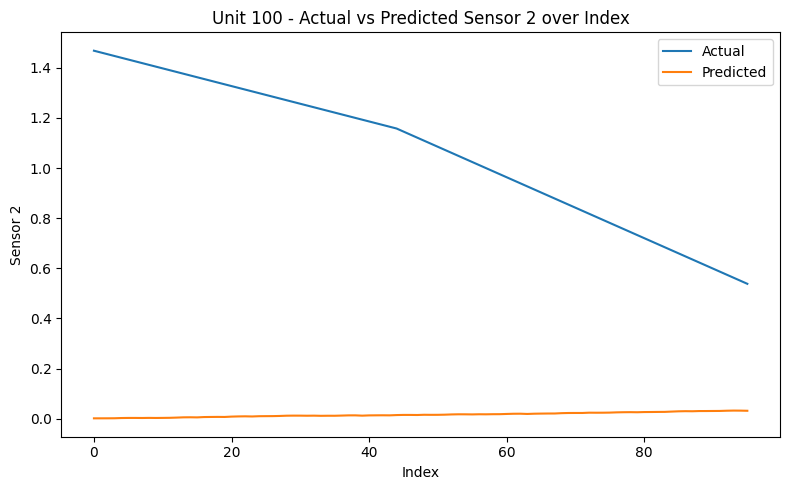

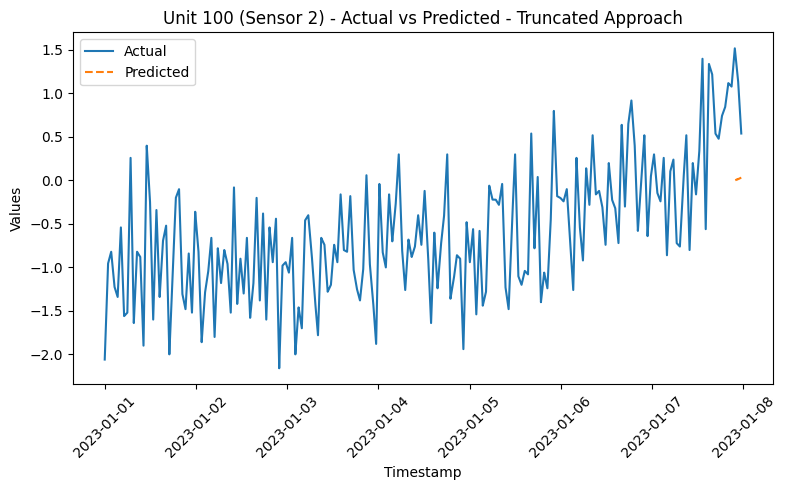

RMSE for Unit 100 - sensor_2: 1.0853040909062421


In [91]:
# Forecast each unit's sensor data
# Assuming the necessary variables (e.g., train_df, context_length, tsp, timestamp_column, target_columns) are defined

unit_list = []
rmse_list = []
split_configs = generate_split_configs(train_df, context_length)

for unit in train_df['unit_number'].unique():
    unit = int(unit)
    df_subset = train_df[train_df['unit_number'] == unit]
    df_subset = df_subset.reset_index(drop=True)
    df_truncate = df_subset.tail(600)
    df_subset_full = df_subset.copy()
    df_subset = df_subset.iloc[:-600]  # Remove the last 600 rows

    # Set values in 'sensor_2' column of df_truncate to NaN
    df_truncate['sensor_2'] = np.nan

    # Get split configuration for the current unit
    split_config = split_configs[unit - 1]  # Access by index

    # Run data checks for debug
    print(split_config)
    print(len(df_subset))
    if df_subset is None or len(df_subset) == 0:
        print(f"No data available for unit {unit}")
    else:
        print(f"Dataset for unit {unit} is good")

    # Reset Preprocessor
    tsp = TimeSeriesPreprocessor(
      **column_specifiers,
      context_length=context_length,
      prediction_length=forecast_length,
      scaling=False,
      encode_categorical=True,
      scaler_type="standard",
    )
    
    # Generate datasets based on the split configuration
    train_dataset, valid_dataset, test_dataset = get_datasets(tsp, dataset=df_subset, split_config=split_config)
    
    # Assign the zeroshot model
    zeroshot_model = TinyTimeMixerForPrediction.from_pretrained("ibm/TTM", revision="main", prediction_filter_length=prediction_filter)

    # Initialize trainer with the model
    zeroshot_trainer = Trainer(
        model=zeroshot_model,
    )

    # Evaluate the model on the test dataset
    zeroshot_trainer.evaluate(test_dataset)

    # Create a forecasting pipeline
    zs_forecast_pipeline = TimeSeriesForecastingPipeline(
        model=zeroshot_model,
        device="cpu",
        timestamp_column=timestamp_column,
        id_columns=[],  # Adjust id_columns if needed
        target_columns=target_columns,
        freq="1m"
    )

    # Retrieve test data start and end indices
    test_start_index, test_end_index = split_config['test']

    # Generate forecast
    processed_data = tsp.preprocess(df_subset[test_start_index:test_end_index])
    processed_data = tsp.preprocess(df_truncate)
    zs_forecast = zs_forecast_pipeline(processed_data)
    print(len(zs_forecast['sensor_2_prediction'].values[0]))

    actual = [df_subset_full['sensor_2'].values[-prediction_filter:]]

    pred = zs_forecast['sensor_2_prediction'].values[0]
    actual = actual[0].tolist()
    time = zs_forecast['timestamp'].values[0]

    print(actual)
    print(pred)
    print(time)

    # Plot actual vs predicted values over each index
    plt.figure(figsize=(8,5))
    plt.plot(range(len(actual)), actual, label='Actual')
    plt.plot(range(len(pred)), pred, label='Predicted')
    plt.xlabel('Index')
    plt.ylabel('Sensor 2')
    plt.title(f'Unit {unit} - Actual vs Predicted Sensor 2 over Index')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Add 'pred' column to df_subset_full with NaN values
    df_subset_full['pred'] = np.nan

    # Fill the last 'prediction_filter' rows of 'pred' column with the predicted values
    df_subset_full.iloc[-prediction_filter:, df_subset_full.columns.get_loc('pred')] = pred

    # Plot the full series of 'sensor_2' and 'pred' against 'timestamp'
    plt.figure(figsize=(8,5))
    plt.plot(df_subset_full['timestamp'], df_subset_full['sensor_2'], label='Actual')
    plt.plot(df_subset_full['timestamp'], df_subset_full['pred'], label='Predicted', linestyle='--')

    # Add labels and legend
    #plt.axvline(x=df_subset['timestamp'].iloc[test_start_index], color='red', linestyle='--', label='Test Start')
    plt.xlabel('Timestamp')
    plt.ylabel('Values')
    plt.title(f'Unit {unit} (Sensor 2) - Actual vs Predicted - Truncated Approach')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Calculate RMSE for the unit
    rmse = np.sqrt(mean_squared_error(actual, pred))
    print(f"RMSE for Unit {unit} - {target_columns[0]}: {rmse}")
    unit_list.append(unit)
    rmse_list.append(rmse)
    

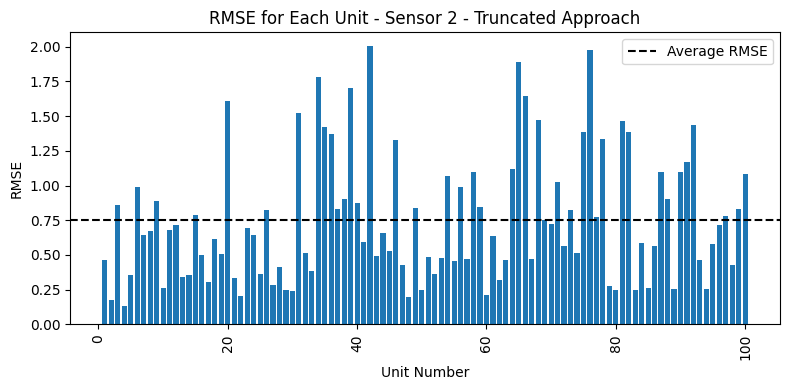

Average RMSE:  0.7520622124268556


In [92]:
plt.figure(figsize=(8, 4))
plt.bar(unit_list, rmse_list)
plt.axhline(y=np.mean(rmse_list), color='black', linestyle='--', label='Average RMSE')
plt.xlabel('Unit Number')
plt.ylabel('RMSE')
plt.title('RMSE for Each Unit - Sensor 2 - Truncated Approach')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

print("Average RMSE: ", np.mean(rmse_list))